# This notebook generates pi0 plots for specific set of pickles

In [1]:
%matplotlib inline
import platform
print(platform.python_version())
from ROOT import TFile,vector
import ROOT

import matplotlib.pyplot as plt
import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.optimize import curve_fit
from scipy import asarray as ar,exp
from matplotlib.patches import Rectangle
from matplotlib.collections import PatchCollection
import math


import pickle
import pandas as pd
import numpy as np
from numpy import mean
from math import sqrt,acos,cos,sin,pi,exp,log,isnan,atan2
from numpy import asarray
from root_pandas import read_root
from matplotlib import gridspec
from scipy import stats
from scipy.interpolate import interp1d
from scipy.integrate import quad
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
from textwrap import wrap
import copy

import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

3.5.2
Welcome to JupyROOT 6.14/08


In [2]:
# davios functions for plotting...

def Tune1(df):
    return df['xsec_tune1_weight'].values

def CV(df):
    wgt = []
    if 'xsec_corr_weight' in df.columns:
        wgt = df['xsec_corr_weight'].values
    else:
        for i in range(len(df)):
            wgt.append(1.0)
#     if False:
    if 'new_weight' in df.columns:
        tmpweights1 = df['new_weight'].values

    else:
        tmpweights1 = []
        for i in range(len(wgt)):
            tmpweights1.append(1.0)
    
    if 'pot_weight' in df.columns:
#     if False:
        tmpweights2 = df['pot_weight'].values
    else:
        tmpweights2 = []
        for i in range(len(wgt)):
            tmpweights2.append(1.0)
            
    for i in range(len(wgt)):
        wgt[i] = wgt[i]*tmpweights1[i]*tmpweights2[i]
#         
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    
    return wgt

def Spline(df):
    wgt = df['spline_weight'].values
    wgt[wgt == np.inf] = 1
    wgt = np.nan_to_num(wgt)
    wgt[wgt <= 0] = 1
    return wgt


class sampHist:

    def __init__(self,samp_df,samp_l,samp_c,samp_wind,samp_s):
        self._df = samp_df.copy()
        self._label = samp_l
        self._color = samp_c
        self._scale = samp_s
        self._wi = samp_wind
        if samp_wind == 0:
            self._wgt = np.ones(len(samp_df))
        if samp_wind == 1:
            self._wgt = CV(samp_df)

    def setweight(self,windex):
        if windex == 0:
            self._wgt = np.ones(len(self._df))
        if windex == 1:
            self._wgt = CV(self._df)

    def dist(self,s_var):
        return self._df[s_var].values

    def cosdist(self,s_var):
        return np.cos(self._df[s_var].values)

    def applycut(self,s_cut):
        newhist = copy.deepcopy(self)
        newhist._df = self._df.query(s_cut)
        newhist.setweight(self._wi)
        return newhist

class SimpleHisto:

    def __init__ (self,df_df,f_scale,i_wgt,s_color,s_label):
        temp_df = df_df.copy()
        temp_df['myscale'] = f_scale
        self.mydf = temp_df
        self.mycolor = s_color
        self.mylabel = s_label
        self.iwgt = i_wgt

        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def GetHist(self,s_varname):
        temp_df = self.mydf.query(self.mycut)
        if self.iwgt == 1:
            myweight = CV(temp_df)
        elif self.iwgt == 0:
            myweight = np.ones(len(temp_df))
        return temp_df[s_varname].values,myweight,temp_df['myscale'].values,self.mycolor,self.mylabel

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

class StackedHisto:

    def  __init__ (self,a_df_mc,a_df_scale):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layeriwgt = []
        self.stratxweight = []

        temp_a_df = []
        for i in range(len(a_df_mc)):
            temp_df = a_df_mc[i].copy()
            temp_df['myscale'] = a_df_scale[i]
            temp_a_df.append(temp_df)
        self.mymc = pd.concat(temp_a_df)
        self.mycut ='(shower1_E_Y>0 or shower1_E_Y<=0)'


    def ClearCut(self):
        self.mycut = 'Enu_1m1p > 0'

    def AddCut(self,s_cut):
        self.mycut  = s_cut

    def AddLayer(self,df_layer,df_scale,i_wgt,s_label,s_color):
        temp_df = df_layer.copy()
        temp_df['myscale'] = df_scale
        self.mylayer.append(temp_df)
        self.layerlabel.append(s_label)
        self.layercolor.append(s_color)
        self.layeriwgt.append(i_wgt)

    def AddStrata(self,s_strata,s_label,s_color,f_wgt=1.0):
        self.mystrata.append(s_strata)
        self.stratalabel.append(s_label)
        self.stratacolor.append(s_color)
        self.stratxweight.append(f_wgt)

    def GetHists(self,s_varname):
        a_vals = []        # (nxN)
        a_wgts = []
        a_scale = []
        a_cols = []        # (nx1)
        a_labels = []

        # first, run  through strata
        for i in range(len(self.mystrata)):
            # isolate this stratum with current cut
            temp_df = self.mymc.query(self.mystrata[i]+' and '+self.mycut)
            print(len(temp_df))
            a_vals.append(temp_df[s_varname].values)
            a_wgts.append(CV(temp_df) * self.stratxweight[i])   # ah, this is if we want to scale an individual stratum
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.stratacolor[i])
            a_labels.append(self.stratalabel[i])

        for i in range(len(self.mylayer)):
            temp_df = self.mylayer[i].query(self.mycut)

            a_vals.append(temp_df[s_varname].values)
            if self.layeriwgt[i] == 1:
                a_wgts.append(CV(temp_df))
            elif self.layeriwgt[i] == 0:
                a_wgts.append(np.ones(len(temp_df)))
            a_scale.append(temp_df['myscale'].values)

            a_cols.append(self.layercolor[i])
            a_labels.append(self.layerlabel[i])

        return  np.asarray(a_vals),np.asarray(a_wgts),np.asarray(a_scale),a_cols,a_labels

    def ClearLayers(self):
        self.mylayer = []
        self.layerlabel = []
        self.layercolor = []
        self.layerwgt = []

    def ClearStrata(self):
        self.mystrata = []
        self.stratalabel = []
        self.stratacolor = []


class distVar:

    def __init__(self,s_name,n_range,s_label='',s_cov=''):
        self.myname = s_name
        self.myrange = n_range
        self.myscov = s_cov
        if s_label == '':
            self.mylabel = s_name
        else:
            self.mylabel = s_label
            
def PmuGivenX(mu,x):

    # Returns the probability density value that the true mean is mu given that you
    # have observed x events. Actually employs a series approximation because the real formula
    # involves a very very large numerator and denominator and overflows even high precision
    # variables if your bins contain more than a few hundred events
    # Approximation is good to O(0.1%) or better at all values

    pi  = np.pi
    c   = [1.,-1./12,1./288,139./51840,-571./2488320,-163879./209018880]

    if x == 0:
        return np.exp(-mu)
    else:
        poly = sum(c[i]/x**(i+0.5) for i in range(len(c)))
        return 1/np.sqrt(2*pi)*np.exp(x+x*np.log(mu/x)-mu)*poly


def distplot_wratio_davio(myvar,nbins,myrange,stackedhists,datahist,stxcoord,m_cov,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #consFac is new and consolidates all MC strata whose contribution is less than a given percent threshold.
    # (my legend was too full of useless stuff)

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    data_vals,data_wgt,data_scale,_,data_label = datahist.GetHist(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i]+' (%.2f)'%h1.sum())
        a_cols_draw.append(gh_cols[i])


    print("mcbins: ",vals_mc_raw)
    vals_data_raw,_ = np.histogram(data_vals,nbins,range=myrange,weights=data_wgt)
    vals_data,_ = np.histogram(data_vals,nbins,range=myrange,weights=np.multiply(data_wgt,data_scale))
    bincenters = np.diff(binedges)/2 + binedges[:-1]

    #jarretbars
    a_obslo = []
    a_obshi = []
    for i in range(nbins):
        obslo,obshi = GetErrorsData(vals_data[i])
        a_obshi.append(obshi-vals_data[i])
        a_obslo.append(vals_data[i]-obslo)

    #m_cov is fractional, so we multiply it by MC
    for i in range(nbins):
        for j in range(nbins):
            if(vals_mc[i] > 0 and vals_mc[j] > 0):
                m_cov[i][j] *= vals_mc[i]*vals_mc[j]
#             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
#                 m_cov[i][j] = 0
            else:
                m_cov[i][j] = 0
#             else:
#                 print("uh oh!",vals_mc[i],vals_mc[j] )

    # Normalization uncertainty:
    for i in range(len(m_cov)):
        for j in range(len(m_cov[i])):
            if math.isnan(m_cov[i][j]):
                m_cov[i][j]=0.0000000001
                
    fNorm_squared = m_cov.sum() / np.power(vals_mc.sum(),2)
#     print("first", m_cov)
    print('Normalization Uncertainty:',np.sqrt(fNorm_squared))

    yerr_mc_sys = np.sqrt(np.diag(m_cov))
    yerr_mc_total = np.sqrt(np.diag(m_cov) + yerrsq_mc)
    print("yerr_mc_total", yerr_mc_total)

    yerrsq_data = np.zeros(nbins)
    for i in range(nbins):
        if vals_mc_raw[i] > 0:
            ndof += 1
            if vals_data[i] > 0:
                yerrsq_data[i] += (3.0*vals_data[i]*vals_mc[i]*normshift)/(vals_mc[i]*normshift+2.0*vals_data[i])
            else:
                yerrsq_data[i] += vals_mc[i]*normshift/2.0
            m_cov[i][i] += yerrsq_data[i] + yerrsq_mc[i]
        else:
            m_cov[i][i] += 999

        
    yerr_data = np.sqrt(yerrsq_data)
    print("yerr_data", sum(yerr_data))
    er_rat_line = np.zeros(nbins)
    er_rat_line_sys = np.zeros(nbins)
    er_rat_dotshi = np.zeros(nbins)
    er_rat_dotslo = np.zeros(nbins)

    for i in range(nbins):
        if vals_mc[i] > 0:
            er_rat_line[i] = yerr_mc_total[i]/float(vals_mc[i])
            er_rat_line_sys[i] = yerr_mc_sys[i]/float(vals_mc[i])
            er_rat_dotshi[i] = a_obshi[i]/float(vals_mc[i])
            er_rat_dotslo[i] = a_obslo[i]/float(vals_mc[i])

    chisq = 0.0
    invcov = np.linalg.inv(m_cov)
    print('ERROR HERE')
    print(er_rat_dotslo)
    print(er_rat_dotshi)

    # calc chi2
    print ("chi2 in bins")
    for i in range(nbins):
        for j in range(nbins):
            if vals_mc_raw[i] > 0 and vals_mc_raw[j] > 0:
                chisq += (vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j]
                if (i==j):
                    print ((vals_mc[i] - vals_data[i]) * (vals_mc[j] - vals_data[j]) * invcov[i][j])
    pval = 1 - stats.chi2.cdf(chisq, ndof)
    print(chisq/float(ndof),pval)

    fig,ax = plt.subplots(figsize=fs)
    fig.patch.set_alpha(1)
    gs = gridspec.GridSpec(2, 1, height_ratios=[3, .75])
    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ymax = max((vals_data+np.asarray(a_obshi)).max(),(vals_mc+yerr_mc_sys).max())*1.4

    ax0.set_ylim(0,ymax)
    ax0.set_xlim(myrange)
    ax1.set_ylim(0,2)
    ax1.set_xlim(myrange)
    ax1.set_xlabel(stxcoord,fontsize=20)
    ax0.set_ylabel('Event Count',fontsize=25)
    ax1.set_ylabel('Data/MC',fontsize=25)
    ax0.set_title('MCC9 Data/MC',fontsize=30)

    ax0.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax0.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax0.errorbar(bincenters,vals_data,fmt='o',yerr=(a_obslo,a_obshi),color='black',capsize=5,label=data_label+' (%i)'%vals_data.sum(),markersize=8,zorder=20,elinewidth=2)
    ax0.errorbar(bincenters,vals_data,fmt='o',color='white',zorder=19,markersize=18)

    errboxes_tot = []
    errboxes_sys = []

    for i in range(len(bincenters)):
        rect0 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_sys[i])),binedges[i+1]-binedges[i],yerr_mc_sys[i]*2)
        errboxes_sys.append(rect0)
        rect1 = Rectangle((binedges[i],(vals_mc[i]-yerr_mc_total[i])),binedges[i+1]-binedges[i],yerr_mc_total[i]*2)
        errboxes_tot.append(rect1)
    pc_sys = PatchCollection(errboxes_tot,facecolor='red', alpha=.3,hatch='X',edgecolor='white')
    pc_sys_outline = PatchCollection(errboxes_tot,facecolor='none', alpha=.9,hatch='X',edgecolor='white',zorder=11)
    pc_tot = PatchCollection(errboxes_sys,facecolor=None,alpha=.1,hatch='/',zorder=12)
    ax0.add_collection(pc_sys)
    ax0.add_collection(pc_sys_outline)
    ax0.add_collection(pc_tot)
    ax0.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0,label='MC Systematic Error')
    ax0.hist(np.zeros(1),(1,2),facecolor='red', alpha=.3,hatch='X',edgecolor='white',label='MC Sys+Stat Error')
    ax0.legend(loc='upper right',fontsize=20,frameon=False,ncol=1)

    errboxes_rat_tot = []
    errboxes_rat_sys = []
    for i in range(len(er_rat_dotshi)):
        rect0 = Rectangle((binedges[i],1-er_rat_line[i]),binedges[i+1]-binedges[i],er_rat_line[i]*2)
        errboxes_rat_tot.append(rect0)
        rect1 = Rectangle((binedges[i],1-er_rat_line_sys[i]),binedges[i+1]-binedges[i],er_rat_line_sys[i]*2)
        errboxes_rat_sys.append(rect1)

    pc_rat_tot = PatchCollection(errboxes_rat_tot, facecolor='red', alpha=.3)
    pc_rat_sys = PatchCollection(errboxes_rat_sys, facecolor=None, alpha=.1,hatch='/',zorder=12)
    ax1.add_collection(pc_rat_tot)
    ax1.add_collection(pc_rat_sys)
    ax1.hist(np.zeros(1),(1,2),facecolor=None,alpha=.1,hatch='//',zorder=0)

    ax1.hist(np.zeros(1),(1,2),facecolor='red',alpha=.3,zorder=0)
    ax1.errorbar(bincenters,np.true_divide(vals_data,vals_mc),yerr=(er_rat_dotshi,er_rat_dotslo),fmt='o',color='maroon',capsize=0,markersize=8,elinewidth=2)

    #ax1.legend(loc='lower right',fontsize=15,frameon=False)

    ax1.axhline(1,color='black',linestyle=':')
    ax0.annotate(r'$\sum$data/$\sum$MC = %.2f $\pm$ %.2f'%(vals_data.sum()/float(vals_mc.sum()),np.sqrt(fNorm_squared)),xy=(.01,.92),xycoords='axes fraction',fontsize=20,bbox=dict(boxstyle="square", fc="ghostwhite",alpha=.8))

    ax1.annotate('p-value: %.3f\n'%pval+r'$\chi^2_{CNP}/%i  (dof)$: %.3f'%(ndof,chisq/float(ndof)),xy=(.85,.7), xycoords='axes fraction',fontsize=17,bbox=dict(boxstyle="round4", fc="w",alpha=.9),zorder=30)

    plt.tight_layout()

    return fig,ax0,ax1,pval

def distplot_mc(myvar,nbins,myrange,stackedhists,stxcoord,legpos=0,ymax=-1,normshift=1,fs=(16,11),consFac=0.0):

    #for plotting truth variables

    vals_mc = np.zeros(nbins)
    vals_mc_raw = np.zeros(nbins)
    yerrsq_mc = np.zeros(nbins)
    yrr_mc_sys = np.zeros(nbins)
    ndof = 0

    a_labels_evts_draw = []
    a_labels_evts_failThresh = []
    a_cols_draw = []
    a_vals_draw = []
    a_wgts_draw = []
    a_vals_failThresh = []
    a_wgts_failThresh = []
    evts_failThresh = 0.0

    gh_vals,gh_wgts,gh_scale,gh_cols,gh_labels = stackedhists.GetHists(myvar)
    print("hstack gh_weights",np.hstack(gh_wgts))
    print("hstack gh_scale",np.hstack(gh_scale))
    vals_mc_total,binedges = np.histogram(np.hstack(gh_vals),nbins,range=myrange,weights=np.hstack(gh_wgts)*np.hstack(gh_scale))
    mctot = vals_mc_total.sum()
    mcthresh = consFac * mctot


    for i in range(len(gh_vals)):
        h1_raw,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i])     # hist of raw event weights
        h1,_ = np.histogram(gh_vals[i],nbins,range=myrange,weights=gh_wgts[i]*gh_scale[i])

        vals_mc_raw += h1_raw
        vals_mc += h1

        scalesort = gh_scale[i].argsort()
        sorted_vals = gh_vals[i][scalesort[::-1]]
        sorted_scale = gh_scale[i][scalesort[::-1]]
        sorted_wgt = gh_wgts[i][scalesort[::-1]]
        for sc in np.unique(sorted_scale):
            subvals = sorted_vals[sorted_scale==sc]
            subwgts = sorted_wgt[sorted_scale==sc]
            subh1,_ = np.histogram(subvals,nbins,range=myrange,weights=subwgts)
            yerrsq_mc += np.power(np.sqrt(subh1)*sc,2)
       
        a_vals_draw.append(gh_vals[i].copy())
        a_wgts_draw.append((gh_wgts[i]*gh_scale[i]).copy())
        a_labels_evts_draw.append(gh_labels[i])
        a_cols_draw.append(gh_cols[i])
   
  

   

    fig,ax = plt.subplots(figsize=fs)

    ymax = (vals_mc).max()*1.4

    ax.set_ylim(0,ymax)
    ax.set_xlim(myrange)
    ax.set_xlabel(stxcoord,fontsize=20)
    ax.set_ylabel('Event Count',fontsize=25)
    ax.set_title('MCC9 MC',fontsize=30)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16) 
    
    x_res=[]
    y_res=[]
    for i in range(10):
        x_res.append(0.0)
        y_res.append(i*(ymax)/10.0)
    
    plt.plot(x_res,y_res,'--',color='black',label="Resolution = 0.0")

    ax.hist(a_vals_draw,nbins,range=myrange,weights=a_wgts_draw,color=a_cols_draw,stacked=True,linewidth=0,label=a_labels_evts_draw,edgecolor=None)
    ax.hist(np.hstack(a_vals_draw),nbins,range=myrange,weights=np.hstack(a_wgts_draw),histtype='step',zorder=20,color='black',linewidth=2)

    ax.legend(loc='upper right',fontsize=20,frameon=False,ncol=1)

    
    plt.tight_layout()

    return fig,ax

In [3]:
NUMU_R1_POT = 9.083e19
NUMU_R1_1MIL_POT = 1.33678E+21
NUE_R1_POT  = 9.80259e+22

DETVAR_CV_POT =  9.65858292241e+19

NUMU_R3_POT = 8.98773223801e+20
NUE_R3_POT = 4.707047e+22

NUMU_R2_POT = 4.08963968669e+20
NUMU_R2_1MIL_POT = 1.2992E+21
NUE_R2_POT = 9.2085012316e+22

CCPI0_R1_POT = 6.95344e+20
CCPI0_R3_POT = 5.92213e+20
NCPI0_R1_POT = 2.90401e+21
NCPI0_R3a_POT = 2.62745e+20
NCPI0_R3b_POT = 2.22482e+21

DATA_R1_OPEN_POT = 4.403e+19
DATA_R3_OPEN_POT = 8.786e+18
DATA_R1_PI0FILTER_POT =1.746e+20
DATA_R2D_PI0FILTER_POT = 2.050e+20
DATA_R2E_PI0FILTER_POT = 6.507e+19
DATA_R3F_PI0FILTER_POT = 4.3e+19
DATA_R3G_PI0FILTER_POT = 2e+20

FAKE_DATA_1_RUN1_POT = 1.925e20
FAKE_DATA_1_RUN3_POT = 2.83e20

EXT_R1_PI0FILTER_POT = 22474918.0/41898673.0 * DATA_R1_PI0FILTER_POT 
EXT_R1_OPEN_POT = 22474918.0 / 9776965.0* DATA_R1_OPEN_POT
EXT_R1_FAKE1_POT = 22474918.0 /41898673.0* FAKE_DATA_1_RUN1_POT

EXT_R2D_PI0FILTER_POT =  39566274.0/49422124.0 * DATA_R2D_PI0FILTER_POT
EXT_R2E_PI0FILTER_POT =  39566274.0/19914275.0 * DATA_R2E_PI0FILTER_POT
EXT_R3F_PI0FILTER_POT =  39566274.0/11229268.0 * DATA_R3F_PI0FILTER_POT
EXT_R3G_PI0FILTER_POT =  39566274.0/51705212.0 * DATA_R3G_PI0FILTER_POT
EXT_R3_OPEN_POT = 39566274.0/2263559.0 * DATA_R3_OPEN_POT
EXT_R3_FAKE1_POT = 39566274.0/11229268.0 * FAKE_DATA_1_RUN3_POT

POT_SCALE_FACTOR = 1.0 #if I feel like playing with scaling
# CURRENT TOTAL
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT
print("total POT: ",DATA_POT_TOTAL)
print("1", EXT_R1_PI0FILTER_POT)
print("2", EXT_R2E_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT)
print("3", EXT_R3G_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT)

total POT:  6.8767e+20
1 9.365739776054483e+19
2 2.9340153832119832e+20
3 3.045558940373219e+20


In [4]:
NUMU_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUMU_R1_POT)
NUE_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NUE_R1_POT)
EXT_R1_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(EXT_R1_OPEN_POT)
CCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R1_OPEN_POT)/ float(NCPI0_R1_POT)


NUMU_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_POT)
NUMU_R1_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUMU_R1_1MIL_POT)
NUE_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NUE_R1_POT)
EXT_R1_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(EXT_R1_PI0FILTER_POT)
CCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(CCPI0_R1_POT)
NCPI0_R1_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R1_PI0FILTER_POT)/ float(NCPI0_R1_POT)

NUMU_R1_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUMU_R1_POT)
NUE_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(NUE_R1_POT)
EXT_R1_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN1_POT)/ float(EXT_R1_FAKE1_POT)

NUMU_R2D_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUE_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUE_R2_POT)
NUMU_R2D_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
EXT_R2D_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2D_PI0FILTER_POT)/ float(EXT_R2D_PI0FILTER_POT)
NUMU_R2E_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_POT)
NUMU_R2E_1MIL_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUMU_R2_1MIL_POT)
NUE_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(NUE_R2_POT)
EXT_R2E_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R2E_PI0FILTER_POT)/ float(EXT_R2E_PI0FILTER_POT)

NUMU_R3_OPEN_SCALE = (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUMU_R3_POT)
NUE_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(NUE_R3_POT)
EXT_R3_OPEN_SCALE =  (POT_SCALE_FACTOR*DATA_R3_OPEN_POT)/ float(EXT_R3_OPEN_POT)
NUMU_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3F_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3F_PI0FILTER_POT)/ float(EXT_R3F_PI0FILTER_POT)
NUMU_R3_FAKE1_SCALE = (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUMU_R3_POT)
NUE_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(NUE_R3_POT)
EXT_R3_FAKE1_SCALE =  (POT_SCALE_FACTOR*FAKE_DATA_1_RUN3_POT)/ float(EXT_R3_FAKE1_POT)
NUMU_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUMU_R3_POT)
NUE_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(NUE_R3_POT)
EXT_R3G_PI0FILTER_SCALE =  (POT_SCALE_FACTOR*DATA_R3G_PI0FILTER_POT)/ float(EXT_R3G_PI0FILTER_POT)

CCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3F_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3F_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)
CCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(CCPI0_R3_POT)
NCPI0_R3G_PI0FILTER_SCALE = (POT_SCALE_FACTOR*(DATA_R3G_PI0FILTER_POT))/ float(NCPI0_R3a_POT+NCPI0_R3b_POT)


NUMU_R3_DETVAR_SCALE = (DETVAR_CV_POT)/ float(NUMU_R3_POT)

In [5]:
# Or, we can load from pickles if you, you know, want to.
# Pickle read for easy access later, eh?

tag = 'Nov_20_run1_numu'
df_numu_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
# df_numu_goodruns_pmtprecut = read_root('/media/disk1/kmason/mcc9_v29e_dl_run1_C1_part0_pi0_sideband_dlana_v1_1_4_fvv.root','dlana/FinalVertexVariables')
tag = 'Feb_4_run1_numu'
df_numu_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Feb_5_run1_numu_dlana'
df_numu_1mil_goodruns_pmtprecut_ana = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_nue'
df_nue_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run1_ext'
df_ext_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)
tag ='Nov_20_open_run1'
df_data_goodruns_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run2_numu'
df_numu_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Mar_19_run2_numu_1Mil'
df_numu_r2_1mil_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_6_run2_nue'
df_nue_r2_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)

tag = 'Nov_20_run3_numu'
df_numu_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/numu_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_nue'
df_nue_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/nue_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_run3_ext'
df_ext_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/ext_goodruns_precuts_%s.pickle'%tag)

tag = 'Jan_15_run1_CCPi0'
df_ccpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
print("all events: ", len(df_ccpi0_r1_goodruns_pmtprecut))
print(" haspi0 events: ", len(df_ccpi0_r1_goodruns_pmtprecut.query("haspi0==1")))
tag = 'Jan_15_run3_CCPi0'
df_ccpi0_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# tag = 'May_20_run1_NCPi0'
# df_ncpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
# tag = 'May_20_run3_NCPi0'
# df_ncpi0_r3_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)

tag = 'Jan_15_run1_NCPi0'
df_ncpi0_r1_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3a_NCPi0'
df_ncpi0_r3a_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
tag = 'Jan_15_run3b_NCPi0'
df_ncpi0_r3b_goodruns_pmtprecut = pd.read_pickle('../data/pickles/%s.pickle'%tag)
#combine r3a,r3b files
df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3a_goodruns_pmtprecut.append(df_ncpi0_r3b_goodruns_pmtprecut)

ccpi0r1pi0=np.ones(len(df_ccpi0_r1_goodruns_pmtprecut))
df_ccpi0_r1_goodruns_pmtprecut["newhaspi0"] = ccpi0r1pi0
ccpi0r3pi0=np.ones(len(df_ccpi0_r3_goodruns_pmtprecut))
df_ccpi0_r3_goodruns_pmtprecut["newhaspi0"] = ccpi0r3pi0

ncpi0r1pi0=np.ones(len(df_ncpi0_r1_goodruns_pmtprecut))
df_ncpi0_r1_goodruns_pmtprecut["newhaspi0"] = ncpi0r1pi0
ncpi0r3pi0=np.ones(len(df_ncpi0_r3_goodruns_pmtprecut))
df_ncpi0_r3_goodruns_pmtprecut["newhaspi0"] = ncpi0r3pi0

tag = 'Nov_20_pi0box_run1'
df_data_r1_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2D'
df_data_r2D_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run2E'
df_data_r2E_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3F'
df_data_r3F_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)
tag = 'Nov_20_pi0box_run3G'
df_data_r3G_pi0filter_pmtprecut = pd.read_pickle('../data/pickles/data_goodruns_precuts_%s.pickle'%tag)


all events:  3307
 haspi0 events:  3307


In [6]:
# nbins=20
# RSE = ['run','subrun','event']
# sort = 'shower1_E_Y'

# df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
# df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
# # df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0")
# # df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.query(" MC_scedr <=5 and MC_scedr >0")
# df_ncpi0_r1_goodruns_pmtprecut = df_ncpi0_r1_goodruns_pmtprecut.query("MC_scedr >0 and Proton_Edep >= 50 and InFiducial == 1 and gamma_1_true>0 and gamma_2_true>0 and BDTscore_1e1p > .95")
# df_ncpi0_r3_goodruns_pmtprecut = df_ncpi0_r3_goodruns_pmtprecut.query("MC_scedr >0 and Proton_Edep >= 50 and InFiducial == 1 and gamma_1_true>0 and gamma_2_true>0 and BDTscore_1e1p > .95")

# print("len:",len(df_ncpi0_r1_goodruns_pmtprecut)+len(df_ncpi0_r3_goodruns_pmtprecut))

# # scale CV weights:
# def potscale(df,scalefactor=1.0,ext=False,pi0weights=False,typefit=0):
#     pot_weight = []

# #     #poly , type 0
# # #     a_NC = 1.7880514067943043e-06
# # #     b_NC = -0.0030618894546400556
# # #     c_NC= 1.423350491911423 


#     a_NC= 1.3148535274393397e-06
#     b_NC= -0.002448575873076658
#     c_NC= 1.2349717365121429 


#     # exp, type 1
# #     a_NC=  1.9626392307915423
# #     b_NC=  -0.003828134293419718
# #     c_NC=  -0.08572830500953435


#     #line, type 2

# #     a_NC=  -0.00144457389761155
# #     b_NC=  1.2327958121598968

# #     c_NC =0
    
#     #norm, type 3
# #     a_NC = 0.7163444846478344
# #     b_NC = 0
# #     c_NC = 0
    
#     mom = df['pi0_momentum_true'].values
#     wgt = df['xsec_corr_weight'].values
#     for i in range(len(df)):
#         passcut = False
#         if (df['MC_scedr'].values[i] <=5 and df['MC_scedr'].values[i] >0 and df['Proton_Edep'].values[i] >=50 and df['InFiducial'].values[i] ==1 and df['gamma_1_true'].values[i] >0 and df['gamma_2_true'].values[i] >0 ):
#             passcut =True
#         ptot=mom[i]
#         if ext==False and pi0weights==True and typefit==0 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC*(ptot**2)+b_NC*ptot+c_NC))
            
#         elif ext==False and pi0weights==True and typefit==1 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC*np.exp(b_NC*ptot)+c_NC))
        
#         elif ext==False and pi0weights==True and typefit==2 and passcut:
#             if (ptot <700):
#                 pot_weight.append(scalefactor*wgt[i]*(a_NC * ptot + b_NC))
#             else:
#                 pot_weight.append(scalefactor*wgt[i]*(a_NC * 700 + b_NC))
#         elif ext==False and pi0weights==True and typefit==3 and passcut:
#             pot_weight.append(scalefactor*wgt[i]*(a_NC))
#         else:
#             pot_weight.append(scalefactor*wgt[i])
#     return pot_weight

# # general mc
# w_nc_1 =potscale(df_ncpi0_r1_goodruns_pmtprecut,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT,False,False)
# w_nc_3 =potscale(df_ncpi0_r3_goodruns_pmtprecut,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT),False,False)
# df_ncpi0_r1_goodruns_pmtprecut['pot_weight'] = w_nc_1
# df_ncpi0_r3_goodruns_pmtprecut['pot_weight'] = w_nc_3

# pi0_nc_1 =potscale(df_ncpi0_r1_goodruns_pmtprecut,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT,False,True,0)
# pi0_nc_3 =potscale(df_ncpi0_r3_goodruns_pmtprecut,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT),False,True,0)
# df_ncpi0_r1_goodruns_pmtprecut['pi0_weight'] = pi0_nc_1
# df_ncpi0_r3_goodruns_pmtprecut['pi0_weight'] = pi0_nc_3

# df_ncpi0_total = df_ncpi0_r1_goodruns_pmtprecut.append(df_ncpi0_r3_goodruns_pmtprecut)
# print('total len: ', len(df_ncpi0_total), " under 20 MeV:", len(df_ncpi0_total.query('gamma_2_true < 20')))

# # Make data plots, normalized
# # checking to see if any bins look realyl off
# var_standard = df_ncpi0_total["gamma_2_true"].values
# var_pot = df_ncpi0_total["pot_weight"].values
# var_pi0 = df_ncpi0_total["pi0_weight"].values

# # turn into histograms
# # standard_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,200],weights = var_pot)
# # weight_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,200],weights = var_pi0)
# standard_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,200])
# weight_Hist,binedges = np.histogram( var_standard, bins = nbins, range = [0,200])

# bincenters = np.ones(len(binedges)-1)
# for i in range(len(binedges)-1):
#     bincenters[i] = binedges[i]+(200.0/(20.0*2))
    
# # a_obslo = []
# # a_obshi = []
# # errscale = (DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R1_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT+NCPI0_R1_POT)
# # for i in range(nbins):
# #     obslo,obshi = GetErrorsData(standard_Hist[i])
# #     a_obshi.append((obshi-standard_Hist[i])*errscale)
# #     a_obslo.append((standard_Hist[i]-obslo)*errscale)
# # m_cov=np.genfromtxt('covar_forXinQuestion_true_v3.txt',delimiter=',')
# # m_cov2=np.genfromtxt('covar_forXinQuestion_true_v2.txt',delimiter=',')

# # print("RATIO HERE")
# # fig = plt.figure(figsize=(6, 3.2))
# # ax = fig.add_subplot(111)
# # plt.imshow(m_cov-m_cov2)
# # plt.gca().invert_yaxis()
# # ax.set_aspect('equal')
# # cax = fig.add_axes([0.12, 0.1, 0.78, 0.8])
# # cax.get_xaxis().set_visible(False)
# # cax.get_yaxis().set_visible(False)
# # cax.patch.set_alpha(0)
# # cax.set_frame_on(False)
# # plt.colorbar(orientation='vertical')
# # plt.show()
# # plt.close()


# # # m_cov=np.genfromtxt('covar_forXinQuestion.txt',delimiter=',')
# # m_cov=np.zeros((nbins,nbins))

# # #m_cov is fractional, so we multiply it by MC
# # for i in range(nbins):
# #     for j in range(nbins):
# #         if(standard_Hist[i] > 0 and standard_Hist[j] > 0):
# #             m_cov[i][j] *= standard_Hist[i]*standard_Hist[j]
# # #             else if math.isnan(vals_mc[i]) or math.isnan(vals_mc[j]):
# # #                 m_cov[i][j] = 0
# #         else:
# #             m_cov[i][j] = 0
# # #             else:
# # #                 print("uh oh!",vals_mc[i],vals_mc[j] )

# # # Normalization uncertainty:
# # for i in range(len(m_cov)):
# #     for j in range(len(m_cov[i])):
# #         if math.isnan(m_cov[i][j]):
# #             m_cov[i][j]=0.0000000001

# # yerr_mc_sys = np.sqrt(np.diag(m_cov))
# # print(yerr_mc_sys)
# # er_rat_dotshi = []
# # er_rat_dotslo = []

# # for i in range(nbins):
# #     if standard_Hist[i] > 0:
# #         er_rat_dotshi.append((yerr_mc_sys[i]))
# #         er_rat_dotslo.append((yerr_mc_sys[i]))
# #     else:
# #         er_rat_dotshi.append(0)
# #         er_rat_dotslo.append(0)

# # # yerrsq_data = np.zeros(nbins)
# # for i in range(nbins):
# #     if standard_Hist[i] > 0:
# #         if weight_Hist[i] > 0:
# #             yerrsq_data[i] += (3.0*weight_Hist[i]*standard_Hist[i])/(standard_Hist[i]+2.0*weight_Hist[i])
# #         else:
# #             yerrsq_data[i] += standard_Hist[i]/2.0
# #         m_cov[i][i] += yerrsq_data[i]
# #     else:
# #         m_cov[i][i] += 999

# #  # calc chi2
# # ndof=20
# # chisq = 0.0
# # invcov = np.linalg.inv(m_cov)
# # print(invcov)
# # for i in range(0,nbins):
# #     for j in range(0,nbins):
# #         if standard_Hist[i] > 0 and standard_Hist[j] > 0:
# #             chisq += (standard_Hist[i] - weight_Hist[i]) * (standard_Hist[j] - weight_Hist[j]) *invcov[i][j]
# # pval = 1 - stats.chi2.cdf(chisq, ndof)
# # print("Chi2: ",chisq,chisq/ndof,pval)

# plt.hist(var_standard, bins = nbins, range = [0,200], color = 'red')
# # plt.errorbar(bincenters,standard_Hist,yerr=(er_rat_dotslo,er_rat_dotshi), fmt='o', color = 'red', ecolor='red', capsize=5,label = 'MC CV weight')

# # plt.errorbar(bincenters,weight_Hist,yerr=(a_obslo,a_obshi), fmt='o', color = 'black', ecolor='black', capsize=5,label = 'MC DL Pi0 weight')
# plt.title("true pi0 events")
# plt.legend(loc='upper right',fontsize=15,frameon=False,ncol=1)
# plt.show()
# plt.close()
# print(bincenters)

# for i in range(nbins):
#     print("bin: ",i+1,"fractional error = ",er_rat_dotslo[i]/float(standard_Hist[i]))
    


In [7]:
# df = df_ncpi0_r1_goodruns_pmtprecut
# file1 = open("2021May25_pi0selection_NCPi0_run1.txt","w")
# file1.write("[run,subrun,event,pi0_momentum_true,weight,MC_scedr,Proton_Edep,InFiducial,shower_energy_true,secondshower_energy_true]\n")
# for event in range(len(df)):
#     teststr = "[" +str(df['run'].values[event])+","+str(df['subrun'].values[event])+","+str(df['event'].values[event])
#     teststr2 = ","+ str(df['pi0_momentum_true'].values[event])+","+ str(df['pi0_weight'].values[event])
#     teststr3 = ","+ str(df['MC_scedr'].values[event])+","+ str(df['Proton_Edep'].values[event])+","+ str(df['InFiducial'].values[event])+","+ str(df['gamma_1_true'].values[event])+","+ str(df['gamma_2_true'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2+teststr3)
# file1.close()


# df = df_ncpi0_r3_goodruns_pmtprecut
# file1 = open("2021May25_pi0selection_NCPi0_run3.txt","w")
# file1.write("[run,subrun,event,pi0_momentum_true,weight]\n")
# for event in range(len(df_ncpi0_r3_goodruns_pmtprecut)):
#     teststr = "[" +str(df['run'].values[event])+","+str(df['subrun'].values[event])+","+str(df['event'].values[event])
#     teststr2 = ","+ str(df['pi0_momentum_true'].values[event])+","+ str(df['pi0_weight'].values[event])
#     teststr3 = ","+ str(df['MC_scedr'].values[event])+","+ str(df['Proton_Edep'].values[event])+","+ str(df['InFiducial'].values[event])+","+ str(df['gamma_1_true'].values[event])+","+ str(df['gamma_2_true'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2+teststr3)
# file1.close()

In [8]:
# start with classic pi0 cuts on each df
precuts= 'good ==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and NTracks ==2 and _pi0mass>0 and _pi0mass<400 and Proton_Edep>60.0  and Electron_Edep>35.0'
# cut on new shower variables separately
cuts_new = 'good ==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7 and MPID_muon < .1 '
# cuts_new=precuts
cuts_2 = 'good==1 and PassPMTPrecut ==1 and PassShowerReco ==1 and InFiducial ==1 and _pi0mass_new<400 and DeltaMass_new >0 and DeltaMass_new <1400 and NTracks ==2 and Proton_Edep>60.0  and Electron_Edep>35.0  and shower1_E_Y_new>80 and ChargeNearTrunk >250 and Electron_ThetaRecoB_e1ep <1.5 and _shower_alpha <2.5 and _pi0mass_new>0 and BDTscore_1e1p<.7 and MPID_muon <.1'

RSE = ['run','subrun','event']
sort = 'shower1_E_Y_new'

# precuts for open run 1 test
df_numu_pre = df_numu_goodruns_pmtprecut.query(precuts+ 'and not (ccnc==0 and abs(nu_pdg)==12)')
df_numu_pre = df_numu_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_pre = df_nue_goodruns_pmtprecut.query(precuts+ ' and not (ccnc==0 and abs(nu_pdg)==14)')
df_nue_pre = df_nue_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pre = df_ext_goodruns_pmtprecut.query(precuts)
df_ext_pre = df_ext_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pre = df_data_goodruns_pmtprecut.query(precuts)
df_data_r1_open_pre = df_data_r1_open_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pre)/len(df_numu_pre))


df_ccpi0_r1_pre = df_ccpi0_r1_goodruns_pmtprecut.query(precuts)
df_ccpi0_r1_pre = df_ccpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pre = df_ncpi0_r1_goodruns_pmtprecut.query(precuts)
df_ncpi0_r1_pre = df_ncpi0_r1_pre.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

# now apply cuts
df_numu_pi0 = df_numu_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_pi0 = df_numu_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_numu_1mil_pi0 = df_numu_1mil_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_1mil_pi0 = df_numu_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(df_numu_goodruns_pmtprecut['xsec_corr_weight'].values)
df_nue_pi0 = df_nue_goodruns_pmtprecut.query(cuts_new + ' and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_pi0 = df_nue_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_pi0 = df_ext_goodruns_pmtprecut.query(cuts_new)
df_ext_pi0 = df_ext_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r1_open_pi0 = df_data_goodruns_pmtprecut.query(cuts_new)
df_data_r1_open_pi0 = df_data_r1_open_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_data_r1_open_pi0)/len(df_numu_pi0))

df_numu_r2_pi0 = df_numu_r2_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_pi0 = df_numu_r2_pi0.sort_values(sort,ascending=False).drop_duplicates('CVIndex').sort_index()
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_goodruns_pmtprecut.query(cuts_new + 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r2_1mil_pi0 = df_numu_r2_1mil_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r2_pi0 = df_nue_r2_goodruns_pmtprecut.query(cuts_new)
df_nue_r2_pi0 = df_nue_r2_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print(len(df_nue_r2_pi0))

df_numu_r3_pi0 = df_numu_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==12)')
df_numu_r3_pi0 = df_numu_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_nue_r3_pi0 = df_nue_r3_goodruns_pmtprecut.query(cuts_new+ 'and not (nu_interaction_ccnc==0 and abs(nu_pdg)==14)')
df_nue_r3_pi0 = df_nue_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ext_r3_pi0 = df_ext_r3_goodruns_pmtprecut.query(cuts_new)
df_ext_r3_pi0 = df_ext_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pmtprecut.query(cuts_new)
df_data_r1_pi0filter_pi0 = df_data_r1_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pmtprecut.query(cuts_new)
df_data_r2D_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pmtprecut.query(cuts_new)
df_data_r2E_pi0filter_pi0 = df_data_r2E_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pmtprecut.query(cuts_new)
df_data_r3F_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pmtprecut.query(cuts_new)
df_data_r3G_pi0filter_pi0 = df_data_r3G_pi0filter_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()

df_data_r2_pi0filter_pi0 = df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
df_data_r3_pi0filter_pi0 = df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)

# mc pi0 samples
df_ccpi0_r1_pi0 = df_ccpi0_r1_goodruns_pmtprecut.query(cuts_new)
df_ccpi0_r1_pi0 = df_ccpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ccpi0_r3_pi0 = df_ccpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ccpi0_r3_pi0 = df_ccpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r1_pi0 = df_ncpi0_r1_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r1_pi0 = df_ncpi0_r1_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
df_ncpi0_r3_pi0 = df_ncpi0_r3_goodruns_pmtprecut.query(cuts_2)
df_ncpi0_r3_pi0 = df_ncpi0_r3_pi0.sort_values(sort,ascending=False).drop_duplicates(RSE).sort_index()
print("pi0 lengths: ", len(df_ccpi0_r1_pi0), len(df_ccpi0_r3_pi0), len(df_ncpi0_r1_pi0), len(df_ncpi0_r3_pi0))

0.1280952380952381
[1.         1.         1.         ... 1.17870595 1.14509094 1.53516845]
0.1386861313868613
451
pi0 lengths:  71 58 299 0


In [9]:
# # print list of ncpi0 run 1 events
# print("run subrun event")
# for i in range(len(df_ncpi0_r1_pi0)):
#     print(df_ncpi0_r1_pi0['run'].values[i],df_ncpi0_r1_pi0['subrun'].values[i],df_ncpi0_r1_pi0['event'].values[i])

In [10]:
# # print some values
# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")))
# print(len(df_ccpi0_r1_pi0))
# print(len(df_ccpi0_r3_pi0))
# print()

# print(len(df_numu_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==1 and ccnc==1 and (MC_parentPDG ==14)")))
# print(len(df_ncpi0_r1_pi0))
# print(len(df_ncpi0_r3_pi0))
# print()
# print(len(df_numu_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_1mil_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r2_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))
# print(len(df_numu_r3_pi0.query("newhaspi0==0 and (MC_parentPDG ==14)")))

# tot=0
# # loop through original sample
# numu_orig = df_numu_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_high = df_numu_1mil_pi0.query("newhaspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# numu_ana = df_numu_1mil_goodruns_pmtprecut_ana.query("haspi0==1 and ccnc==0 and (MC_parentPDG ==14)")
# print('run subrun event vtx_x vtx_y vtx_z _pi0mass shower1_E_Y shower2_E_Y Proton_Edep Electron_Edep Electron_ThetaRecoB_1e1p BDTscore_1e1p')

# for i in range(len(numu_orig)):
#     r_old = numu_orig['run'].values[i]
#     s_old = numu_orig['subrun'].values[i]
#     e_old = numu_orig['event'].values[i]
#     found =False
#     for ii in range(len(numu_high)):
#         r_high = numu_high['run'].values[ii]
#         s_high = numu_high['subrun'].values[ii]
#         e_high= numu_high['event'].values[ii]
#         if(r_old==r_high and s_old==s_high and e_old==e_high):
#             found=True
#     if True:
#         tot+=1
#         #now loop through the dlanafiles to get match
#         foundana=False
#         for ii in range(len(numu_ana)):
#             r_ana = numu_ana['run'].values[ii]
#             s_ana = numu_ana['subrun'].values[ii]
#             e_ana = numu_ana['event'].values[ii]
#             if(r_old==r_ana and s_old==s_ana and e_old==e_ana):
#                 foundana=True
#                 print("500k",r_old,s_old,e_old,numu_orig['vtx_x'].values[i],numu_orig['vtx_y'].values[i],numu_orig['vtx_z'].values[i],numu_orig['_pi0mass'].values[i],numu_orig['shower1_E_Y'].values[i],numu_orig['shower2_E_Y'].values[i],numu_orig['Proton_Edep'].values[i],numu_orig['Electron_Edep'].values[i],numu_orig['Electron_ThetaRecoB_e1ep'].values[i],numu_orig['BDTscore_1e1p'].values[i])
#                 print("1Mil",r_ana,s_ana,e_ana,numu_ana['vtx_x'].values[i],numu_ana['vtx_y'].values[i],numu_ana['vtx_z'].values[i],numu_ana['_pi0mass'].values[ii],numu_ana['shower1_E_Y'].values[ii],numu_ana['shower2_E_Y'].values[ii],numu_ana['Proton_Edep'].values[ii],numu_ana['Electron_Edep'].values[ii],numu_ana['Electron_ThetaRecoB_e1ep'].values[ii],numu_ana['BDTscore_1e1p'].values[ii])
#                 print()
# # import json
# # # print('number of events in 3 and not 4', tot)
# # f_bnb_run1_1mil_1= open("../data/truthvariables_numu1_1mil_1.json", "r")
# # truthdata_bnb_run1_1mil_1 = json.load(f_bnb_run1_1mil_1)
# # f_bnb_run1_1mil_2= open("../data/truthvariables_numu1_1mil_2.json", "r")
# # truthdata_bnb_run1_1mil_2 = json.load(f_bnb_run1_1mil_2)
# # for i in range(len(numu_orig)):
# #     r_old = numu_orig['run'].values[i]
# #     s_old = numu_orig['subrun'].values[i]
# #     e_old = numu_orig['event'].values[i]
# #     found =False
# #     for i in range(len(truthdata_bnb_run1_1mil_1["entries"])):
# #         if found ==False:
# #             truth_run = truthdata_bnb_run1_1mil_1["entries"][i]["run"]
# #             truth_subrun = truthdata_bnb_run1_1mil_1["entries"][i]["subrun"]
# #             truth_event = truthdata_bnb_run1_1mil_1["entries"][i]["event"]
# #             # check to see if json entry matches df entry
# #             if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                 found = True
# #     if found==False:
# #         for i in range(len(truthdata_bnb_run1_1mil_2["entries"])):
# #             if found ==False:
# #                 truth_run = truthdata_bnb_run1_1mil_2["entries"][i]["run"]
# #                 truth_subrun = truthdata_bnb_run1_1mil_2["entries"][i]["subrun"]
# #                 truth_event = truthdata_bnb_run1_1mil_2["entries"][i]["event"]
# #                 # check to see if json entry matches df entry
# #                 if (truth_run ==r_old and truth_subrun ==s_old and truth_event ==e_old ):
# #                     found = True
# #     if found==False:
# #         tot+=1
    
# print('number of events in 3 and not 4', tot)

In [11]:
# if I want simple variables

# file1 = open("Nov9_pi0selection_bnb_overlay_run1.txt","w")
# file1.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_pi0)):
#     teststr = str(df_numu_pi0['run'].values[event])+" "+str(df_numu_pi0['subrun'].values[event])+" "+str(df_numu_pi0['event'].values[event])+" "+str(df_numu_pi0['Enu_true'].values[event])+" "+str(df_numu_pi0['haspi0'].values[event])+"\n"
#     file1.write(teststr)
# file1.close()

# file2 = open("Nov9_pi0selection_bnb_overlay_run2.txt","w")
# file2.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r2_pi0)):
#     teststr = str(df_numu_r2_pi0['run'].values[event])+" "+str(df_numu_r2_pi0['subrun'].values[event])+" "+str(df_numu_r2_pi0['event'].values[event])+" "+str(df_numu_r2_pi0['Enu_true'].values[event])+" "+str(df_numu_r2_pi0['haspi0'].values[event])+"\n"
#     file2.write(teststr)
# file2.close()

# file3 = open("Nov9_pi0selection_bnb_overlay_run3.txt","w")
# file3.write("run subrun event Enu_true haspi0 \n")
# for event in range(len(df_numu_r3_pi0)):
#     teststr = str(df_numu_r3_pi0['run'].values[event])+" "+str(df_numu_r3_pi0['subrun'].values[event])+" "+str(df_numu_r3_pi0['event'].values[event])+" "+str(df_numu_r3_pi0['Enu_true'].values[event])+" "+str(df_numu_r3_pi0['haspi0'].values[event])+"\n"
#     file3.write(teststr)
# file3.close()

In [12]:
#  print out counts ratios
# print("data Ratios (normalized to 1e20)")
# d1 = float(len(df_data_r1_pi0filter_pi0)*(1e20/DATA_R1_PI0FILTER_POT))
# d2 = float((len(df_data_r3F_pi0filter_pi0)+len(df_data_r3G_pi0filter_pi0))*(1e20/(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)))
# d3 = float((len(df_data_r2D_pi0filter_pi0)+len(df_data_r2E_pi0filter_pi0))*(1e20/(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT))) 
# print("run1/run3: (",d1,")/(",d3,")")
# print("      = ", d1/d3 )
# print("run1/run2: (",d1,")/(",d2,")")
# print("      = ",d1/d2)
# print("run2/run3: (",d2,")/(",d3,")")
# print("      = ", d2/d3)
# print(" ")
# print("MC Ratios")
# print("run1/run3: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))
# print("run1/run2: (",len(df_numu_pi0)*(1e20/(NUMU_R1_POT)),"),(",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),")")
# print("      = ", float(len(df_numu_pi0)*(1e20/(NUMU_R1_POT)))/float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT))))
# print("run2/run3: (",len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)),"),(",len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT)),")")
# print("      = ", float(len(df_numu_r2_pi0)*(1e20/(NUMU_R2_POT)))/float(len(df_numu_r3_pi0)*(1e20/(NUMU_R3_POT))))

# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)
# cols = df_nue_pi0.columns.tolist()
# print("")
# print("Variables in DF:")
# print(cols)

In [13]:
#seperate out truth types

# first preselection:
# df_bnb_ncpi0_pre = df_numu_pre.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0_pre = df_numu_pre.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx_pre = df_numu_pre.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_pre = df_ncpi0_r1_pre.query('MC_scedr<5 ')
df_bnb_ccpi0_pre = df_ccpi0_r1_pre.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_pre = df_ccpi0_r1_pre.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_pre = df_ncpi0_r1_pre.query("MC_scedr>=5 ")
df_bnb_other_offvtx_pre = df_numu_pre.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_pre = df_numu_pre.query("haspi0==0 and MC_scedr<5")


# now all cuts
df_bnb_ncpi0 = df_ncpi0_r1_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0 = df_ccpi0_r1_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx = df_ccpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx = df_ncpi0_r1_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good = df_numu_1mil_pi0.query("haspi0==0 and MC_scedr<5")


# df_bnb_ncpi0 = df_numu_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
# df_bnb_ccpi0 = df_numu_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
# df_bnb_pi0_offvtx = df_numu_pi0.query("haspi0==1 and MC_scedr>=5 ") 
# df_bnb_other_offvtx = df_numu_pi0.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good = df_numu_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r2 = df_numu_r2_1mil_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 ')
df_bnb_ccpi0_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5") 
df_bnb_pi0_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==1 and MC_scedr>=5 ") 
df_bnb_other_offvtx_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r2 = df_numu_r2_1mil_pi0.query("haspi0==0 and MC_scedr<5")

df_bnb_ncpi0_r3 = df_ncpi0_r3_pi0.query('MC_scedr<5 ')
df_bnb_ccpi0_r3 = df_ccpi0_r3_pi0.query("MC_scedr<5") 
df_bnb_ccpi0_offvtx_r3 = df_ccpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_ncpi0_offvtx_r3 = df_ncpi0_r3_pi0.query("MC_scedr>=5 ") 
df_bnb_other_offvtx_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr>=5 ")
df_bnb_other_good_r3 = df_numu_r3_pi0.query("haspi0==0 and MC_scedr<5")

In [14]:
# plot box cut variables at preselection.
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
bins_list.append(20)

vartest_list.append('shower1_E_Y')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((0.0,800.0))
bins_list.append(20)

vartest_list.append('ChargeNearTrunk')
varname_list.append('Charge within 5 cm of vertex')
myrange_list.append((0.0,1000.0))
bins_list.append(20)

vartest_list.append('Electron_ThetaRecoB_e1ep')
varname_list.append('Leading Shower Theta (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('_shower_alpha')
varname_list.append('3D angle between showers (radians)')
myrange_list.append((0.0,3.2))
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('DeltaMass (MeV)')
myrange_list.append((750.0,2000))
bins_list.append(20)

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [  36.50083912  634.1752972  1359.13726651 2061.09401107 2781.92782836
 2908.63106643 2980.27230617 2972.59118729 2849.73193574 2527.97563331
 2101.70918707 1969.12076256 1713.78859998 1558.92450311 1769.66316372
 1477.92631143 1559.02412932 1293.59459161 1479.52301818 1342.10300389]
Normalization Uncertainty: 0.0
yerr_mc_total [1.53508134 3.54309611 4.82983617 5.20132319 6.65735483 7.09270395
 7.66979264 7.60901601 6.73754962 4.65949391 3.58081877 2.8648629
 2.40862198 1.75475311 1.9760578  1.60912253 2.03828193 1.05036385
 1.4222211  1.25061251]
yerr_data 108.82268362260866
ERROR HERE
[0.24009671 0.10643367 0.08820964 0.08252737 0.06431271 0.05990153
 0.04910686 0.05049454 0.05511566 0.0806822  0.0991236  0.13852871
 0.17481017 0.17134046 0.1649845  0.27258963 0.16134938 0.34567259
 0.2076237  0.24314643]
[0.58552544 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [ 190.45506764 1511.70921571 2220.2222621  2622.7674612  2712.4954541
 2636.59319653 2303.72881664 2096.19820124 2062.55060654 1547.52166604
 1535.95983628 1375.97215815 1157.83996354 1047.16199465 1039.47296678
  909.88332859  907.92603487  809.0682469   802.05901582  679.78596475]
Normalization Uncertainty: 0.0
yerr_mc_total [3.1763421  6.9516715  8.42246368 7.95400846 7.2033253  6.01116032
 4.52146345 4.67148397 3.68171002 3.63530856 2.96585914 2.49477745
 2.49297472 1.83582528 1.46068167 1.28321694 1.24642815 0.79170857
 0.90125506 1.19447391]
yerr_data 99.76471580933054
ERROR HERE
[0.08957773 0.07486485 0.04764235 0.0551341  0.05638332 0.06616295
 0.08939958 0.07600429 0.07926632 0.06267592 0.09972782 0.13248306
 0.0622339  0.07300299 0.26913703 0.1978561  0.14279337 0.32224263
 0.26996158 0.18185515]
[0.1632764  0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [ 904.47327439  413.56569308  821.16659524 1751.2037133  2885.00216872
 4542.80464595 5008.31194557 4871.756228   4151.27989208 3760.60544188
 2414.8480879  1570.71783484 1243.05574823  824.65301755  514.41504426
  401.88768135  329.44109723  217.53996948  180.58340608  123.96060183]
Normalization Uncertainty: 0.0
yerr_mc_total [2.52172903 0.79977702 1.75220073 2.64051042 3.1468444  6.48846199
 7.08324642 7.7250351  6.71617074 6.52267542 5.41136204 4.76661959
 4.38219479 3.59743813 3.4574816  2.41615178 2.21873745 2.10294218
 1.37787053 1.80392426]
yerr_data 104.71521085928742
ERROR HERE
[ 0.22936637  0.96767563  0.37156192  0.22157112  0.17874392  0.0663202
  0.05668064  0.05533826  0.05557152  0.05336281  0.07085762  0.07911336
  0.05036643  0.06029411  0.05249528  0.13279046  0.12503683  0.09490235
  0.06533323 -0.02

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [ 663.63709212 1652.23468315 2558.07449527 2983.91971808 2492.87926998
 2388.7239289  1821.50082062 1837.23784597 1707.65434485 1465.14587962
 1358.78008333 1383.5002484  1300.14439156 1417.69028675 1679.5780108
 1852.60101864 1855.49310889 1425.23901002  843.98953533  141.3930961 ]
Normalization Uncertainty: 0.0
yerr_mc_total [3.47324841 5.3972799  6.95626954 7.34359549 6.65503892 5.95244017
 5.86796822 4.72592691 5.22916601 3.76681524 3.21272628 3.15496291
 2.15922078 2.02322935 2.2540064  2.73087631 2.37590214 2.01152523
 1.28828011 0.63447886]
yerr_data 108.39983857965613
ERROR HERE
[0.0504196  0.04674444 0.04113668 0.04922967 0.05090092 0.06118984
 0.04575393 0.07278843 0.06071807 0.15316568 0.15288366 0.15119229
 0.29431234 0.27190698 0.22508449 0.18032686 0.17864394 0.18679765
 0.33907404 0.70187266]
[0.1229586  

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [   0.            0.         7768.35555889 5530.57128072 3987.60215753
 3075.40462598 2448.09122101 2158.28416752 1812.18897068 1551.24384061
 1444.38210365 1311.98155162 1096.97125153  996.28117724  899.8615702
  806.76743046  650.8225912   744.85396834  822.76744023  270.98373469]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         5.45396279 6.06631629 6.01416507 6.32564763
 6.03508335 5.95421316 5.45051534 5.24604458 4.67838248 4.50420031
 3.93801049 3.93552561 3.69960724 3.18009094 2.95520304 1.89455363
 2.43787479 1.38711466]
yerr_data 111.39700323536887
ERROR HERE
[0.         0.         0.07309509 0.06573444 0.06651368 0.05489536
 0.06305362 0.04787622 0.07491705 0.05930511 0.08136118 0.10655494
 0.11089147 0.10735417 0.11091858 0.14178125 0.14468789 0.33297825
 0.17347499 0.23413289]
[0.         

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



847
2802
9908
6035
2816
12284
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [   0.            0.            0.           85.42639494 1234.45450841
 2403.04802804 3167.53738319 3588.2599148  3884.38474011 3755.15857035
 3359.16649644 2740.46980448 2507.35968692 1912.20268176 1656.12960581
 1423.12275824 1064.11852398  913.93772029  684.35823486  577.24141205]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         2.18361396 6.28047962 8.73753993
 9.43750271 7.66454483 6.42337895 5.33163236 4.39935914 3.21101816
 2.65842847 2.08498427 1.91556864 1.3308682  1.11437167 1.12284403
 0.19538165 0.83584115]
yerr_data 91.15278684578978
ERROR HERE
[0.         0.         0.         0.07113853 0.07603942 0.05436876
 0.03931631 0.05630183 0.06313994 0.06807203 0.07725174 0.12661892
 0.12885151 0.08962749 0.09248034 0.21089556 0.16577912 0.08039611
 1.51370769 0.12891756]
[0.         

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


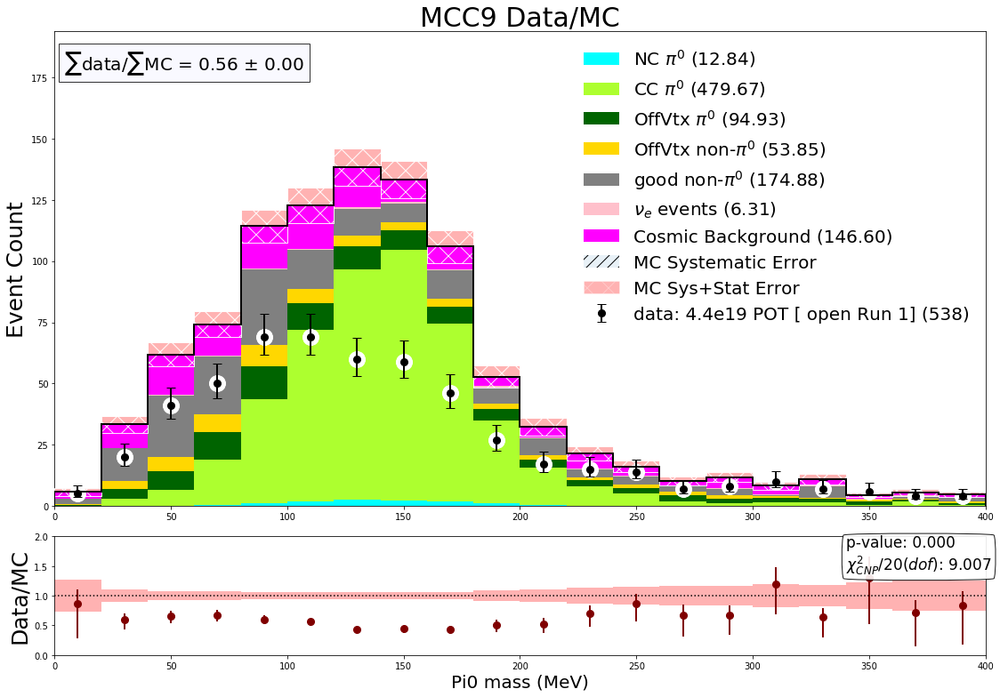

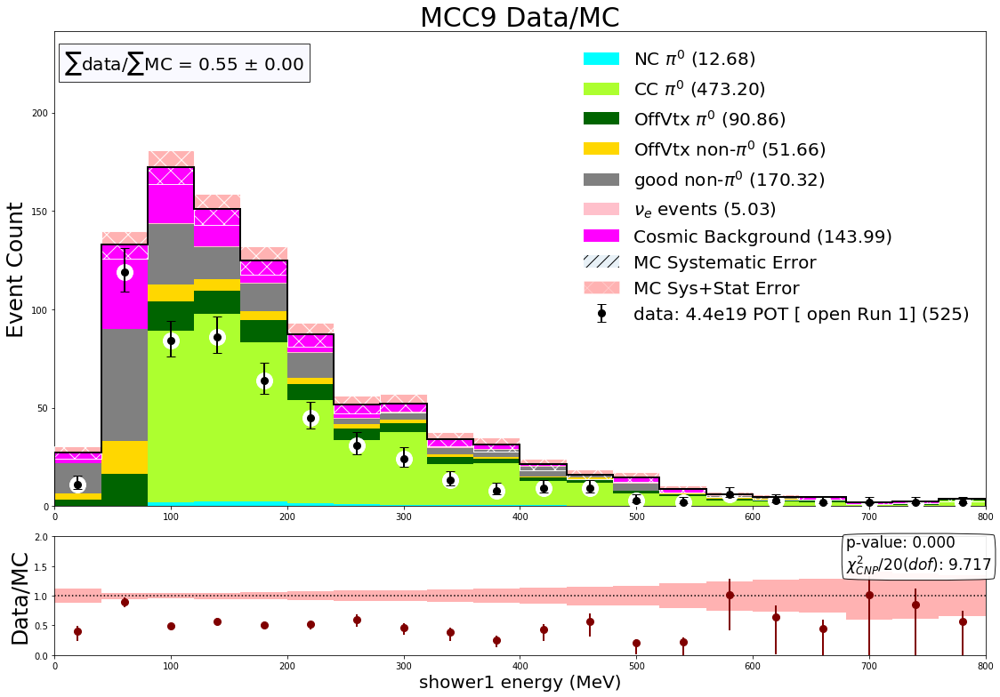

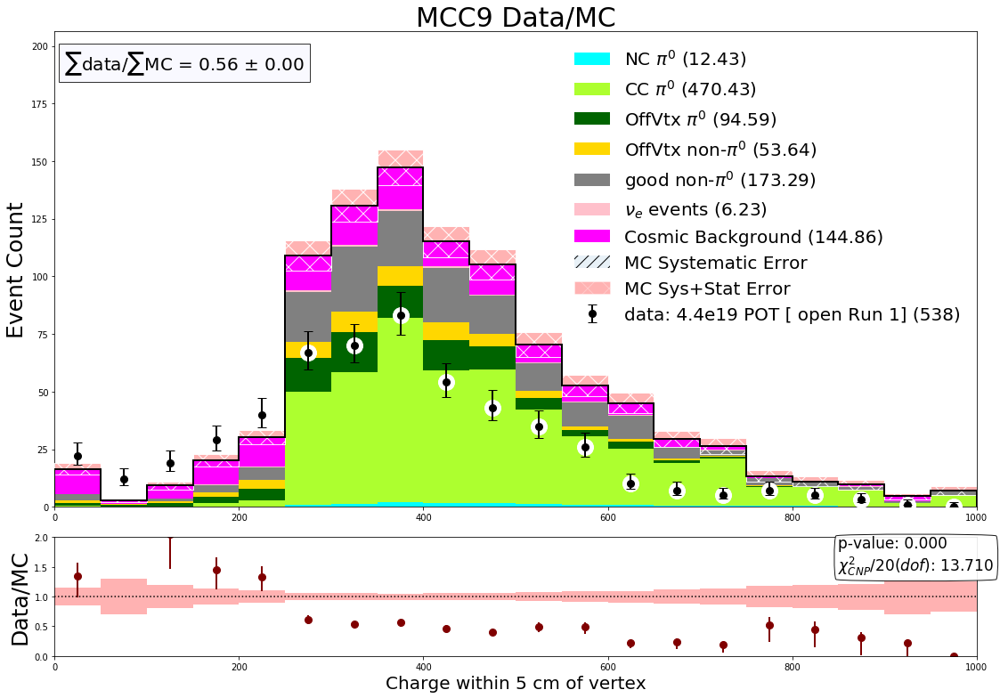

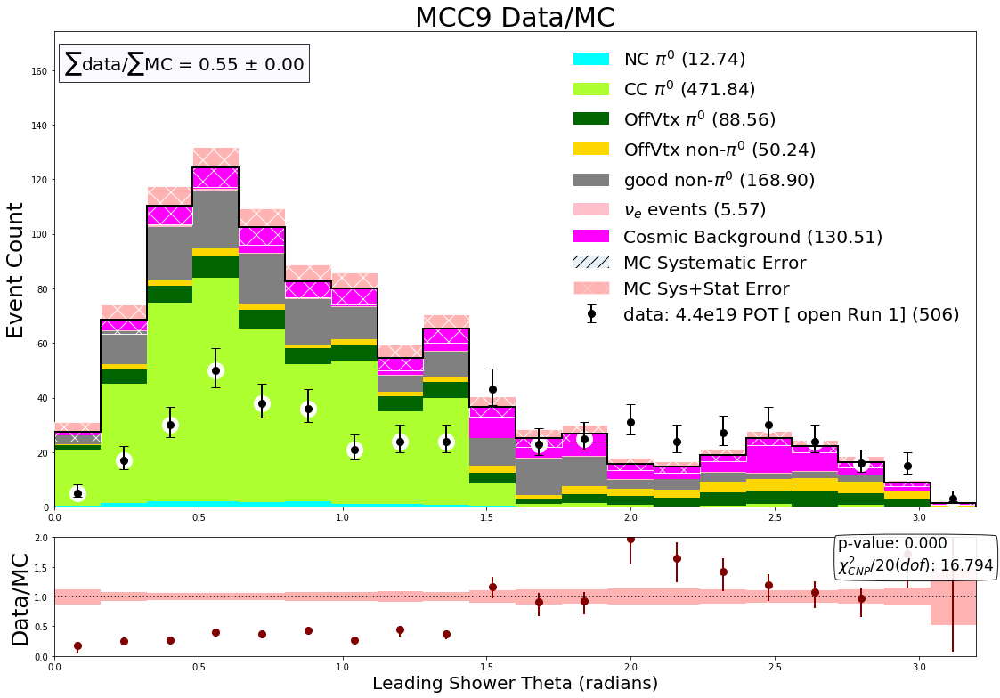

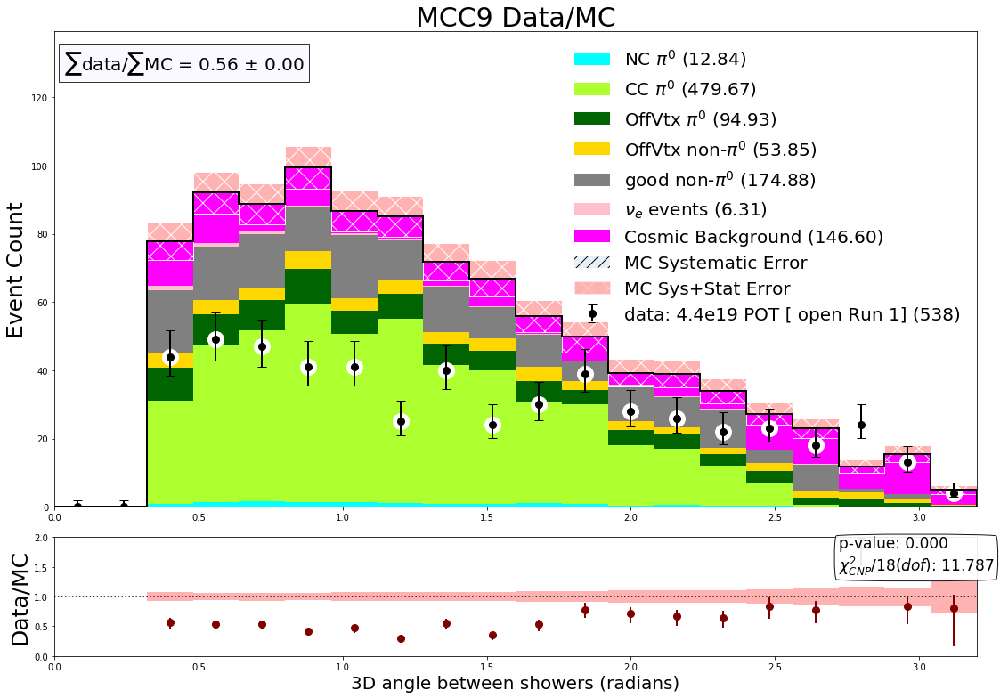

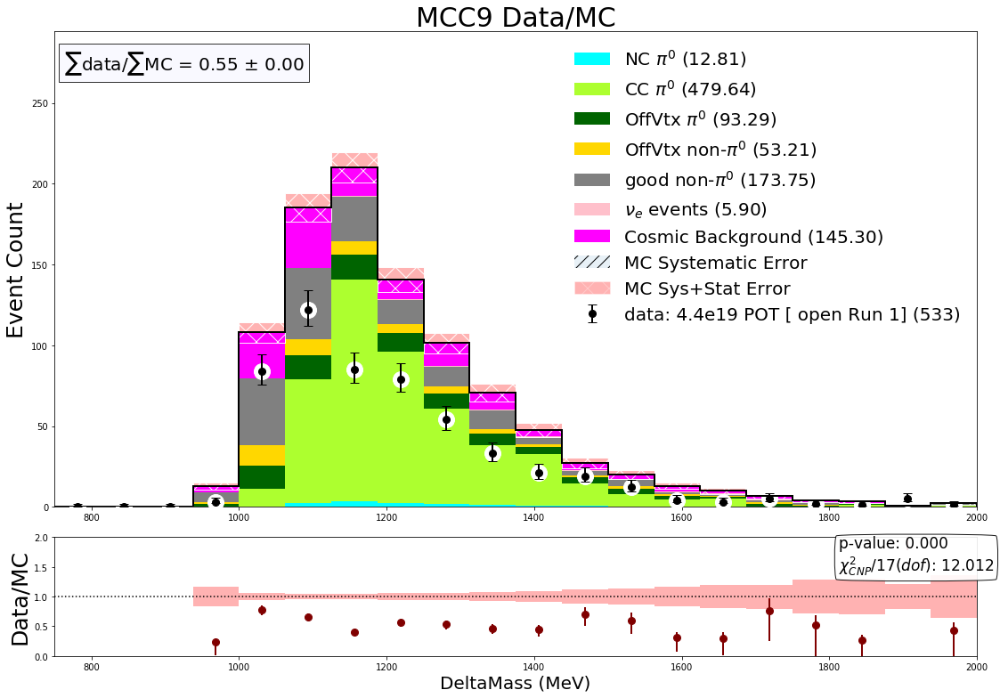

In [15]:
norm = 1.0
with PdfPages('output_preselection_210512.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        cov = np.zeros((nbins,nbins))
        
        run1_open_Hists = StackedHisto((df_bnb_ncpi0_pre,df_bnb_ccpi0_pre,df_bnb_ncpi0_offvtx_pre,df_bnb_ccpi0_offvtx_pre,df_bnb_other_offvtx_pre,df_bnb_other_good_pre,df_nue_pre),(NCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUE_R1_OPEN_SCALE*norm))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata(' MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_open_Hists.AddLayer(df_ext_pre,EXT_R1_OPEN_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_r1_open_pre,1.0,0,'','data: 4.4e19 POT [ open Run 1]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)

In [16]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass')
varname_list.append('Pi0 mass (MeV)')
myrange_list.append((0.0,400.0))
# detvar_list.append('../systematics/detvar_pi0mass_cov.txt')
sys_list.append('none')
detvar_list.append('none')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000.0,1400.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(10)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,800.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((80.0,450.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('shower2 energy (MeV)')
myrange_list.append((35.0,350.0))
detvar_list.append('none')
sys_list.append('none')
bins_list.append(20)


217
183
82
85
125
104
395
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [  0.          15.86625149  48.82768162  75.46224286 113.02412832
 111.59949819 156.73069151 125.51434824 111.47894217  84.52807076
  43.4698031   66.78491394  37.75844491  56.81473617  30.64221886
  35.60303727  26.68626546  35.42647437  21.65206497  39.92479023]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.0933326  0.65562974 0.89986391 1.09739834 1.2327698
 1.02659878 0.72528597 0.86318498 0.86377452 0.93759037 0.01559334
 0.02160959 0.48500019 0.03041209 0.01539029 0.00232034 0.00267345
 0.00209005 0.00283811]
yerr_data 15.353030792456751
ERROR HERE
[  0.          -0.98134056   0.26805432   0.41292662   0.07885737
   0.2123879    0.25041612   0.25697851   0.11767456   0.26790689
   0.12923256   6.63485221  -3.74485799  -0.33116147   4.08524106
  -5.65736429 -14.49166239 -10.9163657  -17.86103774  -9.686421

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



212
52
82
85
18
12
395
hstack gh_weights [1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
mcbins:  [  0.          20.90873589  85.94877804  69.94684635 128.48454568
 114.89321014 153.34246746 190.38831069 123.6496112  106.54950826
  96.89931936  39.84535586  63.7531495   52.84380881  62.96639213
  38.82308613  12.          30.07850125  18.28586083  14.12996239]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.38091594 0.70984367 0.79498953 1.62092465 2.1088887
 1.35074469 2.02879583 1.70048217 0.81381527 0.66021831 0.44647263
 0.38687363 0.31596212 0.35323472 0.35306531 0.22325894 1.25907926
 0.2233287  0.00836826]
yerr_data 28.12616695885563
ERROR HERE
[ 0.          0.31138437  0.1910727   0.15542095  0.03618508  0.21926246
  0.24146201  0.0521276   0.27458431  0.21024456 -0.05914889  0.22250487
 -0.16154053  0.86191515  0.32314617 -0.20099137 -0.51416403 -0.11821573
 -0.49371404  9.4304412 ]
[ 0.          2.411

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
mcbins:  [  0.          20.90873589  85.94877804  69.94684635 128.48454568
 114.89321014 153.34246746 190.38831069 123.6496112  106.54950826
  96.89931936  39.84535586  63.7531495   52.84380881  62.96639213
  38.82308613  12.          30.07850125  18.28586083  14.12996239]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.12090829 0.22531477 0.25234131 0.60070226 0.80021311
 0.42874613 0.71471973 0.62246784 0.25831687 0.20956295 0.14171695
 0.12279935 0.100291   0.11212187 0.1120681  0.07086566 0.50581406
 0.0708878  0.00265621]
yerr_data 15.855655556363928
ERROR HERE
[  0.          -0.57444147   0.28001137   0.22776478  -0.06412165
   0.07979832   0.24674109   0.20415821   0.09184653  -0.12514776
   0.31823189   0.70099122  -0.50892589  -0.73963501  -0.59613963
   1.08137057  -1.61984979  -0.30302416  -1.55542307 -17.3972656

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



217
183
82
85
125
104
395
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [  5.59201905  32.31825157  91.52083089 147.08754899 136.95474906
 169.78433547 161.53909753 141.1176086  144.31998277 218.56018049]
Normalization Uncertainty: 0.0
yerr_mc_total [0.09082701 0.75100707 0.87633161 1.50047491 1.1130574  0.85999759
 1.29844264 0.66467454 0.111408   0.67051989]
yerr_data 12.99174812245487
ERROR HERE
[-1.21499311  0.3998992   0.49821699  0.04815107  0.22874613  0.10431352
  0.06534844  0.60326883  0.63101628  0.38191961]
[13.06601725  1.65104682  1.21500508  0.37286523  0.72484095  0.80776773
  0.50603567  1.91161246  4.88637144  1.57681524]
chi2 in bins
0.2563527214663145
0.0722237660495018
1.2228609164287596
5.897241754411588
0.21419495070920594
1.3593356318515883
3.324360632680069
0.9619896487549139
0.481318691281722
0.04919086162438701
1.383906957525805 0.18045951244113434


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



212
52
82
85
18
12
395
hstack gh_weights [1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
mcbins:  [  9.44731558  51.10647842  89.72572249 130.1450768  164.92918644
 202.46796735 193.79988152 186.73405692 217.77402756 196.28811254]
Normalization Uncertainty: 0.0
yerr_mc_total [0.29301752 0.89720077 1.10480975 1.31946217 2.18706926 1.99343381
 1.00597932 1.02854705 1.52414988 2.29179064]
yerr_data 24.979165323512433
ERROR HERE
[0.53228392 0.12400464 0.24901098 0.15882787 0.11976187 0.13536249
 0.13620679 0.3010521  0.24438259 0.11872621]
[4.12182221 0.51197268 0.5035422  0.33722353 0.27014766 0.25407855
 0.43160625 0.58469816 0.55125546 0.37621454]
chi2 in bins
0.26496222755776844
2.3629340289657677
0.0033641280534224705
1.5692621364543697
3.691526188443149
2.5990107962344835
2.434097429963345
0.453489709136415
0.02800160651638781
2.1797107606008246
1.5586359011925932 0.11210147015960714


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
mcbins:  [  9.44731558  51.10647842  89.72572249 130.1450768  164.92918644
 202.46796735 193.79988152 186.73405692 217.77402756 196.28811254]
Normalization Uncertainty: 0.0
yerr_mc_total [0.09300805 0.28478466 0.35068278 0.4188166  0.82108444 0.70462324
 0.31931256 0.32647589 0.57461111 0.90419203]
yerr_data 13.374527391372125
ERROR HERE
[-0.98195668 -0.10641207  0.37014948  0.1799362   0.14432966  0.11741679
  0.13845898 -0.0779426   0.13686281  0.33089482]
[10.55994707  1.14435373  1.17291383  0.74289494  0.59588774  0.48477372
  1.07217839  0.83819354  1.05981817  1.04852535]
chi2 in bins
0.3222755417464344
2.96968550720937
0.09662948857246806
0.7963816806387427
1.5299016269955663
2.979373611659777
0.7893673979627336
4.068144709111194
0.7209795551784085
0.013391716793272756
1.4286130835867967 0.16033578903712042


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



217
183
82
85
125
104
395
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [  9.09177189  86.63886082 110.82497641 130.51036484 113.92724548
 102.57270637  93.90561343  97.27273474  81.93055208  66.49956694
  62.56156905  58.30507842  33.63751312  20.          25.18251043
  19.          18.7735288   10.13903418  22.26725849   6.        ]
Normalization Uncertainty: 0.0
yerr_mc_total [1.64177350e-01 7.64759321e-01 1.72728229e+00 8.50469769e-01
 1.18851704e+00 1.01213069e+00 1.43335791e-01 5.09552823e-01
 6.96912888e-01 4.99091846e-01 6.86369155e-02 2.64725859e-02
 4.40391339e-01 2.00873592e-03 4.35022323e-01 1.52810831e-02
 1.94617013e-03 1.43023085e-03 2.11953807e-03 1.10022997e-03]
yerr_data 14.667420024670513
ERROR HERE
[ -0.86993366   0.36683585   0.18788573   0.30200725   0.07602673
   0.28607815  -0.22408929   0.26099228  -0.12152143  -0.20798045
  -1.2856561   -2.46998465   0.53287752 -19.336

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



212
52
82
85
18
12
395
hstack gh_weights [1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
mcbins:  [ 19.76847777  84.63374069 133.49325367 113.97112484 136.63971153
 162.38476994 123.02832789 102.25138846  85.96805267  49.15757483
  63.8313312   65.91132006  41.4316301   34.3368175   31.34114682
  26.05704702  16.77464777  16.          14.43482059  10.47754887]
Normalization Uncertainty: 0.0
yerr_mc_total [0.51581259 1.18023217 1.89793662 1.20532026 1.23843926 1.24787517
 2.04018495 1.39965224 0.56923554 1.38987034 0.52736893 1.33743653
 0.15842309 1.3177789  0.23891117 0.33403009 0.22331193 0.00890482
 0.00845806 0.00720601]
yerr_data 30.23201775788127
ERROR HERE
[ 0.53886206  0.17844327  0.11093967  0.20885964  0.09300767  0.11545703
  0.1255783   0.23195734  0.52614424  0.31680895  0.62013224  0.22618145
  1.19712454 -0.07165985 -0.40823189  0.39317688 -0.49848055  8.32823622
 -5.40552096 -7.44713542]
[ 1.70752304  0.40

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
mcbins:  [ 19.76847777  84.63374069 133.49325367 113.97112484 136.63971153
 162.38476994 123.02832789 102.25138846  85.96805267  49.15757483
  63.8313312   65.91132006  41.4316301   34.3368175   31.34114682
  26.05704702  16.77464777  16.          14.43482059  10.47754887]
Normalization Uncertainty: 0.0
yerr_mc_total [0.16372646 0.37462296 0.67753446 0.38258629 0.39309875 0.39609384
 0.78206199 0.54175966 0.18068369 0.53921639 0.16739462 0.52568666
 0.05028581 0.52066082 0.0758339  0.10602604 0.07088247 0.00282652
 0.00268471 0.00228729]
yerr_data 15.984211265431217
ERROR HERE
[ -0.32075683   0.32577487   0.25069014   0.10017572   0.09454556
  -0.0542479    0.09394482   0.46722909  -0.24721075   0.23288478
   0.49758915  -0.17339467  -2.20845379  -0.19823634  -1.28611554
  -0.72533219  -1.57043973 -15.36391932 -17.02984166 -23.4618528

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



217
183
82
85
125
104
395
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [101.88494095 109.39959263 132.65943872 111.50231299  90.76354243
 110.16121837 107.67609035  71.41000811  52.41187309  42.2854461
  54.8102647   27.96545487  19.38053205  16.00028807  23.00131991
  20.41849653  12.          12.40629268  10.           6.20769012]
Normalization Uncertainty: 0.0
yerr_mc_total [1.41739107e+00 1.04578456e+00 1.28177958e+00 7.15895171e-01
 9.67845595e-01 8.67687923e-01 5.05605388e-01 1.67942945e-01
 6.92866871e-01 7.34572674e-02 4.40656875e-01 2.15638244e-02
 6.51379911e-02 4.35284099e-01 2.15419110e-03 2.02964334e-03
 1.55596015e-03 1.58208152e-03 1.42039079e-03 1.11911022e-03]
yerr_data 13.961909329280045
ERROR HERE
[  0.12028191   0.33022672   0.06374966   0.46049135   0.10207881
   0.43010847  -0.16107602  -0.2576721   -0.13893065  -1.02095097
   0.5106576   -4.13718639  -2.01305083  -0.3805

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



212
52
82
85
18
12
395
hstack gh_weights [1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
mcbins:  [ 99.67145578 156.85561256 146.97666908 158.94009534  98.31301903
 110.1086016  110.53525687  67.91951749  55.91264494  53.25599215
  43.65567296  36.39009574  36.47040953  21.          32.60073678
  22.60388661   5.22280674  12.28586083  14.43482059   8.19168804]
Normalization Uncertainty: 0.0
yerr_mc_total [1.24562788 1.81780861 1.84592014 1.40754574 0.88280847 1.54336184
 1.40853115 0.47367656 1.34674819 1.39874987 1.32799825 0.31583305
 0.35570736 0.15810319 0.28631684 0.29439166 0.15785571 0.00780311
 0.00845806 0.00637165]
yerr_data 27.608856392371298
ERROR HERE
[ 0.11746788  0.14197331  0.13523958  0.02330268  0.22899369  0.23951462
  0.15413239  0.75082127  0.3112507   0.30330047  0.24401601  0.90680774
 -0.19948229  1.46626713 -0.29750504 -0.29380219 -1.03896985 10.84594571
  9.23127368 -9.52523154]
[  0.31847972   0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
mcbins:  [ 99.67145578 156.85561256 146.97666908 158.94009534  98.31301903
 110.1086016  110.53525687  67.91951749  55.91264494  53.25599215
  43.65567296  36.39009574  36.47040953  21.          32.60073678
  22.60388661   5.22280674  12.28586083  14.43482059   8.19168804]
Normalization Uncertainty: 0.0
yerr_mc_total [0.39538052 0.65502329 0.66289687 0.44677562 0.28021633 0.57975472
 0.54407319 0.15035187 0.5280764  0.5415248  0.52327033 0.10025003
 0.11290672 0.05018426 0.09088116 0.09344422 0.05010571 0.00247682
 0.00268471 0.00202245]
yerr_data 14.124312974367596
ERROR HERE
[  0.29211672   0.07285436   0.06948538   0.073414    -0.1075935
  -0.07862303   0.44905778   1.86712689  -0.16632002  -0.13102331
  -0.18550708  -0.77815867  -0.62845964  -2.70496769  -0.93727576
  -0.92561009  -3.27322604 -20.00858651 -17.02984166 -30.00879769

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



217
183
82
85
125
104
395
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [ 79.14838304  82.13944105  92.82116833 107.90066901  75.90781621
  78.5594154   55.2538255   70.10717242  46.42400386  60.09523954
  46.5234967   53.0612809   41.73301106  28.          29.55684973
  16.05793374  39.90419055  17.95317065  20.86437883  22.40992152]
Normalization Uncertainty: 0.0
yerr_mc_total [0.91617162 1.14873835 1.29821567 0.99747372 0.96713186 0.50174336
 0.69655881 0.50491603 0.50354478 0.50423124 0.04297455 0.10048158
 0.48594326 0.09456797 0.02636281 0.65185555 0.09335858 0.01527417
 0.00205168 0.06335527]
yerr_data 16.32525091812546
ERROR HERE
[  0.34713436   0.15763504   0.20739669   0.09947856   0.22686016
  -0.14422433   0.18098677   0.90364732   0.32297392  -0.17930714
  -1.25330687  -0.61599694   0.5144642   -0.88098878  -3.02550067
  -0.17903722  -0.92492272  -7.62649504 -18.53533972  -2.381557

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



212
52
82
85
18
12
395
hstack gh_weights [1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
mcbins:  [ 79.66541893  83.39523407 109.23503694  93.49992857  72.25185993
  71.93300918  94.48558538 131.25198023  74.22843099  63.01265352
  52.51871054  55.94551521  37.96407496  38.62107181  30.69170481
  13.          36.28044031  30.21692454  16.1600352   27.013672  ]
Normalization Uncertainty: 0.0
yerr_mc_total [1.20058305 1.16877128 1.11331658 1.10218666 1.49331831 0.90981094
 0.80128887 2.09871052 0.7232643  0.57187164 1.38180753 1.30762055
 0.35305928 0.46669468 0.36732308 0.27338993 1.32648374 0.41760932
 0.23205356 0.31575947]
yerr_data 32.042557502959056
ERROR HERE
[ 0.21219254  0.10543309  0.11512584  0.29121508  0.05305698  0.21848696
  0.21786318  0.05901174  0.26787479  0.29225185  0.1799373   0.27669506
  0.73953642  0.2051599   1.27910223  0.59852199 -0.06753339  0.25656692
  0.79743973 -0.25455447]
[0.4290891  0.334

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
mcbins:  [ 79.66541893  83.39523407 109.23503694  93.49992857  72.25185993
  71.93300918  94.48558538 131.25198023  74.22843099  63.01265352
  52.51871054  55.94551521  37.96407496  38.62107181  30.69170481
  13.          36.28044031  30.21692454  16.1600352   27.013672  ]
Normalization Uncertainty: 0.0
yerr_mc_total [0.38108263 0.37098511 0.35338298 0.34985018 0.56639618 0.28878731
 0.25434081 0.79751254 0.22957467 0.18152043 0.53712453 0.51807399
 0.11206618 0.14813572 0.11659372 0.08677796 0.52288315 0.13255531
 0.0736572  0.10022668]
yerr_data 17.556265877591144
ERROR HERE
[ 0.31541965  0.33216203 -0.06852848  0.25767565  0.33894144 -0.10265688
  0.22146557 -0.04767038 -0.15945207  0.42828641 -0.14101777  0.3538198
  1.08376865 -0.37847872 -0.60099074 -1.10415259 -0.18814195 -0.47331431
 -1.47111578 -0.80196197]
[ 0.99948831  1.05

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


217
183
82
85
125
104
395
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.01516179 0.01516179 0.01516179 ... 0.43501672 0.43501672 0.43501672]
mcbins:  [211.20918396 207.62501542 145.67272544 113.09771984 113.93344003
  82.74434439  87.50593467  58.41402782  42.8646683   32.
  28.38348558  20.23627256   9.          15.45254692  19.09329132
   8.           3.           0.           8.           0.        ]
Normalization Uncertainty: 0.0
yerr_mc_total [8.83512051e-01 1.46752849e+00 1.03289811e+00 1.08959115e+00
 8.69995668e-01 5.20805163e-01 8.51552386e-01 8.20557385e-01
 9.93217654e-02 4.91219554e-01 7.18574086e-02 3.03775512e-02
 6.33339196e-02 2.63087868e-02 1.52816989e-02 1.27043614e-03
 1.51750942e-02 0.00000000e+00 1.27043614e-03 0.00000000e+00]
yerr_data 14.062021772434845
ERROR HERE
[ 2.82567697e-01  2.20114469e-01  4.04656886e-01  8.92047630e-02
 -7.88822151e-02  2.63566951e-01 -8.64840484e-02  1.69469168e-01
 -6.61235843e-01 -2.45113507e-01 -1.16437109e+00 -2.55675

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



212
52
82
85
18
12
395
hstack gh_weights [1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+00 1.00000000e+00
 1.00000000e+00 1.00000000e+00 1.00000000e+0

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: divide by zero encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/l

124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.15778941 0.15778941 0.15778941 ... 1.24909725 1.24909725 1.24909725]
mcbins:  [226.16967472 264.02153846 150.73455216 166.30212749 133.5095324
  93.50617353  62.94692031  73.33477945  48.96900871  41.50442514
  18.          23.51091939  18.           8.27280651  12.
   4.           0.           1.          10.           6.37110921]
Normalization Uncertainty: 0.0
yerr_mc_total [1.42967876 2.10552032 1.26533093 2.0925164  1.56633443 0.86233115
 1.43450863 0.56918054 1.31709129 0.31587948 0.31568873 0.27690868
 0.22332553 0.00640312 0.31564163 0.00445241 0.         0.15778941
 0.00703987 0.00561917]
yerr_data 25.169506439947625
ERROR HERE
[  0.17110877   0.03223961   0.2480252    0.1479756    0.19447246
   0.1314246   -0.03864762   0.63368649   0.37604534   0.89232974
   0.44788562  -0.32724922   0.84466753  -9.4318325   -0.26766468
 -19.50693132   0.          -1.10086993  -7.80277253 -12.24711784]
[3.211

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [1. 1. 1. ... 1. 1. 1.]
hstack gh_scale [0.05008467 0.05008467 0.05008467 ... 0.50331439 0.50331439 0.50331439]
mcbins:  [226.16967472 264.02153846 150.73455216 166.30212749 133.5095324
  93.50617353  62.94692031  73.33477945  48.96900871  41.50442514
  18.          23.51091939  18.           8.27280651  12.
   4.           0.           1.          10.           6.37110921]
Normalization Uncertainty: 0.0
yerr_mc_total [0.45380096 0.7367382  0.40163455 0.79587099 0.58592921 0.27371653
 0.55086902 0.18066623 0.52048549 0.10026477 0.10020422 0.08789487
 0.07088679 0.00203244 0.10018927 0.00141326 0.         0.05008467
 0.00223456 0.00178361]
yerr_data 14.065758258016029
ERROR HERE
[  0.07042644   0.18240046   0.19437077   0.17632247   0.12530645
  -0.11277935   0.19344543  -0.25039188   0.72234324  -0.76573467
   1.41104274  -1.03098342  -1.55824155 -29.71454837  -0.84326509
 -61.45567729   0.          -3.46823936 -24.58227092 -38.58397351]
[5.453

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


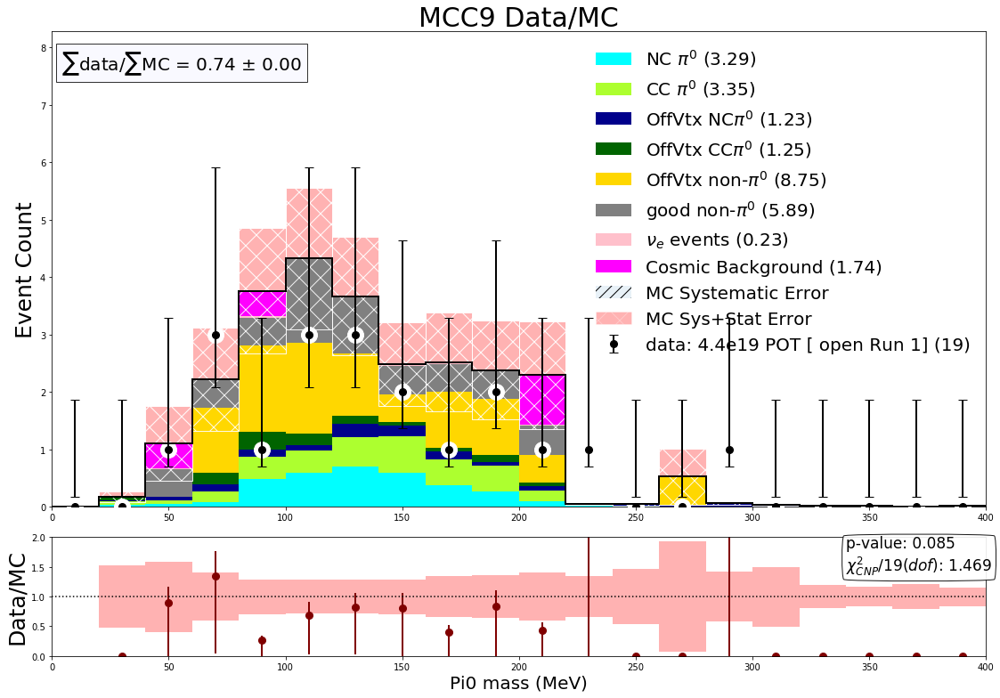

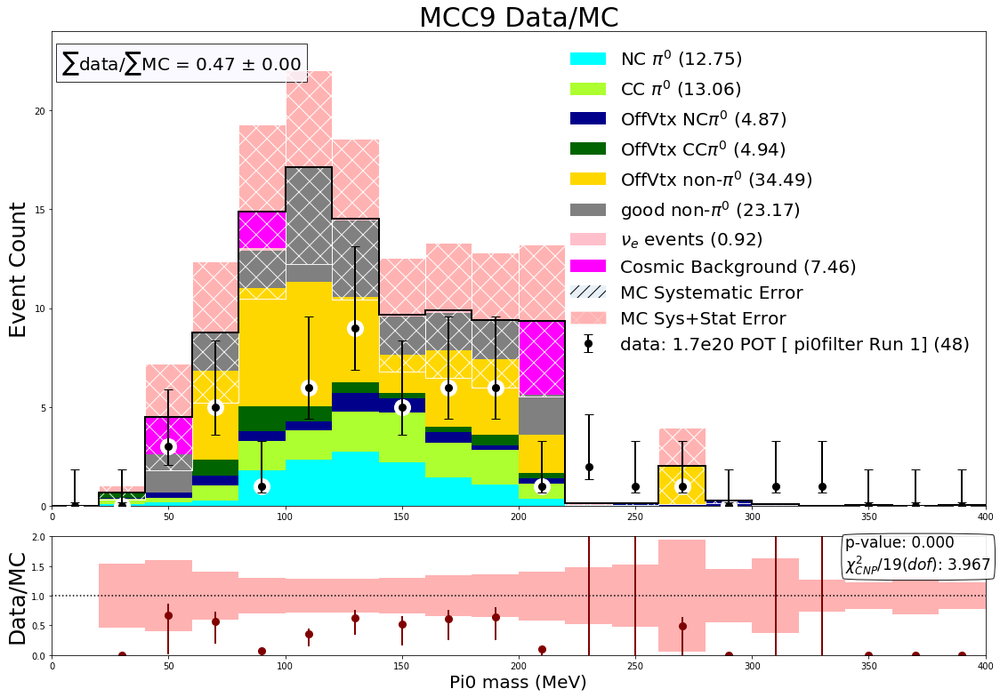

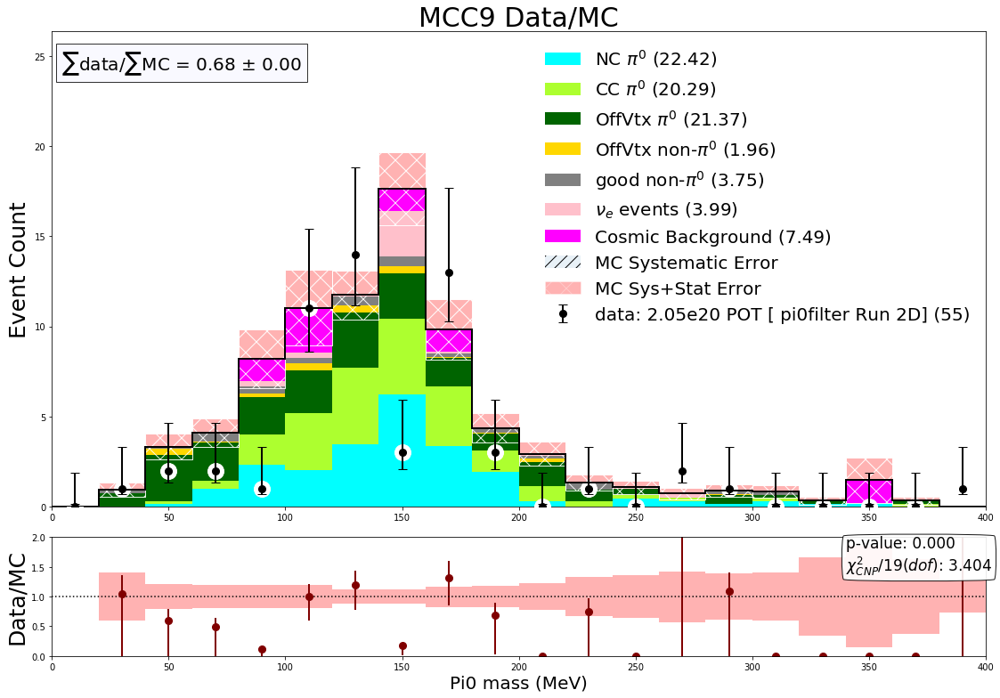

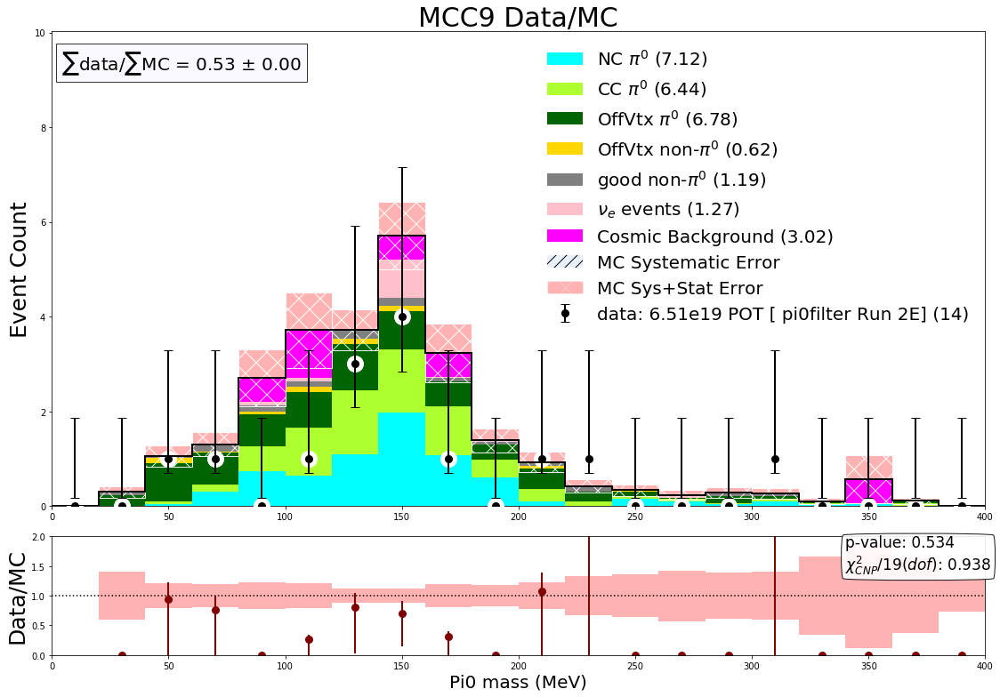

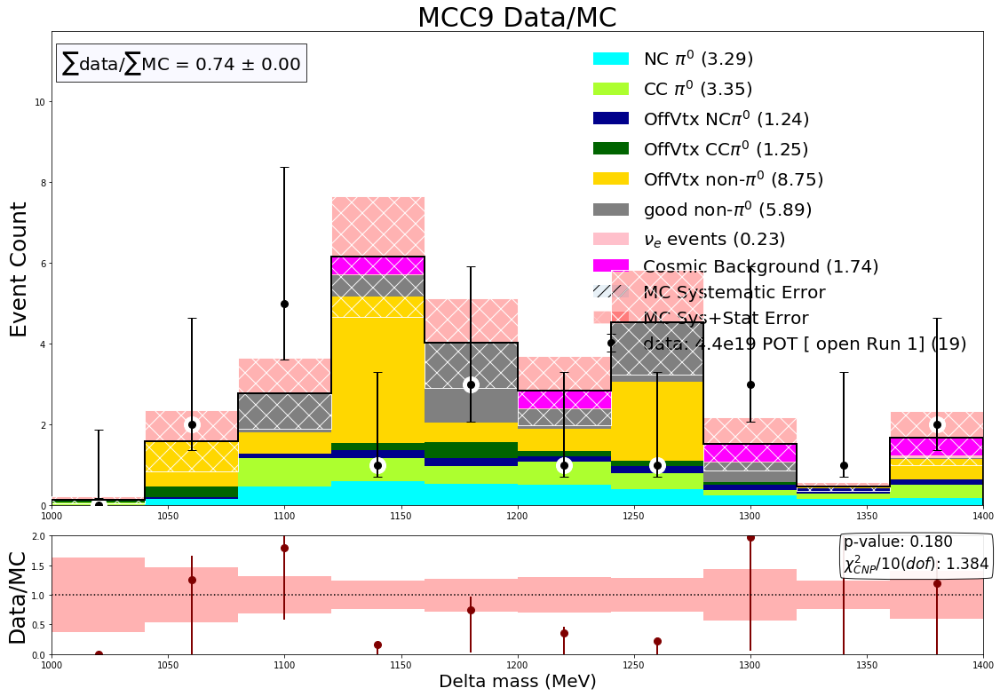

...

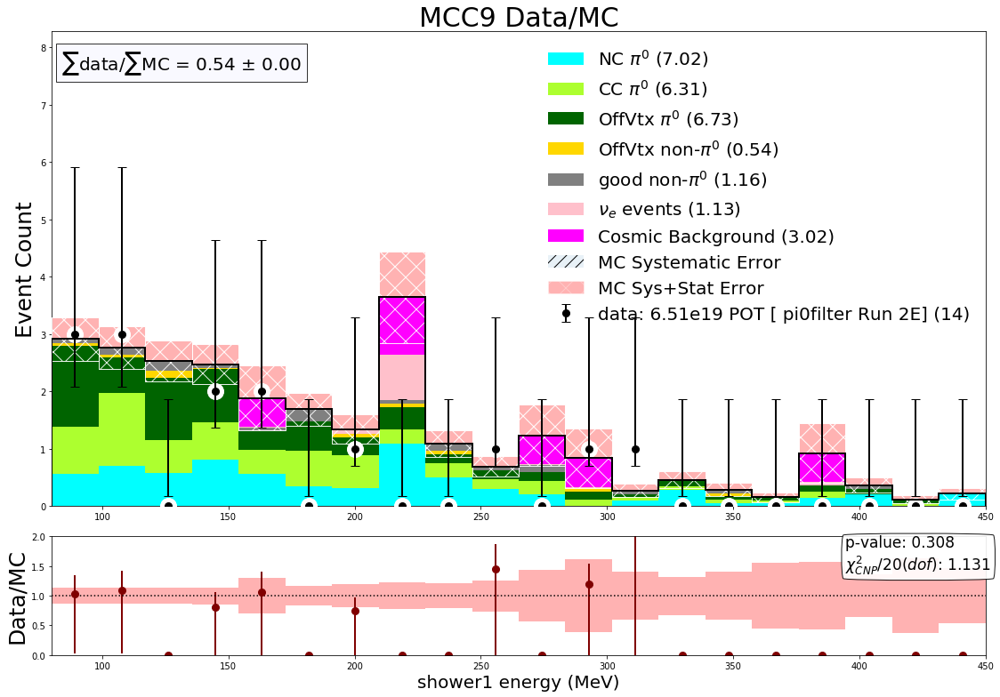

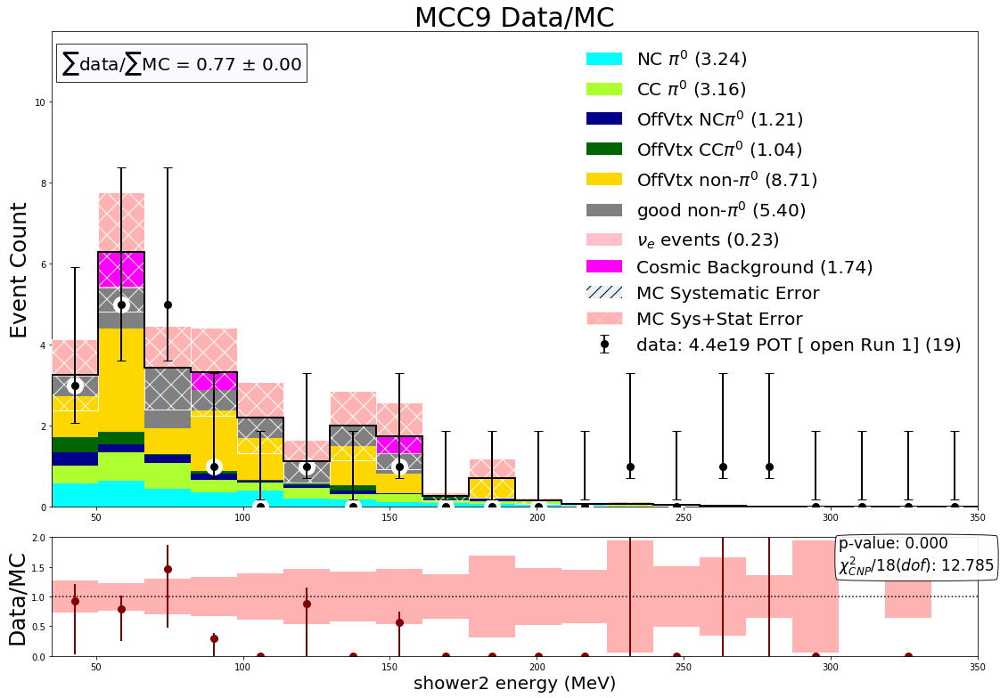

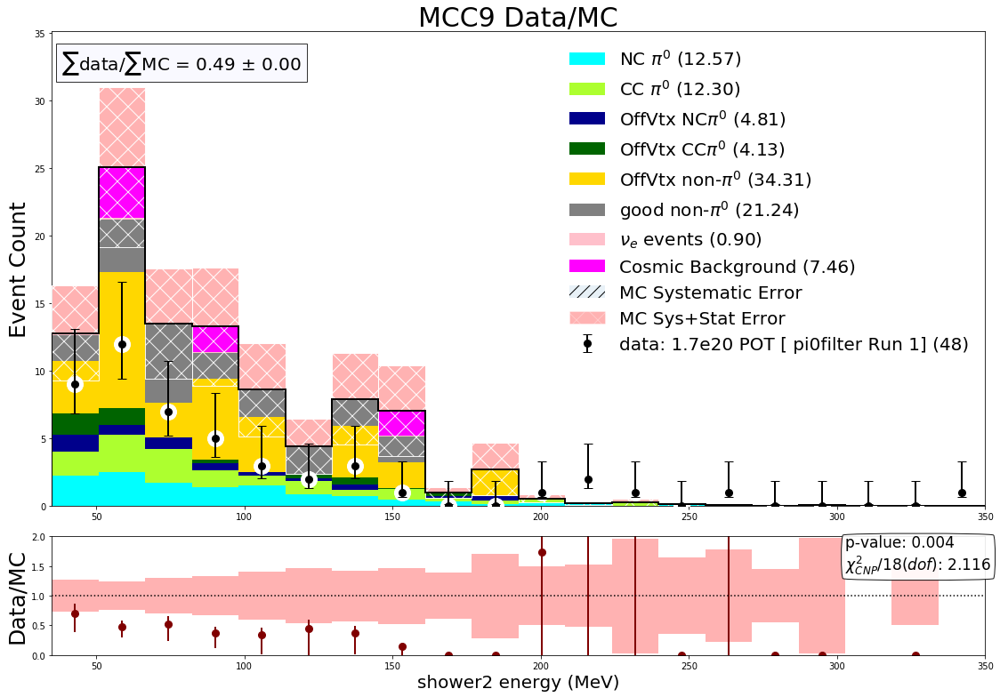

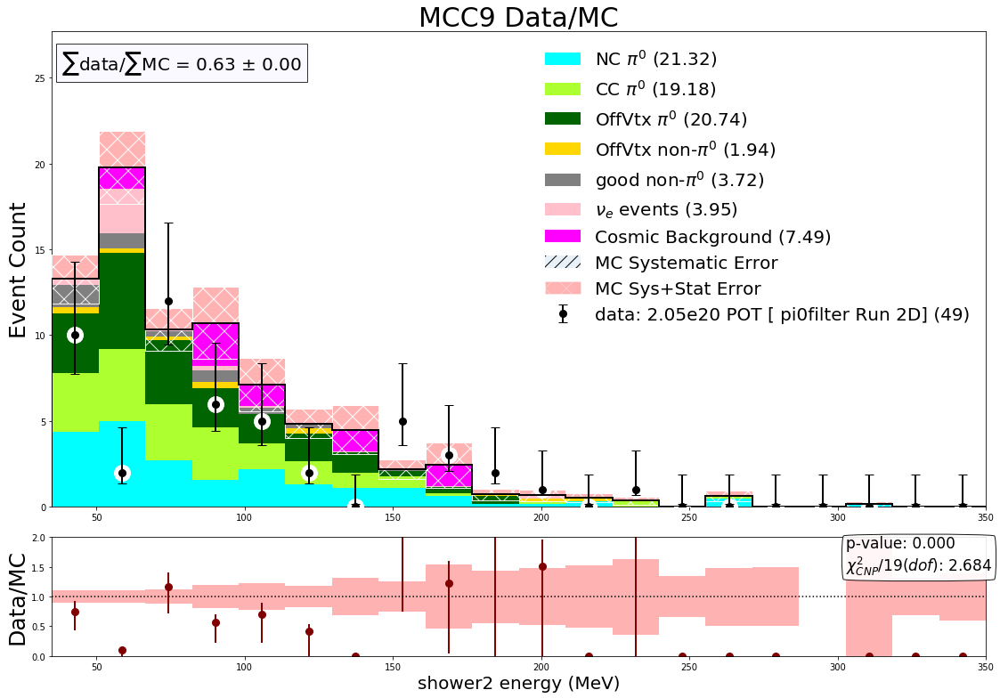

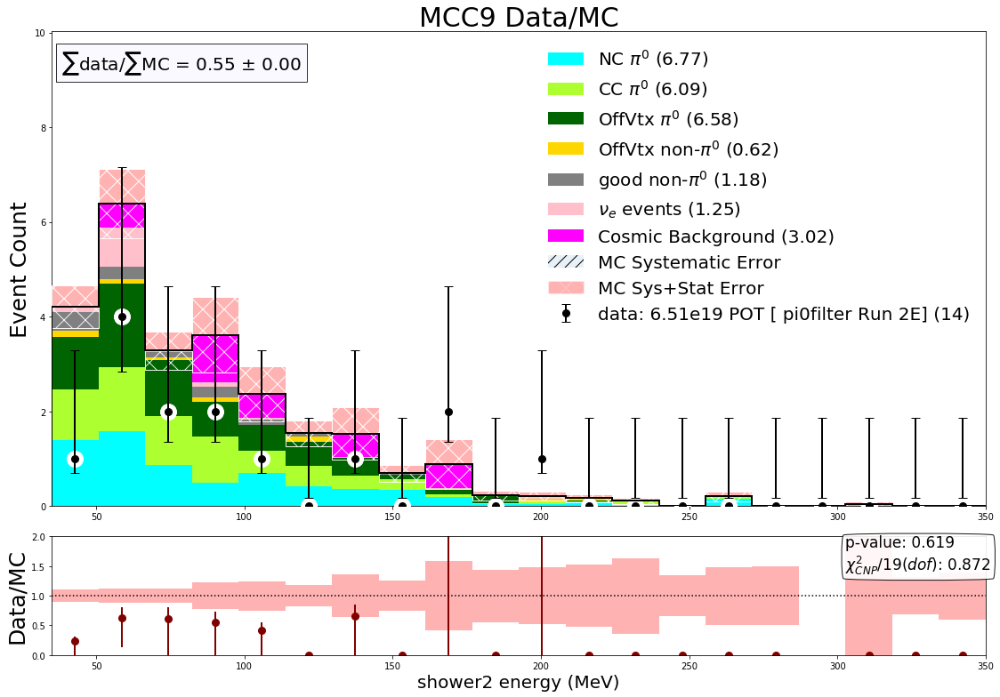

In [17]:
norm = 1.0
with PdfPages('output_201109.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        s_cov = np.zeros((nbins,nbins))
        if detvar_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov = np.genfromtxt(detvar_list[i],delimiter=',')
        
        cov = s_cov +d_cov
        run1_open_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_ncpi0_offvtx,df_bnb_ccpi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NCPI0_R1_OPEN_SCALE*norm,CCPI0_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUMU_R1_OPEN_SCALE*norm,NUE_R1_OPEN_SCALE*norm))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkblue')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==0 and MC_scedr>=5',r"OffVtx CC$\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_open_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_open_Hists.AddLayer(df_ext_pi0,EXT_R1_OPEN_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_r1_open_pi0,1.0,0,'','data: 4.4e19 POT [ open Run 1]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        run1_pi0filter_Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_ncpi0_offvtx,df_bnb_ccpi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NCPI0_R1_PI0FILTER_SCALE*norm,CCPI0_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr>=5 ',r"OffVtx NC$\pi^0$",'darkblue')
        run1_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==0 and MC_scedr>=5 ',r"OffVtx CC$\pi^0$",'darkgreen')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
        fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        run2D_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUMU_R2D_1MIL_PI0FILTER_SCALE*norm,NUE_R2D_PI0FILTER_SCALE*norm))
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2D_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2D_pi0filter_DataHist = SimpleHisto(df_data_r2D_pi0filter_pi0,1.0,0,'','data: 2.05e20 POT [ pi0filter Run 2D]')
        fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)
        
        cov = np.zeros((nbins,nbins))
        run2E_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r2,df_bnb_ccpi0_r2,df_bnb_pi0_offvtx_r2,df_bnb_other_offvtx_r2,df_bnb_other_good_r2,df_nue_r2_pi0),(NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUMU_R2E_1MIL_PI0FILTER_SCALE*norm,NUE_R2E_PI0FILTER_SCALE*norm))
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2E_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2E_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2E_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2E_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2E_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2E_pi0filter_DataHist = SimpleHisto(df_data_r2E_pi0filter_pi0,1.0,0,'','data: 6.51e19 POT [ pi0filter Run 2E]')
        fig5,ax5,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2E_pi0filter_Hists,run2E_pi0filter_DataHist,varname,m_cov=cov)

#         cov = np.zeros((nbins,nbins))
#         run3F_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_pi0_offvtx_r3,df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUMU_R3F_PI0FILTER_SCALE*norm,NUE_R3F_PI0FILTER_SCALE*norm))
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3F_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run3F_pi0filter_DataHist = SimpleHisto(df_data_r3F_pi0filter_pi0,1.0,0,'','data: 4.3e19 POT [ pi0filter Run 3F]')
#         fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

#         cov = np.zeros((nbins,nbins))
#         run3G_pi0filter_Hists = StackedHisto((df_bnb_ncpi0_r3,df_bnb_ccpi0_r3,df_bnb_pi0_offvtx_r3,df_bnb_other_offvtx_r3,df_bnb_other_good_r3,df_nue_r3_pi0),(NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUMU_R3G_PI0FILTER_SCALE*norm,NUE_R3G_PI0FILTER_SCALE*norm))
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#         run3G_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#         run3G_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#         run3G_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#         run3G_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3G_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#         run3G_pi0filter_DataHist = SimpleHisto(df_data_r3G_pi0filter_pi0,1.0,0,'','data: 2e20 [ pi0filter Run 3G]')
#         fig7,ax7,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3G_pi0filter_Hists,run3G_pi0filter_DataHist,varname,m_cov=cov)
        
        #save to pdf file of plots
        pdf.savefig(fig1)
        pdf.savefig(fig3)
        pdf.savefig(fig4)
        pdf.savefig(fig5)
#         pdf.savefig(fig6)
#         pdf.savefig(fig7)

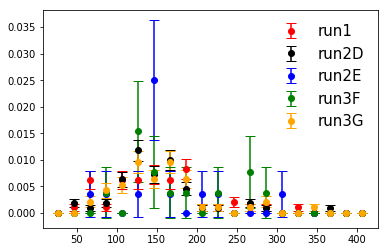

In [18]:
# Make data plots, normalized
# checking to see if any bins look realyl off
var_r1 = df_data_r1_pi0filter_pi0["_pi0mass_new"].values
var_r2D = df_data_r2D_pi0filter_pi0["_pi0mass_new"].values
var_r2E = df_data_r2E_pi0filter_pi0["_pi0mass_new"].values
var_r3F = df_data_r3F_pi0filter_pi0["_pi0mass_new"].values
var_r3G = df_data_r3G_pi0filter_pi0["_pi0mass_new"].values

# turn into histograms
r1_Hist,binedges = np.histogram( var_r1, bins = 20, range = [0,400],density = True)
bincenters = np.ones(len(binedges)-1)
for i in range(len(binedges)-1):
    bincenters[i] = binedges[i]+(400.0/15.0)
    
r2D_Hist,_ = np.histogram( var_r2D, bins = 20, range = [0,400],density = True)
r2E_Hist,_ = np.histogram( var_r2E, bins = 20, range = [0,400],density = True)
r3F_Hist,_ = np.histogram( var_r3F, bins = 20, range = [0,400],density = True)
r3G_Hist,_ = np.histogram( var_r3G, bins = 20, range = [0,400],density = True)

err_1 = [sqrt(float(i))/float(len(var_r1)) for i in r1_Hist]
err_2d = [sqrt(float(i))/float(len(var_r2D)) for i in r2D_Hist]
err_2e = [sqrt(float(i))/float(len(var_r2E)) for i in r2E_Hist]
err_3f = [sqrt(float(i))/float(len(var_r3F)) for i in r3F_Hist]
err_3g = [sqrt(float(i))/float(len(var_r3G)) for i in r3G_Hist]


plt.errorbar(bincenters,r1_Hist, yerr=err_1,  fmt='o', color = 'red', ecolor='red', capsize=5,label = 'run1')
plt.errorbar(bincenters,r2D_Hist, yerr=err_2d,  fmt='o', color = 'black', ecolor='black', capsize=5,label = 'run2D')
plt.errorbar(bincenters,r2E_Hist, yerr=err_2e,  fmt='o', color = 'blue', ecolor='blue', capsize=5,label = 'run2E')
plt.errorbar(bincenters,r3F_Hist, yerr=err_3f,  fmt='o', color = 'green', ecolor='green', capsize=5,label = 'run3F')
plt.errorbar(bincenters,r3G_Hist, yerr=err_3g,  fmt='o', color = 'orange', ecolor='orange', capsize=5,label = 'run3G')

plt.legend(loc='upper right',fontsize=15,frameon=False,ncol=1)
plt.show()
plt.close()

# Make "DPF plots"

In [19]:
# # list of variables to plot:
# vars = ['Xreco','Yreco','Zreco','OpenAng','Thetas','Phis','ChargeNearTrunk','Enu_1e1p','PhiT_1e1p','AlphaT_1e1p','PT_1e1p','PTRat_1e1p','BjXB_1e1p','BjYB_1e1p','Q2_1e1p','SphB_1e1p','Q0_1e1p','Q3_1e1p','Lepton_PhiReco','Lepton_ThetaReco','Lepton_TrackLength','Muon_Edep','Proton_PhiReco','Proton_ThetaReco','Proton_TrackLength','Proton_Edep','Proton_CosTheta','Lepton_CosTheta']
# # list of ranges
# ranges = [(15,241.25),(-101.5,101.),(15,1021.8),(.6,2.8),(0,6.3),(1.5,4),(0,600),(200,1200),(0,1),(0,np.pi),(0,320),(0,1),(0,1.8),(0.05,.75),(0,6e5),(0,1200),(70,600),(200,1000),(-np.pi,np.pi),(.2,2.8),(20,200),(50,600),(-np.pi,np.pi),(0,2),(5,100),(50,500),(-1,1),(-1,1),]
# print(vars)
# print(ranges)
# nbins =20

# for i in range(len(vars)):
#     vartest = vars[i]
#     varname = vars[i]
#     myrange = ranges[i]
#     norm = len(df_data_r1_pi0filter_pi0)/(len(df_numu_pi0)*NUMU_R1_PI0FILTER_SCALE+ len(df_nue_pi0)*NUE_R1_PI0FILTER_SCALE +len(df_ext_pi0)*EXT_R1_PI0FILTER_SCALE)
#     print("Norm", norm)
#     run1Hists = StackedHisto((df_bnb_ncpi0,df_bnb_ccpi0,df_bnb_pi0_offvtx,df_bnb_other_offvtx,df_bnb_other_good,df_nue_pi0),(NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUMU_R1_PI0FILTER_SCALE*norm,NUE_R1_PI0FILTER_SCALE*norm))
#     run1Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#     run1Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#     run1Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
#     run1Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
#     run1Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
#     run1Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
#     run1DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [Run 1]')
#     cov = np.zeros((nbins,nbins))
#     fig,ax0,_ ,a= distplot_wratio_davio(vartest,nbins,myrange,run1Hists,run1DataHist,varname,m_cov=cov)

# Start of combined plots...

In [20]:
# add all of the data frames
# df_data_total = df_fakedata1_run1_pi0.append(df_fakedata1_run3_pi0)
df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r2D_pi0filter_pi0)
df_data_total_2 = df_data_total_1.append(df_data_r2E_pi0filter_pi0)
df_data_total_3 = df_data_total_2.append(df_data_r3F_pi0filter_pi0)
df_data_total = df_data_total_3.append(df_data_r3G_pi0filter_pi0)

print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))
# scale CV weights:
def potscale(df,scalefactor=1.0,ext=False):
    pot_weight = []
    for i in range(len(df)):
        if ext==False:
            pot_weight.append(scalefactor)
        else:
            pot_weight.append(scalefactor)
    return pot_weight

# general mc
w_mu_1 =potscale(df_numu_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_POT)
w_mu_1_1mil =potscale(df_numu_1mil_pi0,DATA_R1_PI0FILTER_POT/NUMU_R1_1MIL_POT)
w_mu_2 =potscale(df_numu_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
w_mu_2_1mil =potscale(df_numu_r2_1mil_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_1MIL_POT)
w_mu_3 =potscale(df_numu_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUMU_R3_POT)
df_numu_pi0['pot_weight'] = w_mu_1
df_numu_1mil_pi0['pot_weight'] = w_mu_1_1mil
df_numu_r2_pi0['pot_weight'] = w_mu_2
df_numu_r2_1mil_pi0['pot_weight'] = w_mu_2_1mil
df_numu_r3_pi0['pot_weight'] = w_mu_3

# df_numu_total_1 = df_numu_pi0.append(df_numu_r2_pi0)
df_numu_total_1 = df_numu_1mil_pi0.append(df_numu_r2_1mil_pi0)
df_numu_total = df_numu_total_1.append(df_numu_r3_pi0)

w_e_1 =potscale(df_nue_pi0,DATA_R1_PI0FILTER_POT/NUE_R1_POT)
w_e_2 =potscale(df_nue_r2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUE_R2_POT)
w_e_3 =potscale(df_nue_r3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/NUE_R3_POT)
df_nue_pi0['pot_weight'] = w_e_1
df_nue_r2_pi0['pot_weight'] = w_e_2
df_nue_r3_pi0['pot_weight'] = w_e_3
df_nue_total_1 = df_nue_pi0.append(df_nue_r2_pi0)
df_nue_total = df_nue_total_1.append(df_nue_r3_pi0)
print('xsec_corr_weight' in df_nue_total.keys())


df_ext_r3_2_pi0 = df_ext_r3_pi0
df_ext_r3_3_pi0 = df_ext_r3_pi0
w_ext_1 =potscale(df_ext_pi0,DATA_R1_PI0FILTER_POT/EXT_R1_PI0FILTER_POT,True)
w_ext_2 =potscale(df_ext_r3_2_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT),True)
w_ext_3 =potscale(df_ext_r3_3_pi0,(DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/(EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT),True)
df_ext_pi0['pot_weight'] = w_ext_1
df_ext_r3_2_pi0['pot_weight'] = w_ext_2
df_ext_r3_2_pi0['pot_weight'] = w_ext_3
df_ext_total_1 = df_ext_pi0.append(df_ext_r3_2_pi0)
df_ext_total = df_ext_total_1.append(df_ext_r3_3_pi0)

# df_bnb_ncpi0_r2 = df_numu_r2_pi0.query('haspi0==1 and ccnc==1 and MC_scedr<5 and MC_parentPDG ==14')
# df_bnb_ccpi0_r2 = df_numu_r2_pi0.query("haspi0==1 and ccnc!=1 and MC_scedr<5 and MC_parentPDG ==14")

# df_bnb_offvtx_pi0_r2 = df_numu_r2_pi0.query("haspi0==1 and  MC_scedr>=5 and MC_parentPDG ==14")
# w_off_2 =potscale(df_bnb_offvtx_pi0_r2,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/NUMU_R2_POT)
# df_bnb_offvtx_pi0_r2['pot_weight'] = w_off_2

w_cc_1 =potscale(df_ccpi0_r1_pi0,DATA_R1_PI0FILTER_POT/CCPI0_R1_POT)
w_cc_3 =potscale(df_ccpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(CCPI0_R3_POT))
w_cc_2 =potscale(df_ccpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(CCPI0_R3_POT))
df_ccpi0_r1_pi0['pot_weight'] = w_cc_1
df_ccpi0_r3_pi0['pot_weight'] = w_cc_3
df_ccpi0_r2_pi0 = df_ccpi0_r3_pi0
df_ccpi0_r2_pi0['pot_weight'] = w_cc_2
df_ccpi0_total1 = df_ccpi0_r1_pi0.append(df_ccpi0_r2_pi0)
df_ccpi0_total = df_ccpi0_total1.append(df_ccpi0_r3_pi0)

w_nc_1 =potscale(df_ncpi0_r1_pi0,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT)
w_nc_3 =potscale(df_ncpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
w_nc_2 =potscale(df_ncpi0_r3_pi0,(DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
df_ncpi0_r1_pi0['pot_weight'] = w_nc_1
df_ncpi0_r3_pi0['pot_weight'] = w_nc_3
df_ncpi0_r2_pi0 = df_ncpi0_r3_pi0
df_ncpi0_r2_pi0['pot_weight'] = w_nc_2
df_ncpi0_total1 = df_ncpi0_r1_pi0.append(df_ncpi0_r2_pi0)
df_ncpi0_total = df_ncpi0_total1.append(df_ncpi0_r3_pi0)

n=float(len(df_numu_total.query('newhaspi0==1') ))
print(sqrt(n)/n)
a = float(len(df_ncpi0_total)+len(df_ccpi0_total))
print(sqrt(a))
print(abs((234+1028+462)-(242+1039+472))/(234+1028+462))
                 
# tot1 = 0
# for i in range(len(df_numu_total)):
#     tot1+=df_numu_total['pot_weight'].values[i]*df_numu_total['xsec_corr_weight'].values[i]
# tot2 = 0
# for i in range(len(df_nue_total)):
#     tot2+=df_nue_total['pot_weight'].values[i]*df_nue_total['xsec_corr_weight'].values[i]
# print(tot1+tot2)
# tot3 = 0
# for i in range(len(df_ext_total)):
#     tot3+=df_ext_total['pot_weight'].values[i]
# print(tot3)


# # #specific categories
# df_bnb_ncpi0_total = df_numu_total.query('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ')
# tot4 = 0
# for i in range(len(df_bnb_ncpi0_total)):
#     tot4+=df_bnb_ncpi0_total['pot_weight'].values[i]*df_bnb_ncpi0_total['xsec_corr_weight'].values[i]
# print(tot4)
                 
# df_bnb_ccpi0_total = df_ccpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ncpi0_total = df_ncpi0_total.query(" MC_scedr<5 ") 
# df_bnb_ccpi0_offvtx_total = df_ccpi0_total.query("MC_scedr>=5 ") 
# df_bnb_ncpi0_offvtx_total = df_ncpi0_total.query("MC_scedr>=5 ") 
# df_bnb_other_offvtx_total = df_numu_total.query("haspi0==0 and MC_scedr>=5 ")
# df_bnb_other_good_total = df_numu_total.query("haspi0==0 and MC_scedr<5")



# print(df_numu_pi0['xsec_corr_weight'].values)

total number of data pi0:  177
True


/home/kmason/.local/lib/python3.5/site-packages/pandas/core/frame.py:6692: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort)


0.03504998186163908
22.045407685048602
0.016821345707656612


In [21]:
NUMU_POT_TOTAL = NUMU_R1_1MIL_POT+NUMU_R2_1MIL_POT+NUMU_R3_POT
NUE_POT_TOTAL = NUE_R1_POT+NUE_R2_POT+NUE_R3_POT
EXT_POT_TOTAL = EXT_R1_PI0FILTER_POT+EXT_R2D_PI0FILTER_POT+EXT_R2E_PI0FILTER_POT+EXT_R3F_PI0FILTER_POT+EXT_R3G_PI0FILTER_POT
CCPI0_POT_TOTAL = CCPI0_R1_POT+CCPI0_R3_POT
NCPI0_POT_TOTAL = NCPI0_R1_POT+NCPI0_R3a_POT+NCPI0_R3b_POT

# DATA_POT_TOTAL = FAKE_DATA_1_RUN1_POT + FAKE_DATA_1_RUN3_POT
DATA_POT_TOTAL = DATA_R1_PI0FILTER_POT+ DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT+ DATA_R3F_PI0FILTER_POT+ DATA_R3G_PI0FILTER_POT
DATA_R2_POT_TOTAL = DATA_R2D_PI0FILTER_POT+ DATA_R2E_PI0FILTER_POT
print("pot total:",DATA_POT_TOTAL)
POT_SCALE_FACTOR = DATA_POT_TOTAL
NUMU_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUMU_POT_TOTAL)
NUE_SCALE_TOTAL = POT_SCALE_FACTOR / float(NUE_POT_TOTAL)
CCPI0_SCALE_TOTAL =POT_SCALE_FACTOR / float(CCPI0_POT_TOTAL)
NCPI0_SCALE_TOTAL = POT_SCALE_FACTOR / float(NCPI0_POT_TOTAL)
EXT_SCALE_TOTAL = POT_SCALE_FACTOR / float(EXT_POT_TOTAL)
DATA_SCALE_TOTAL = POT_SCALE_FACTOR / float(DATA_POT_TOTAL)
print(CCPI0_SCALE_TOTAL)

# make some lists of bin values:
numu_test=df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
var_numu=numu_test['_pi0mass_new'].values
weights_numu =[numu_test['pot_weight'].values[i]*numu_test['xsec_corr_weight'].values[i] for i in range(len(var_numu))]
numu_Hist,_ = np.histogram( var_numu, bins = 20, range = [30,300],weights=weights_numu)

nue_test=df_nue_total.query('MC_parentPDG ==12')
var_nue=nue_test['_pi0mass_new'].values
weights_nue =[nue_test['pot_weight'].values[i]*nue_test['xsec_corr_weight'].values[i] for i in range(len(var_nue))]
nue_Hist,_ = np.histogram( var_nue, bins = 20, range = [30,300],weights=weights_nue)

ccpi0_test=df_ccpi0_total
var_ccpi0=ccpi0_test['_pi0mass_new'].values
weights_ccpi0 =[ccpi0_test['pot_weight'].values[i]*ccpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ccpi0))]
ccpi0_Hist,_ = np.histogram( var_ccpi0, bins = 20, range = [30,300],weights=weights_ccpi0)

ncpi0_test=df_ncpi0_total
var_ncpi0=ncpi0_test['_pi0mass_new'].values
weights_ncpi0 =[ncpi0_test['pot_weight'].values[i]*ncpi0_test['xsec_corr_weight'].values[i] for i in range(len(var_ncpi0))]
ncpi0_Hist,_ = np.histogram( var_ncpi0, bins = 20, range = [30,300],weights=weights_ncpi0)

ext_test=df_ext_total
var_ext=ext_test['_pi0mass_new'].values
weights_ext =[ext_test['pot_weight'].values[i] for i in range(len(var_ext))]
ext_Hist,_ = np.histogram( var_ext, bins = 20, range = [30,300],weights=weights_ext)

data_test=df_data_total
var_data=data_test['_pi0mass_new'].values
data_Hist,_ = np.histogram( var_data, bins = 20, range = [30,300])

def GetErrorsData(xobs,CL=0.6827):
    step    = 0.01
    upperBoundary = int(max(10,xobs+5*np.sqrt(xobs)))
    r = np.arange(0.01,upperBoundary,step)
    s    = PmuGivenX(r,xobs)*step
    PDF1 = interp1d(r,s,bounds_error=False,fill_value=0)
    PPF1 = interp1d(np.cumsum(s),r)
    xobs_low  = float(PPF1((1-CL)/2))
    xobs_high = float(PPF1(1-(1-CL)/2))
    return xobs_low,xobs_high

errdatalow=[]
errdatahigh=[]

for i in range(20):
    elow,ehigh=GetErrorsData(data_Hist[i])
    errdatalow.append(data_Hist[i] -elow)
    errdatahigh.append(ehigh-data_Hist[i])

numu = []
ext = []
total = []

for i in range(20):
    numu.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i])
    ext.append(ext_Hist[i])
    total.append(numu_Hist[i]+nue_Hist[i]+ccpi0_Hist[i]+ncpi0_Hist[i]+ext_Hist[i])
    
print(numu,sum(numu))
print(ext,sum(ext))
print(total,sum(total))
print(data_Hist,sum(data_Hist))
print(errdatalow)
print(errdatahigh)

pot total: 6.8767e+20
0.5340889762550319
[1.164798325869544, 1.8192828064382893, 7.102069139634496, 7.913850721276708, 11.012670215017348, 15.499112167825336, 18.423448864586625, 15.354453335655666, 17.58258878855516, 10.182233873673402, 7.8849654889925525, 3.2136316269416993, 4.216332409868335, 1.225995104301586, 1.5602859223813965, 2.8902358472085186, 0.6713807769634268, 0.9670103249871922, 0.4429756855772285, 1.2437067127717356] 130.37102813852624
[0.0, 1.8642414179219695, 0.0, 1.5957661943670773, 3.4600076122890466, 1.5957661943670773, 0.0, 1.5957661943670773, 1.5957661943670773, 0.0, 0.0, 1.8642414179219695, 1.8642414179219695, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0] 15.435796643523261
[1.164798325869544, 3.6835242243602586, 7.102069139634496, 9.509616915643786, 14.472677827306395, 17.094878362192414, 18.423448864586625, 16.950219530022743, 19.178354982922237, 10.182233873673402, 7.8849654889925525, 5.077873044863669, 6.080573827790305, 1.225995104301586, 1.5602859223813965, 2.89023584

In [22]:
# plot all of the seperate pi0  distributions
vartest_list = []
varname_list = []
myrange_list = []
detvar1_list  = []
detvar3_list  = []
sys_list = []
bins_list = []

vartest_list.append('_pi0mass_new')
varname_list.append(r'$\pi^0$ mass (MeV)')
myrange_list.append((30.0,350.0))
sys_list.append('../systematics/covar_cv_weighted__pi0_mass_reco.txt')
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')
bins_list.append(20)

vartest_list.append('DeltaMass_new')
varname_list.append('Delta mass (MeV)')
myrange_list.append((1000,1400))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__Delta_mass_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_energy_reco_new')
varname_list.append('Pi0 Energy (MeV)')
myrange_list.append((100.0,750.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_energy_reco.txt')
bins_list.append(20)

vartest_list.append('pi0_momentum_reco_new')
varname_list.append('Pi0 Momentum (MeV)')
myrange_list.append((100.0,700.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__pi0_momentum_reco.txt')
bins_list.append(20)

vartest_list.append('shower1_E_Y_new')
varname_list.append('shower1 energy (MeV)')
myrange_list.append((80.0,450.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower1_energy_reco.txt')
bins_list.append(20)

vartest_list.append('shower2_E_Y_new')
varname_list.append('shower2 energy (MeV)')
myrange_list.append((35.0,300.0))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__shower2_energy_reco.txt')
bins_list.append(20)


vartest_list.append('MPID_muon')
varname_list.append('MPID muon score')
myrange_list.append((0,1))
detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
sys_list.append('../systematics/covar_cv_weighted__mpid_muon_score.txt')
bins_list.append(20)

vartest_list.append('Enu_1e1p')
varname_list.append('Reco Neutrino Energy (MeV)')
myrange_list.append((0,1200))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)


vartest_list.append('Proton_Edep')
varname_list.append('Reco Proton Energy (MeV)')
myrange_list.append((0,450))
detvar1_list.append('none')
detvar3_list.append('none')
sys_list.append('none')
bins_list.append(20)

vartest_list.append('Zreco')
varname_list.append(r'Z reco')
myrange_list.append((0.0,1000.0))
sys_list.append('none')
detvar1_list.append('none')
detvar3_list.append('none')
bins_list.append(10)
# 

228
65
181
18


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02

Normalization Uncertainty: 0.0
yerr_mc_total [0.93934338 2.22510384 1.76989365 3.39513543 2.15617324 2.43318812
 2.46929363 2.50407736 2.11903272 1.46974247 3.04256554 0.61494237
 0.64457514 0.7095418  0.57368476 0.48530216 0.27369711 0.39358307
 0.17099706 0.13493333]
yerr_data 25.241617431731097
ERROR HERE
[ 1.04193311  0.34872791  0.09469861  0.09271741  0.25052847  0.35702802
  0.15077979  0.25301645  0.30843652  0.53919009 -0.02878353  2.43119481
 -0.41808709 -0.34503082  0.90134551  1.2595444  -2.31885413  1.91498381
 -5.94068563 -9.54059306]
[  3.30163308   0.94547344   0.73331319   0.29379896   0.67923446
   0.69341361   0.47778454   0.57073091   0.75218619   1.46185578
   0.30953766   7.70386612   4.49610217   3.71045613   6.97970733
   9.75347542  24.93692178  14.82897106  63.88604231 102.59939171]
chi2 in bins
2.2022955907718
0.0513455698683176
0.9162182663714883
2.7914034065441222
0.046504127837344984
0.7525106738874459
0.902226308649397
0.005873873513092826
0.0284284197911

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [ 3.91628399  3.11617076  8.62062321 10.75033297 10.3561209  13.17102243
 11.98616514 20.13488773  7.84928316  3.46422915  2.99636416  1.54264999
  1.39316216  0.55313324  0.98030855  1.12253154  0.89218883  0.45999173
  1.06156866  0.46351187]
Normalization Uncertainty: 0.0
yerr_mc_total [1.97896033 1.7652679  2.90996651 3.2553978  3.19427656 3.62919033
 3.43997776 4.47014201 2.80165722 1.86124398 1.73100091 1.24203462
 1.1803229  0.74372928 0.99010532 1.05949589 0.94455748 0.6782269
 0.95333653 0.68081706]
yerr_data 34.237575442406836
ERROR HERE
[ 0.07574671  0.2950308   0.07466551  0.08615711  0.22095206  0.22495401
  0.1636491   0.09715662  0.26929214  0.08563106  0.30682731 -0.11260209
 -0.12468442  1.15293337 -0.17719484  0.26426484  0.33249196 -0.37762769
 -0.17688102 -0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [ 0.          0.73420454  1.43084195  5.34430186  3.00487703  7.30389649
  6.8372221   7.87271965 10.7459569   7.40913812  8.51192064 12.94145162
  5.26600596  3.62625758  6.02031768  3.22952828  1.98505074  5.9219367
  5.48689406  2.7778794 ]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.85685736 1.19617806 2.31177461 1.73345811 2.7025722
 2.61480823 2.80583671 3.25472561 2.6937743  2.89122855 3.59742291
 2.29477798 1.90427351 2.45363357 1.79708883 1.40891829 2.40191977
 2.27628157 1.62023495]
yerr_data 38.31332346030154
ERROR HERE
[ 0.         -0.23659022  0.44569966 -0.03250296  0.52798008  0.18962103
  0.20256361  0.14794476  0.08619246  0.18895562  0.21031197  0.10701832
  0.17458513  0.08180489  0.1527106   0.49125292  0.46314501  0.1993572
  0.11969659  0.431

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: divide by zero encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [ 1.78261968 10.4600247  16.44730128 11.86792049 13.67104475 14.03439277
  7.55976828  7.66964546  4.08333431  2.0841553   4.16083901  3.71204789
  3.38636141  0.32037329  2.54787333  0.54883809  0.99983374  0.45841605
  0.0358577   0.04820059]
Normalization Uncertainty: 0.0
yerr_mc_total [1.33514781 3.23419614 4.03665495 3.44498483 3.69743759 3.74625049
 2.72158964 2.74170154 1.98257817 1.44366038 2.00202919 1.88661861
 1.84020689 0.56601528 1.5476289  0.74083608 0.99991687 0.67706429
 0.18936129 0.21954633]
yerr_data 34.59993442150163
ERROR HERE
[ 0.51573892  0.2020789   0.13872595  0.14943095  0.06724917  0.08299095
  0.2604876   0.08402046  0.44293638  0.30598764  0.38872618  0.17555981
  0.18832183  0.9259374  -0.0703731  -0.31649701  0.29669494 -0.37892568
  8.272857   -3.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [1.13244961e+01 1.37490749e+01 1.43311505e+01 9.40081472e+00
 1.54160346e+01 5.87777649e+00 6.95631210e+00 4.35911374e+00
 1.82883876e+00 1.58503617e+00 5.02656167e+00 2.15961157e+00
 2.57910077e+00 2.68801221e+00 1.12876312e+00 2.61486111e-01
 3.59322352e-01 4.71843764e-01 9.54793891e-01 5.86566681e-03]
Normalization Uncertainty: 0.0
yerr_mc_total [3.36518887 3.7079745  3.74509202 3.06607481 3.92632584 2.42441261
 2.60836998 2.05094993 1.35234565 1.2589822  2.17281509 1.46956169
 1.55768503 1.63951585 1.06243264 0.51135713 0.59943503 0.68690885
 0.97713555 0.07658764]
yerr_data 33.65353509537293
ERROR HERE
[ 0.14009588  0.14171948  0.09772522  0.14732472  0.08983973  0.10849779
  0.1693708   0.27215852  0.86749867  0.58002862  0.23928564  0.13736063
  0.25513318  0.23724809 -0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [12.0974932  11.48772817 10.52054621 10.27202643  6.72018627  7.02297873
  5.55939143 12.94582829  4.52146572  2.87474399  4.02354342  2.3907935
  1.13604852  1.90488137  1.19961424  0.65295056  2.7430016   1.52320991
  2.48420932  0.89899157]
Normalization Uncertainty: 0.0
yerr_mc_total [3.47814508 3.38935513 3.24353915 3.20500022 2.56270719 2.65009032
 2.35783617 3.5553329  2.12637384 1.695507   1.96744131 1.49601984
 1.06585577 1.3801744  1.09526903 0.80805356 1.60943576 1.2341839
 1.57613747 0.94815166]
yerr_data 36.71793309906771
ERROR HERE
[ 0.20006834  0.13810522  0.0873877   0.24958343  0.13844491  0.16584525
  0.20950632  0.04987381  0.2033337   0.31980808  0.16169425  0.39777494
  0.80926679  0.15572918  0.97091849  0.45431558 -0.06521752  0.19475032
  0.11941249 -0.19

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [1.43924790e+01 2.23276604e+01 1.66154482e+01 9.87528332e+00
 1.08850830e+01 6.93327499e+00 5.42086011e+00 4.79453915e+00
 2.08878780e+00 3.16474769e+00 9.28188915e-01 7.16052242e-01
 8.72555973e-01 6.87559304e-01 4.69253344e-02 4.39210820e-01
 4.28279582e-01 4.45076487e-01 5.86566681e-03 0.00000000e+00]
Normalization Uncertainty: 0.0
yerr_mc_total [3.79374208 4.70902774 4.07620512 3.14249635 3.22907551 2.63311128
 2.32827406 2.15448858 1.44526392 1.73551997 0.96342561 0.8461987
 0.93410705 0.82919196 0.21662256 0.66272982 0.65443073 0.66714053
 0.07658764 0.        ]
yerr_data 30.894506383214566
ERROR HERE
[  0.14686492   0.07131002   0.13665812   0.24508921   0.13008686
   0.16799098   0.05472298   0.13525415   0.44014349   0.37751767
   1.254839     0.41427929   0.7308709   -

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [60.82017804 45.63022325  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.        ]
Normalization Uncertainty: 0.0
yerr_mc_total [7.73975899 6.74370114 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.        ]
yerr_data 13.358751040094948
ERROR HERE
[0.08108289 0.10926532 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.        ]
[0.11406854 0.15296262 0.         0.         0.         0.
 0.         0.        

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [0.00000000e+00 0.00000000e+00 0.00000000e+00 8.97220839e+00
 2.53223016e+01 1.78634858e+01 2.34522933e+01 1.04358029e+01
 5.41781796e+00 5.80210083e+00 2.25053939e+00 1.87926189e+00
 2.09173731e+00 2.74716306e-01 1.48454218e+00 4.93863847e-02
 5.61854950e-01 2.93283489e-02 5.68312865e-02 1.75970004e-02]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         2.99536448 5.01692969 4.22652172
 4.81111806 3.20672493 2.29458054 2.37684301 1.50017979 1.37086173
 1.44628397 0.52413386 1.15404682 0.22223048 0.74956984 0.17125522
 0.23839313 0.13265369]
yerr_data 29.319562198899128
ERROR HERE
[ 0.          0.          0.          0.15436249  0.1122876   0.15867291
  0.09748042  0.21925204  0.297195    0.16065592  0.40850933 -0.09243289
  0.30487852  1.07982528 -0

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [0.00000000e+00 0.00000000e+00 4.97105944e+00 2.86585591e+01
 1.44881173e+01 1.54020909e+01 1.34077853e+01 7.49289220e+00
 5.47178370e+00 3.89250424e+00 2.60496978e+00 1.77754746e+00
 3.98176532e+00 2.10170678e+00 1.22469498e+00 5.71842561e-02
 3.35863952e-01 2.99868535e-01 2.56994894e-02 2.50139490e-02]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         2.22958728 5.32476505 3.80632596 3.88544138
 3.64075091 2.73731478 2.33918441 1.93385266 1.61399188 1.33324696
 1.99543612 1.39606184 1.10665938 0.2391323  0.57953771 0.54760253
 0.1603106  0.15815799]
yerr_data 30.9356189271472
ERROR HERE
[ 0.          0.          0.23430169  0.07967279  0.19563972  0.14896205
  0.0689787   0.21173602  0.35610174  0.46510422 -0.06668239  0.51721058
  0.07450103 -0.08589992  0.2

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through t

228
65
181
18
12
395
hstack gh_weights [1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 1.30612367e-01 1.30612367e-01 1.30612367e-01 1.30612367e-01
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 6.01237599e-02
 6.01237599e-02 6.01237599e-02 6.01237599e-02 

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


124
269
175
127
144
449
hstack gh_weights [0.20787408 0.20787408 0.20787408 ... 1.         1.         1.        ]
hstack gh_scale [1.         1.         1.         ... 0.92047915 0.92047915 0.92047915]
mcbins:  [ 6.8226155   8.65656671 15.10808552 17.80449086  6.27351309 11.10729886
 10.64430307  8.06817333 10.61676227  9.62259299]
Normalization Uncertainty: 0.0
yerr_mc_total [2.58261445 2.9422044  3.86721701 4.21953681 2.5046982  3.3097705
 3.21541083 2.84045301 3.23481748 3.07731618]
yerr_data 29.163611416168315
ERROR HERE
[0.20539122 0.15999096 0.10556665 0.12753164 0.18565796 0.12558943
 0.21655502 0.21980622 0.15056267 0.2536212 ]
[0.50088892 0.39017101 0.2381274  0.23937987 0.50335711 0.30627579
 0.40647882 0.46669282 0.33962523 0.46228407]
chi2 in bins
0.23903577483302949
0.8561763661592923
3.2653245128473007
1.907412075452753
0.44760696941201195
1.9304925370455082
0.011399334161482097
0.07246331064245261
1.090395154164568
0.10911218946791204
0.9929418224186308 0.446707381896098

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


12
144
64
61
81
253
hstack gh_weights [2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 2.70368535e-01 2.70368535e-01 2.70368535e-01 2.70368535e-01
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5.16247235e-03
 5.16247235e-03 5.16247235e-03 5.16247235e-03 5

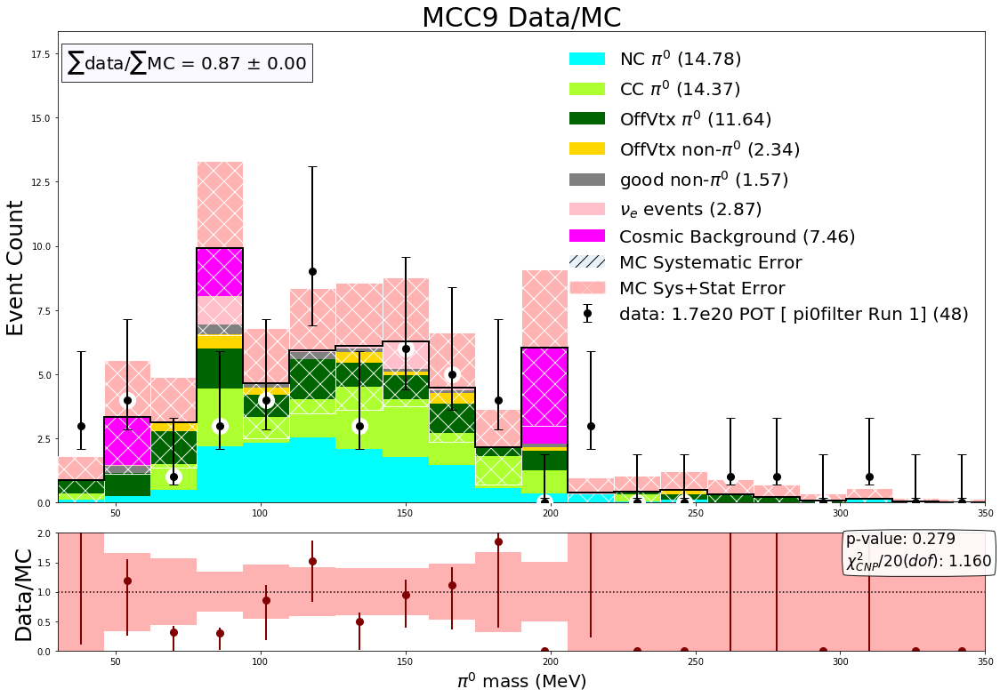

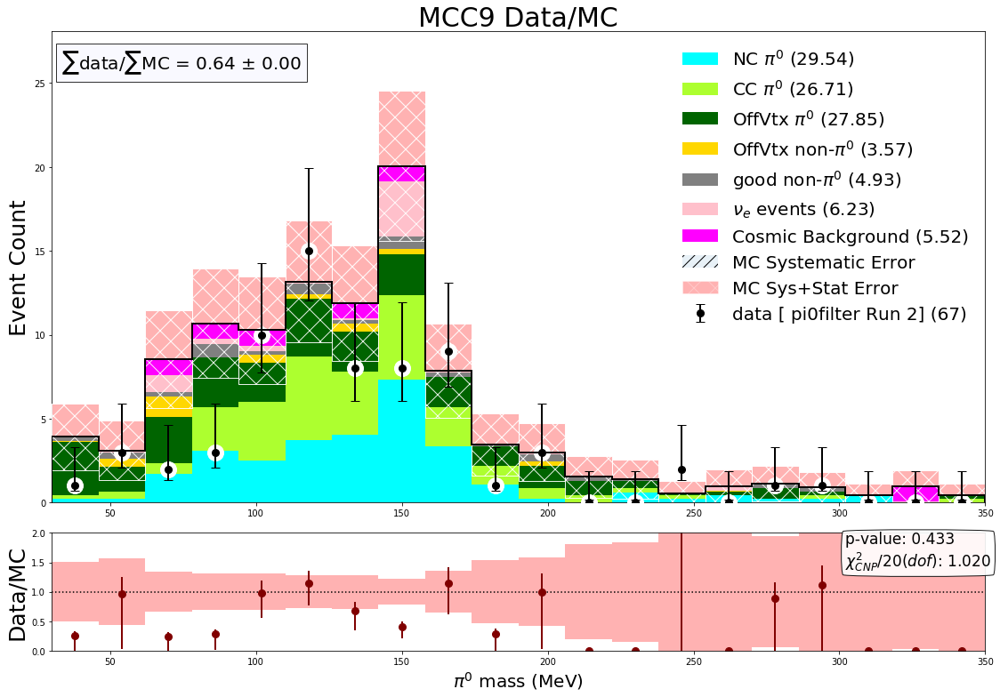

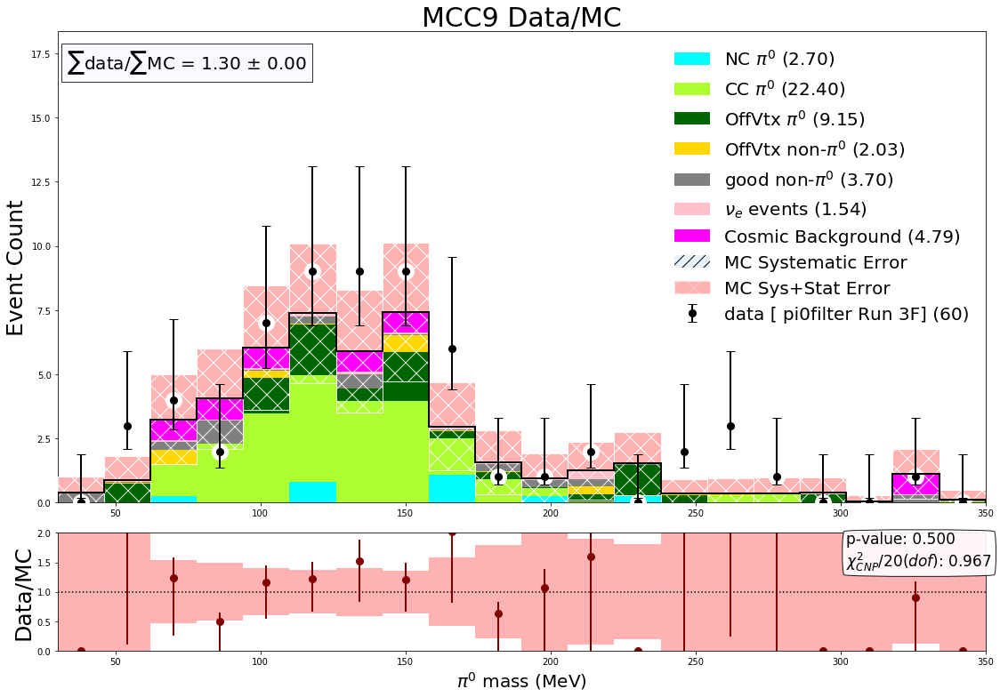

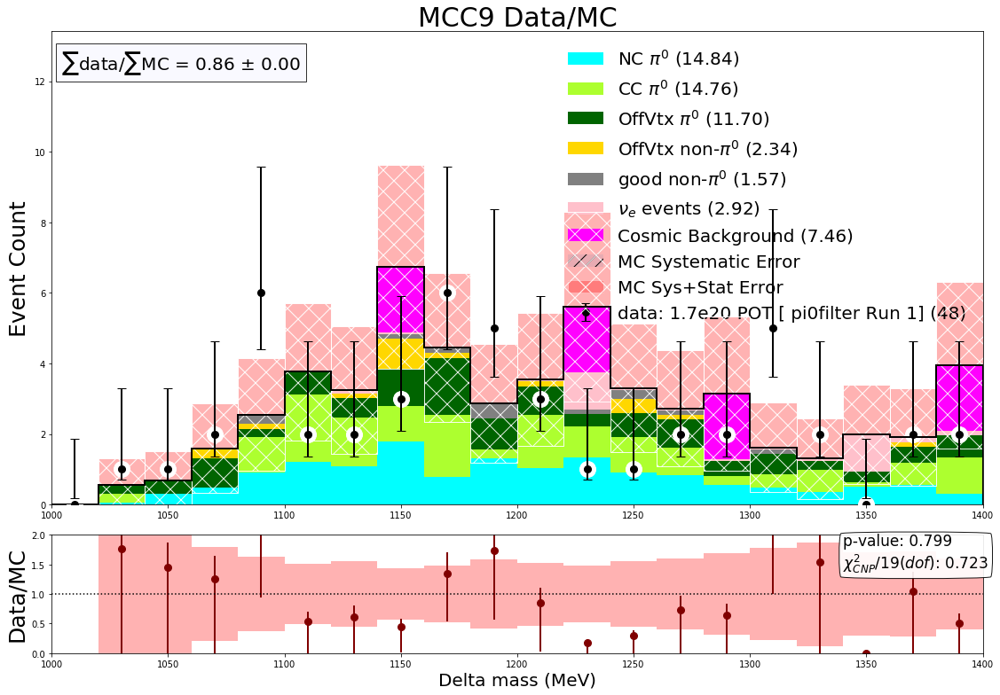

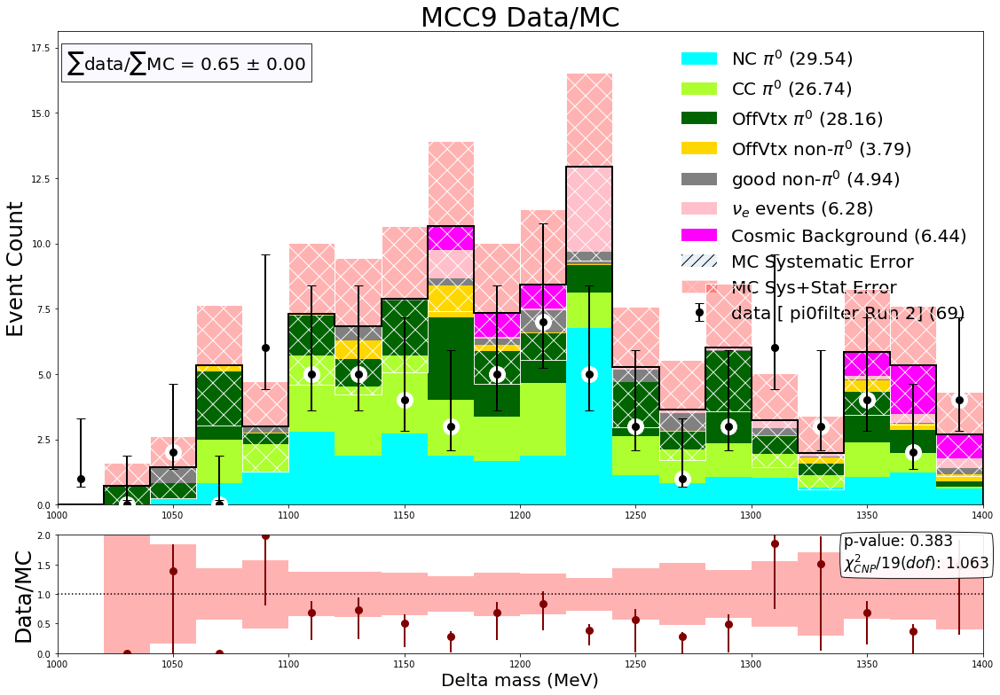

...

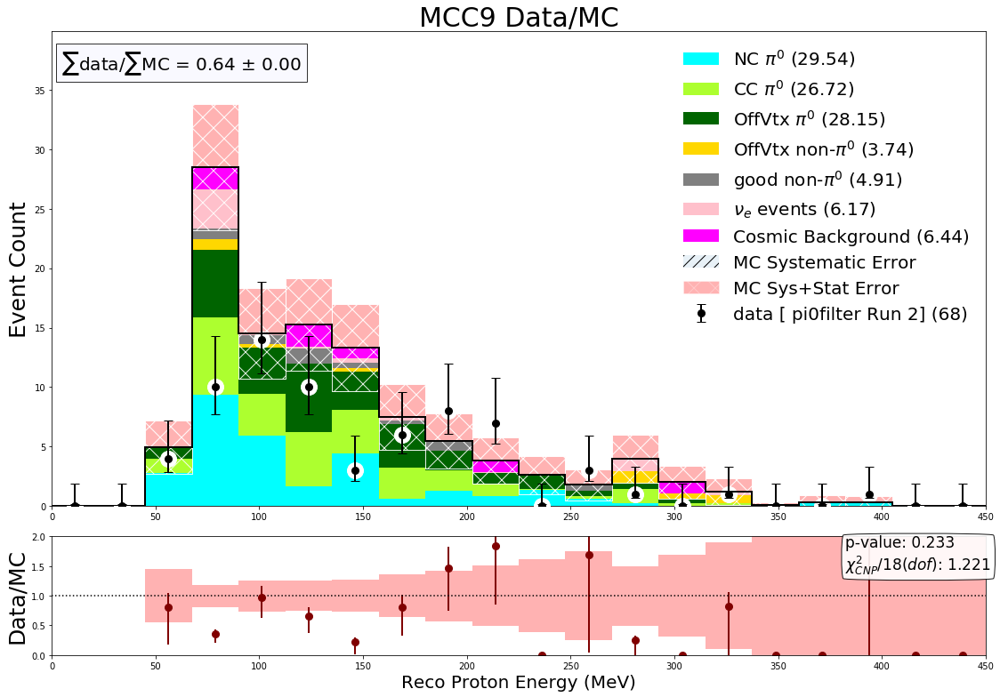

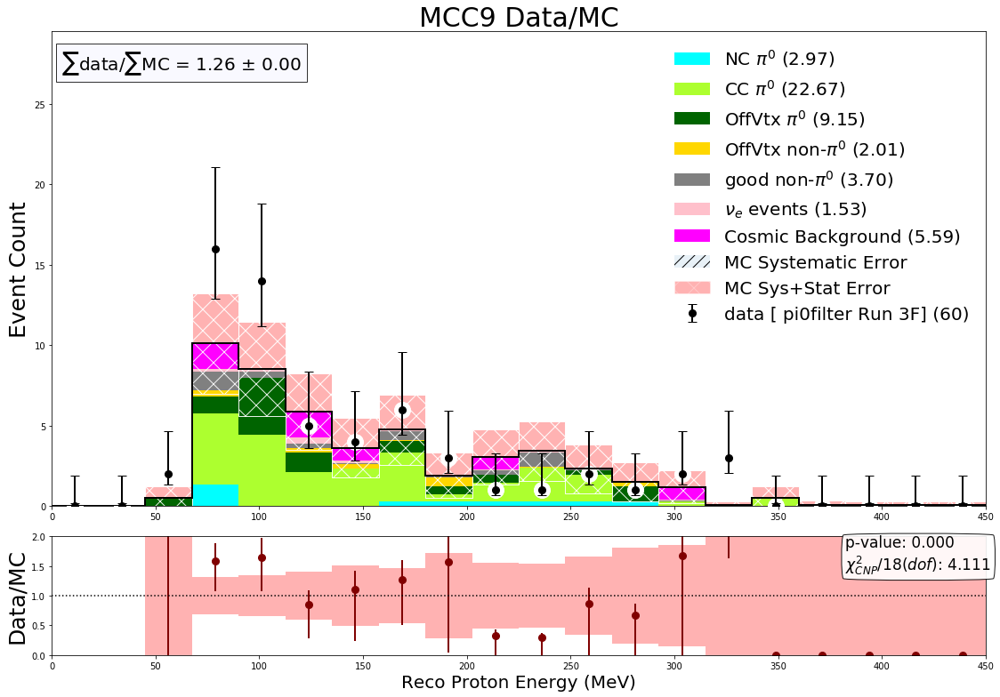

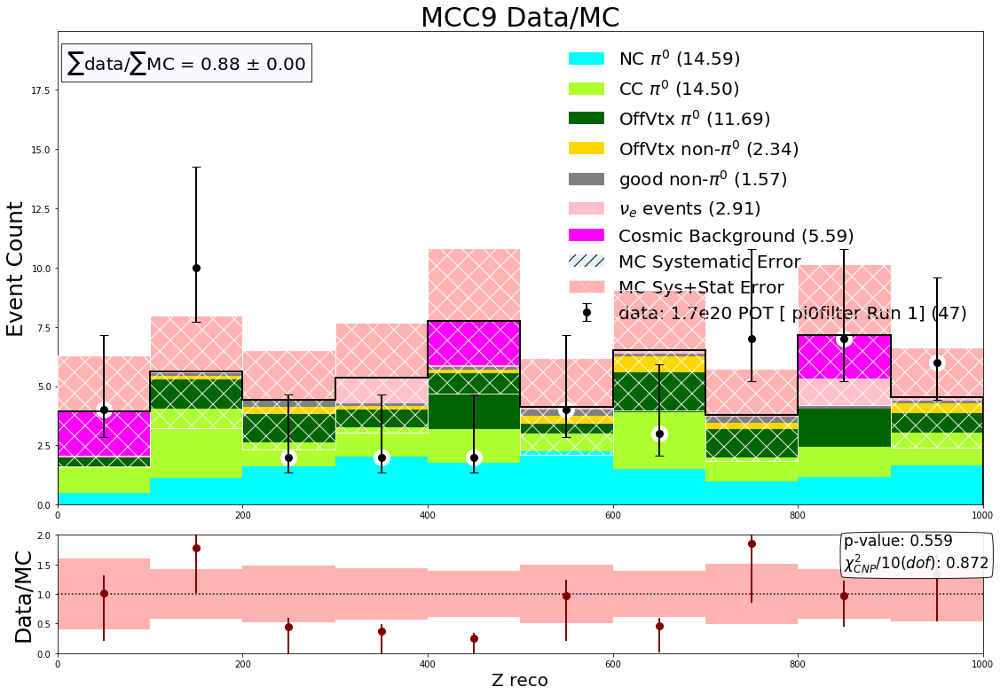

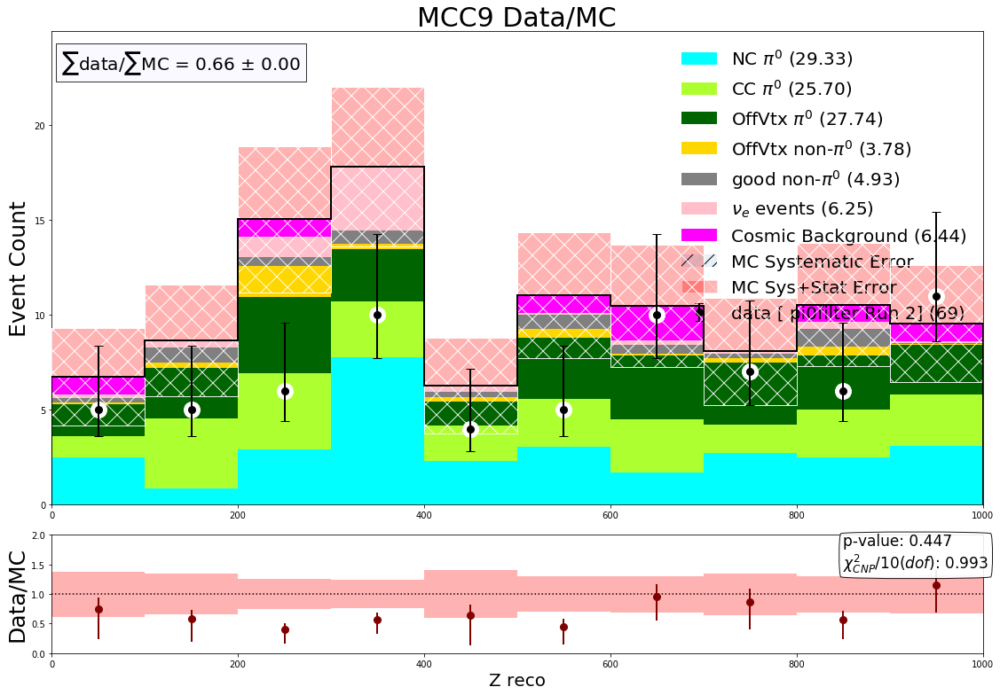

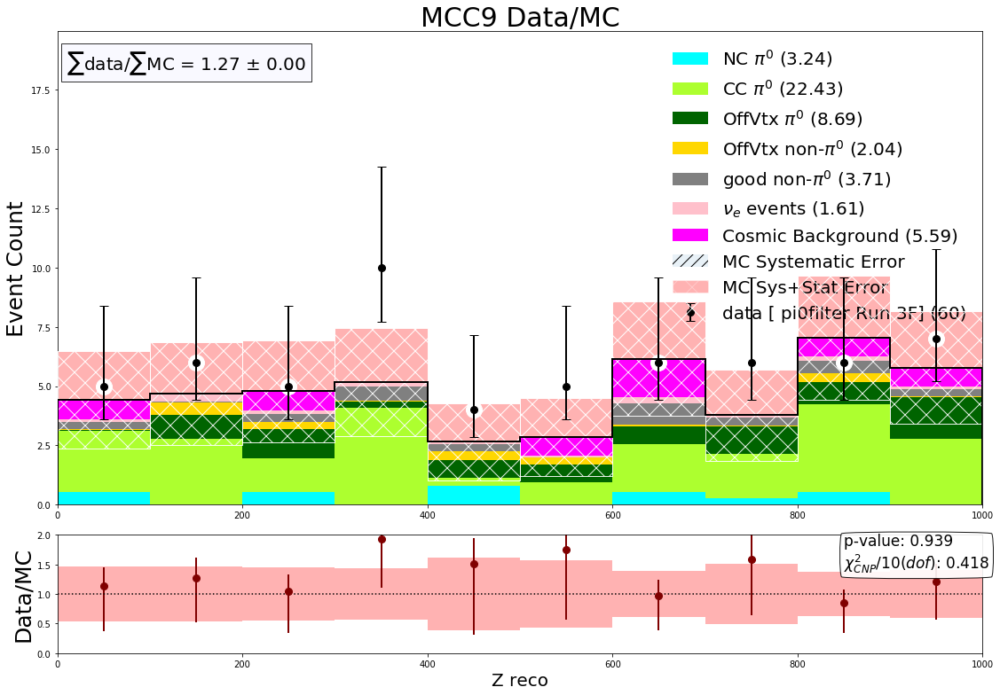

In [23]:
# individual runs again

EXT_R2_PI0FILTER_POT = EXT_R2D_PI0FILTER_POT +EXT_R2E_PI0FILTER_POT
EXT_R3_PI0FILTER_POT = EXT_R3F_PI0FILTER_POT +EXT_R3G_PI0FILTER_POT
EXT_R2_PI0FILTER_SCALE =  (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT)/ float(EXT_R2_PI0FILTER_POT)
EXT_R3_PI0FILTER_SCALE =  (DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)/ float(EXT_R3_PI0FILTER_POT)

norm = 1.0
with PdfPages('output_20210205_individualruns_original.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]

        cov = np.zeros((nbins,nbins))
        run1_pi0filter_Hists = StackedHisto((df_numu_1mil_pi0.query('newhaspi0==0'),df_nue_pi0,df_ccpi0_r1_pi0,df_ncpi0_r1_pi0),(1.0,1.0,1.0,1.0))
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_pi0filter_Hists.AddStrata('haspi0==1  and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run1_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run1_pi0filter_Hists.AddLayer(df_ext_pi0,EXT_R1_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run1_pi0filter_DataHist = SimpleHisto(df_data_r1_pi0filter_pi0,1.0,0,'','data: 1.7e20 POT [ pi0filter Run 1]')
        fig3,ax3,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_pi0filter_Hists,run1_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r2=df_data_r2D_pi0filter_pi0.append(df_data_r2E_pi0filter_pi0)
        run2D_pi0filter_Hists = StackedHisto((df_numu_r2_1mil_pi0,df_nue_r2_pi0),(1.0,1.0))
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run2D_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run2D_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run2D_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run2D_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R2_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run2D_pi0filter_DataHist = SimpleHisto(df_data_r2,1.0,0,'','data [ pi0filter Run 2]')
        fig4,ax4,_,a = distplot_wratio_davio(vartest,nbins,myrange,run2D_pi0filter_Hists,run2D_pi0filter_DataHist,varname,m_cov=cov)

        cov = np.zeros((nbins,nbins))
        df_data_r3=df_data_r3F_pi0filter_pi0.append(df_data_r3G_pi0filter_pi0)
        run3F_pi0filter_Hists = StackedHisto((df_numu_r3_pi0.query('newhaspi0==0'),df_nue_r3_pi0,df_ccpi0_r3_pi0,df_ncpi0_r3_pi0),(1.0,1.0,1.0,1.0))
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run3F_pi0filter_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr>=5 ',r"OffVtx non-$\pi^0$",'gold')
        run3F_pi0filter_Hists.AddStrata('haspi0==0 and MC_scedr<5',r"good non-$\pi^0$",'grey')
        run3F_pi0filter_Hists.AddStrata('MC_parentPDG ==12',r"$\nu_e$ events",'pink')
        run3F_pi0filter_Hists.AddLayer(df_ext_r3_pi0,EXT_R3_PI0FILTER_SCALE*norm,0,'Cosmic Background','fuchsia')
        run3F_pi0filter_DataHist = SimpleHisto(df_data_r3,1.0,0,'','data [ pi0filter Run 3F]')
        fig6,ax6,_,a = distplot_wratio_davio(vartest,nbins,myrange,run3F_pi0filter_Hists,run3F_pi0filter_DataHist,varname,m_cov=cov)

        #save to pdf file of plots
#         pdf.savefig(fig1)
#         pdf.savefig(fig3)
#         pdf.savefig(fig4)
#         pdf.savefig(fig5)
#         pdf.savefig(fig6)
#         pdf.savefig(fig7)

In [24]:
print(len(df_numu_pi0.query('newhaspi0==1 and MC_scedr<5 and ccnc==0'))*(DATA_R1_PI0FILTER_POT)/NUMU_R1_POT)
print(len(df_ccpi0_r1_pi0.query('MC_scedr<5'))*(DATA_R1_PI0FILTER_POT)/CCPI0_R1_POT)
print(len(df_ext_total))

90.34680171749422
13.057134310499551
18



True
True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [ 1.49033792  4.74400342 10.42026768 18.53639381 18.63191777 20.86258576
 17.96034527 21.82419928 10.71595074  5.72413154  8.03557381  1.24414789
  3.50105266  1.28727145  0.71855215  1.00214523  1.25947913  0.4095679
  1.94324662  0.31394963]
Normalization Uncertainty: 0.22967059314954383
yerr_mc_total [1.26655986 3.02552189 4.03736782 6.91073736 6.30465461 7.12343175
 6.42615195 6.90612497 4.12866626 2.80018952 5.16345138 1.18384044
 2.14238026 1.20230906 0.87868657 1.08670054 1.19060637 0.65380874
 1.28649447 0.5712869 ]
yerr_data 46.76590889010061
ERROR HERE
[ 0.78151917  0.40487461  0.17562695  0.0982855   0.19987501  0.23042403
  0.20132265  0.17997223  0.33136505  0.2771626   0.10345885  1.11318953
 -0.04961525  0.90480345  1.62093683  0.91739832  0.23553039  0.7242892

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [ 0.          0.78130221  1.29488116  5.42129584  7.34401572  9.78981171
  9.79842476 12.97078766 13.36867369 11.17166411 13.61831584  8.310598
  8.63605599 11.27776213  6.78119271  5.43599811  4.8123958   8.1815398
  6.99434034  7.93116946]
Normalization Uncertainty: 0.22786852402946037
yerr_mc_total [0.         0.92689399 1.18232518 2.65185037 3.08605625 3.93169509
 3.98719519 5.34650582 4.85841509 4.47030005 4.99035565 4.43247545
 3.71686865 4.29643557 3.9922355  2.76850461 2.58897252 3.57047859
 3.02153268 4.34468702]
yerr_data 53.01697476902779
ERROR HERE
[0.         0.37968101 0.71000055 0.16958424 0.45279055 0.28953072
 0.23173479 0.18530699 0.21726355 0.26126063 0.20318975 0.24394131
 0.26292511 0.14067642 0.18904308 0.4969772  0.40489431 0.20187218
 0.24987334 0.21134007]


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: divide by zero encountered in true_divide


True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [ 1.20081772 12.55898946 21.97216947 15.96008522 16.08426048 15.48204052
 15.56782729  9.6203143  10.42643499  6.85485963  5.111457    5.48779829
  7.01574439  1.32950995  2.44967099  3.73802429  0.34441864  0.75602079
  0.61786682  0.06505921]
Normalization Uncertainty: 0.22753199036354238
yerr_mc_total [1.13910017 4.52180092 7.06454107 5.95576762 5.80811456 6.47851315
 5.42718538 3.75697937 3.98594012 3.06360763 2.42881369 2.48285359
 4.01237076 1.20868996 1.4875301  3.2266963  0.59706382 0.91650438
 0.82784966 0.25694093]
yerr_data 48.308505055160815
ERROR HERE
[ 0.96994542  0.29139198  0.20134441  0.23605276  0.15939356  0.17333648
  0.20250573  0.22733917  0.25373634  0.25871203  0.53534503  0.22549225
  0.10656973  0.69150768 -0.08166159  0.11921938  0.86129371 -0.22976301
  

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [12.4144075  14.08209426 20.60599517 13.31522107 11.63467325 12.38905034
 10.23625883  8.70118731  5.42815722  6.72820191  7.72136119  3.49526027
  5.61719751  3.98200541  0.65793921  3.38618175  0.27244641  0.53940844
  0.48122265  0.29075096]
Normalization Uncertainty: 0.22642670506274698
yerr_mc_total [4.47329779 4.9962849  6.6209986  5.35651223 4.7269279  5.41473935
 4.015513   3.51406932 2.66213493 2.94994823 2.99897997 2.04390027
 3.50992    2.27331596 0.82959917 3.18922862 0.52928713 0.76104361
 0.71564708 0.55402155]
yerr_data 47.23545710596847
ERROR HERE
[ 0.25840663  0.29604044  0.17231308  0.21772756  0.23219966  0.12667205
  0.24413878  0.23255659  0.47230164  0.20584585  0.32087905  0.2630323
  0.13312919  0.16015191  0.45087085  0.05936074  1.08882188  0.54994618
 -0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [12.07523374 18.14431735 14.56083928 11.76119312 14.93381595  9.0135978
  9.68478555 10.27997797  6.02789763  8.03763276  5.67645055  6.61345442
  4.49838765  4.16755581  1.95217961  2.84010982  2.58935426  1.51601343
  1.08480458  0.81829356]
Normalization Uncertainty: 0.23055366661583088
yerr_mc_total [4.53008777 5.94615824 5.27034409 4.49831425 5.58075346 3.9108241
 4.70034479 3.88428466 3.03108982 3.60996283 2.65195367 2.92573272
 2.5057068  2.2331765  1.48223935 3.00823007 1.64483818 1.37950082
 1.16149892 0.97971437]
yerr_data 50.78988801077753
ERROR HERE
[ 0.31186208  0.20169339  0.20348239  0.33767226  0.16566336  0.23450683
  0.22696009  0.23566745  0.32324897  0.17231098  0.21754674  0.30973383
  0.39423784  0.15302153  0.70944927  0.20654049 -0.07662955  0.42065971
  0.2

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [19.4587581  29.49085605 15.61345458 11.54463432 19.0146063   8.67599707
  8.66796984  8.72376965  6.71607349  5.19459833  3.50185523  3.03471219
  2.89115997  1.95985129  0.29557332  0.36464919  0.65109554  1.47738815
  0.29075096  0.33227346]
Normalization Uncertainty: 0.22612580804435906
yerr_mc_total [6.3318071  9.49459353 5.49550879 4.42859748 6.68516214 3.65660722
 3.7091865  3.55391337 3.99403573 2.53941186 2.165759   1.97475225
 2.02135967 1.66299975 0.56321687 0.63069403 0.92206317 2.080001
 0.63908908 0.66085029]
yerr_data 46.16003373071797
ERROR HERE
[ 0.19886691  0.12865462  0.27314983  0.34400645  0.13742721  0.24363197
  0.15978048  0.18884302  0.253836    0.23906232  0.45304991  0.21014374
  0.40285825  0.59429389  1.00362784  1.74887479 -0.26678975  0.20079057
 -0.5

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [87.59766167 66.32256337  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.        ]
Normalization Uncertainty: 0.24438549520885053
yerr_mc_total [23.47431873 19.48346579  0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.        ]
yerr_data 18.00471695029195
ERROR HERE
[0.09264289 0.12689312 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.        ]
[0.11481805 0.15632894 0.         0.         0.  

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [0.00000000e+00 0.00000000e+00 0.00000000e+00 1.13935977e+01
 3.08401745e+01 2.19182637e+01 2.74815473e+01 2.74244780e+01
 1.10102055e+01 7.84626196e+00 4.01119406e+00 4.81609715e+00
 1.82524973e+00 1.24626277e+00 2.10027152e+00 9.19915253e-01
 7.29762304e-02 5.41368227e-02 1.05399442e-01 2.26857687e-02]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         0.         3.37544037 5.72151177 4.68169453
 5.5620622  5.18117789 3.22960244 2.69562393 2.93699335 3.07096614
 1.35101803 1.1163614  1.23304416 0.95912213 0.27014113 0.23267321
 0.3246528  0.15061796]
yerr_data 40.06567594746003
ERROR HERE
[ 0.          0.          0.          0.30188267  0.16124779  0.24194999
  0.13602897  0.12269602  0.2888617   0.28094444  0.31542594  0.09922215
  0.50369346  0.9345763  -0.097

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [ 0.          0.          4.25628578 34.03886618 25.15525228 19.37806865
 17.76830862 13.5510622   6.13226505  8.44818964  6.54135105  8.14367513
  4.75520773  2.73137274  0.877415    1.04341107  0.18516638  0.23726435
  0.11668057  0.04922272]
Normalization Uncertainty: 0.0
yerr_mc_total [0.         0.         2.06307677 6.32212392 5.0155012  4.26829257
 4.66938656 3.68117674 2.47634106 2.80505188 2.55760651 3.5718918
 2.18064388 1.46679894 0.93670433 1.02147495 0.43030964 0.48709789
 0.34158538 0.22186195]
yerr_data 42.81992776432584
ERROR HERE
[ 0.          0.          0.45779625  0.13875727  0.19785579  0.20657139
  0.11915013  0.23673164  0.50344526  0.27944024  0.04534929  0.1997484
  0.19333884  0.38166329  1.57846904  0.28430368 -0.93810556  1.25027468
 -1.48872787 -3.52897

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide


True
264
544
335
35
45
555
hstack gh_weights [0.13061237 0.13061237 0.13061237 ... 0.7978831  0.7978831  0.7978831 ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [12.54927086 15.01313543 16.39690687 15.84237642 11.48749791 10.73525521
 18.60314113 12.14768189 20.87516119 16.46075321]
Normalization Uncertainty: 0.0
yerr_mc_total [4.07236211 3.87467875 3.9770634  3.98024829 4.01275887 3.18675095
 4.17652893 3.48535248 4.77186375 3.98508213]
yerr_data 39.46463396356046
ERROR HERE
[0.20483255 0.24375913 0.16806669 0.23770471 0.17334882 0.27221035
 0.19153105 0.29231022 0.16059907 0.24608837]
[0.34871496 0.3763569  0.29193482 0.36336001 0.32537978 0.46342156
 0.30238795 0.45618854 0.25355275 0.36943695]
chi2 in bins
0.0008622720472955879
1.134158127511478
0.30770680763768987
1.1381195029497013
0.3432272514219172
0.5974111308310704
0.03037847306301773
2.3601905469525306
0.13485118757349773
1.8180161517709754
0.7864921451759174 0.6420293391957296


/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



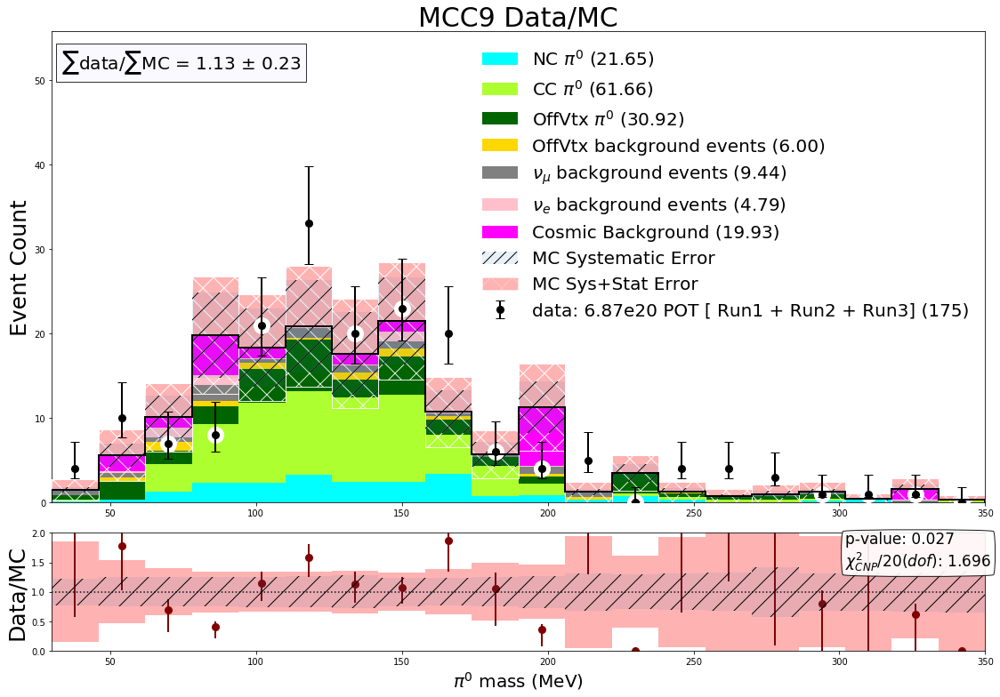

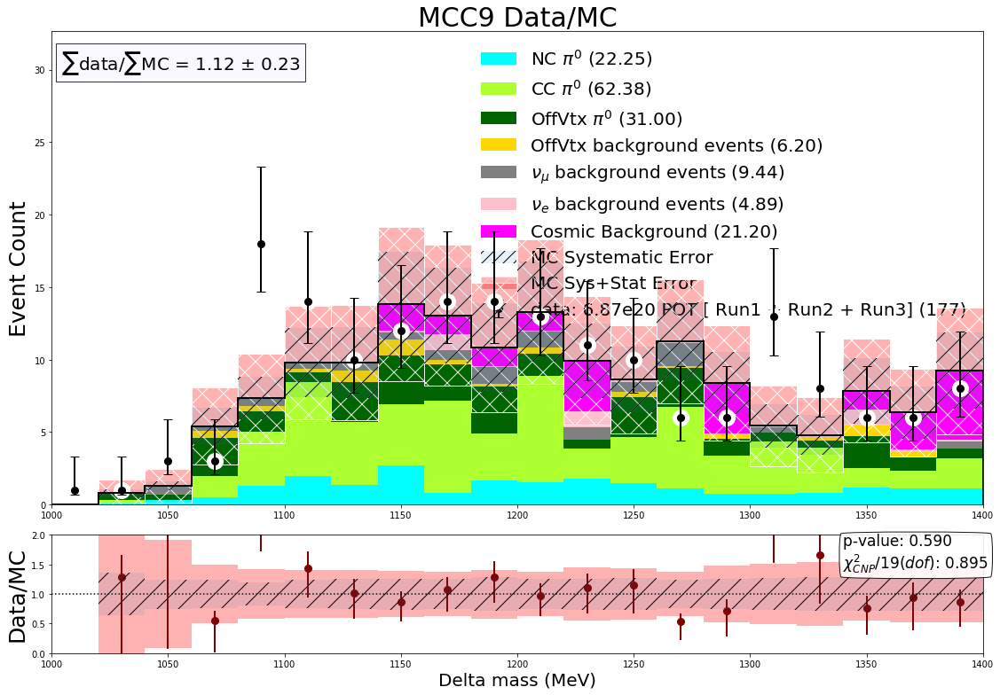

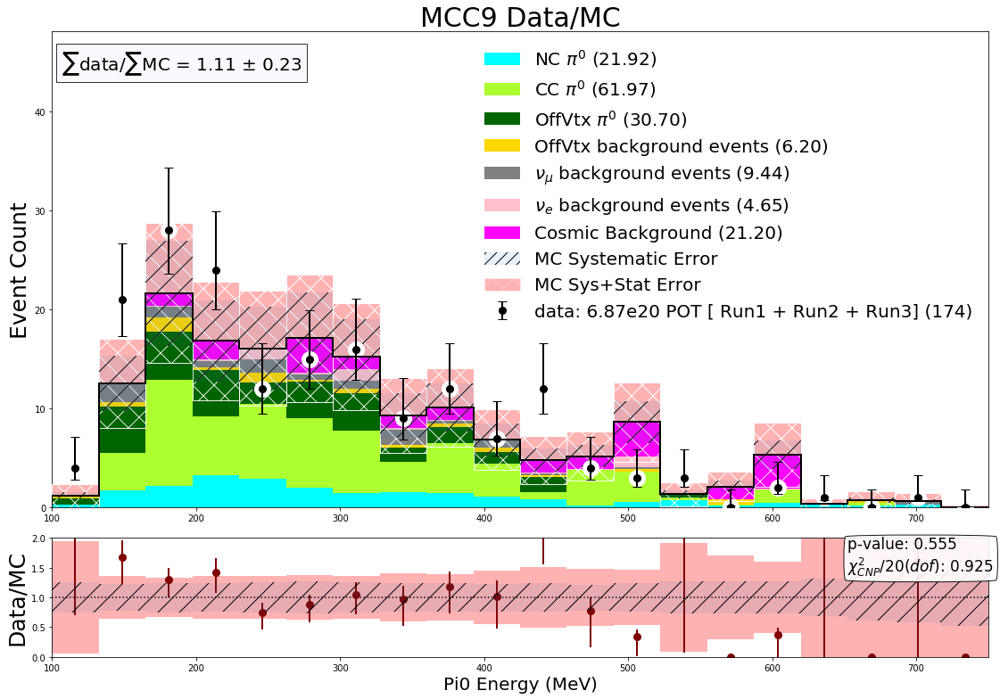

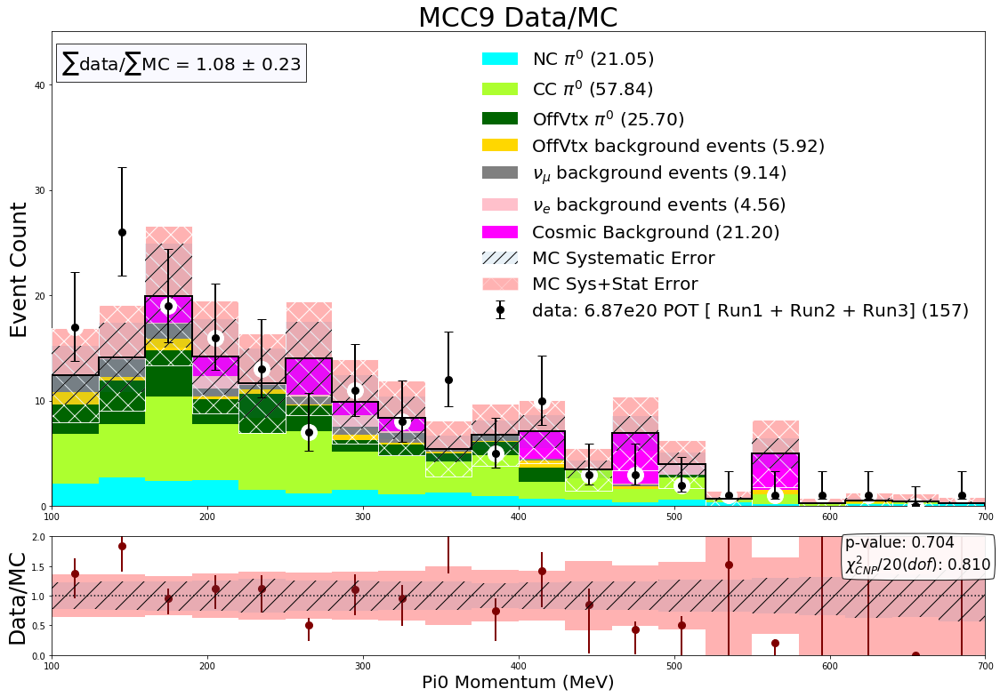

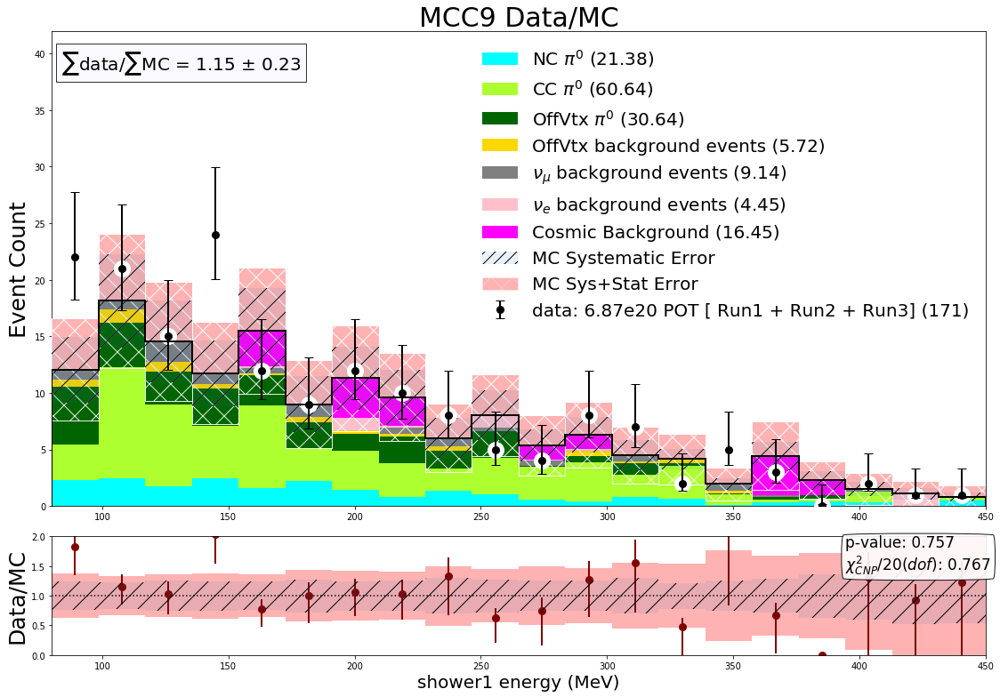

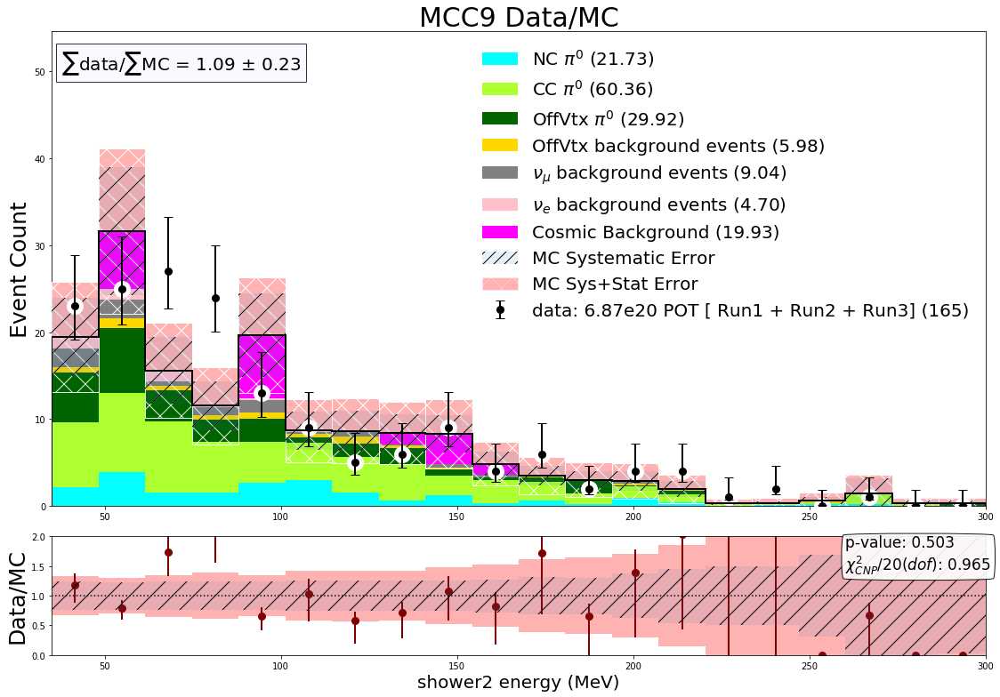

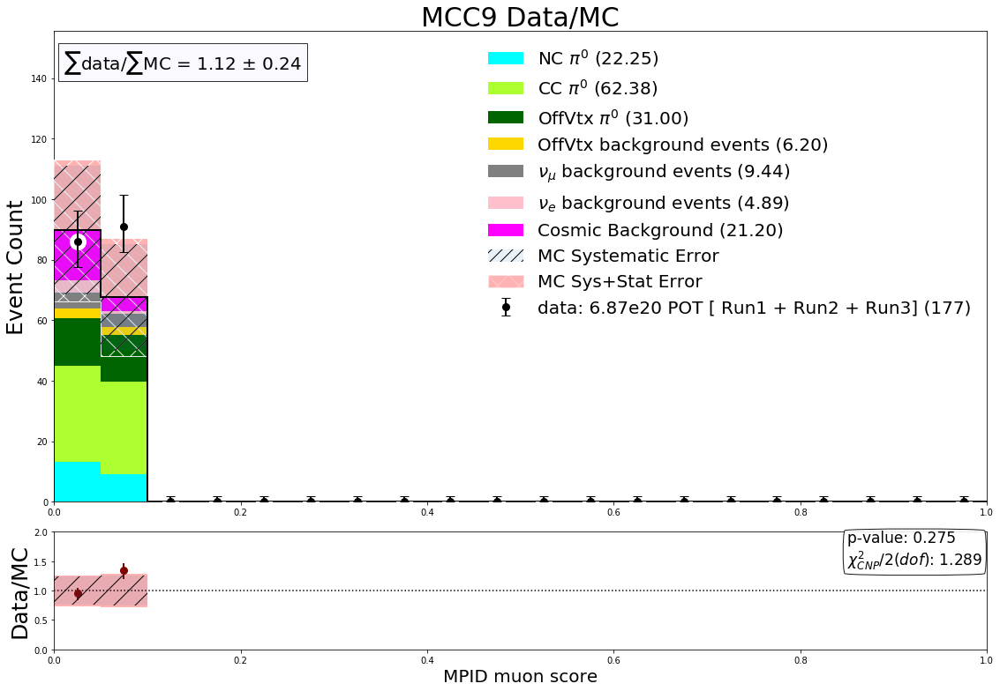

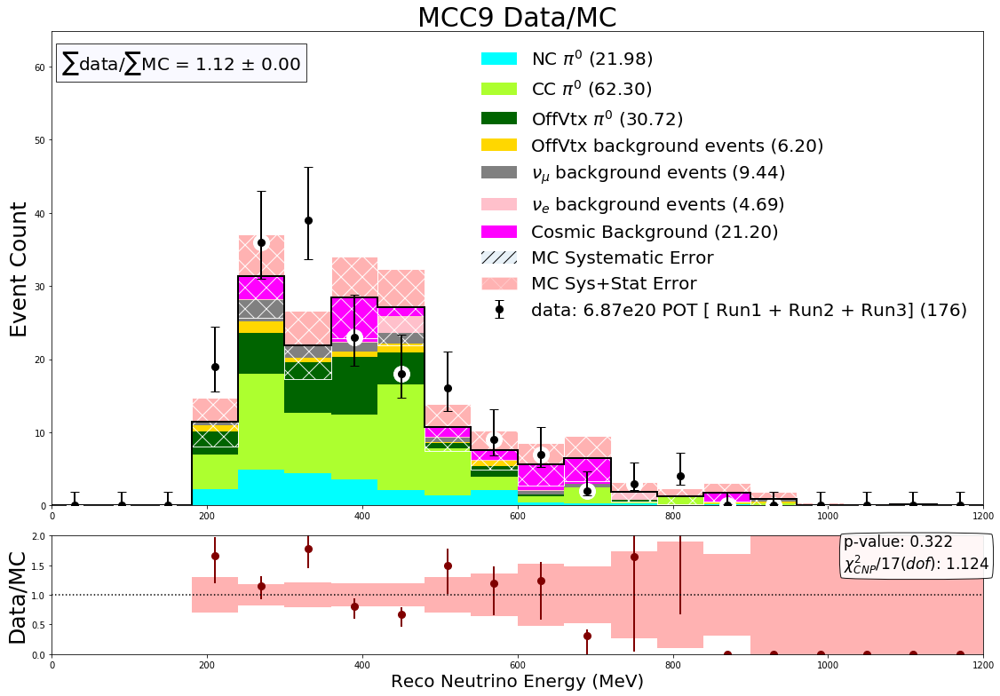

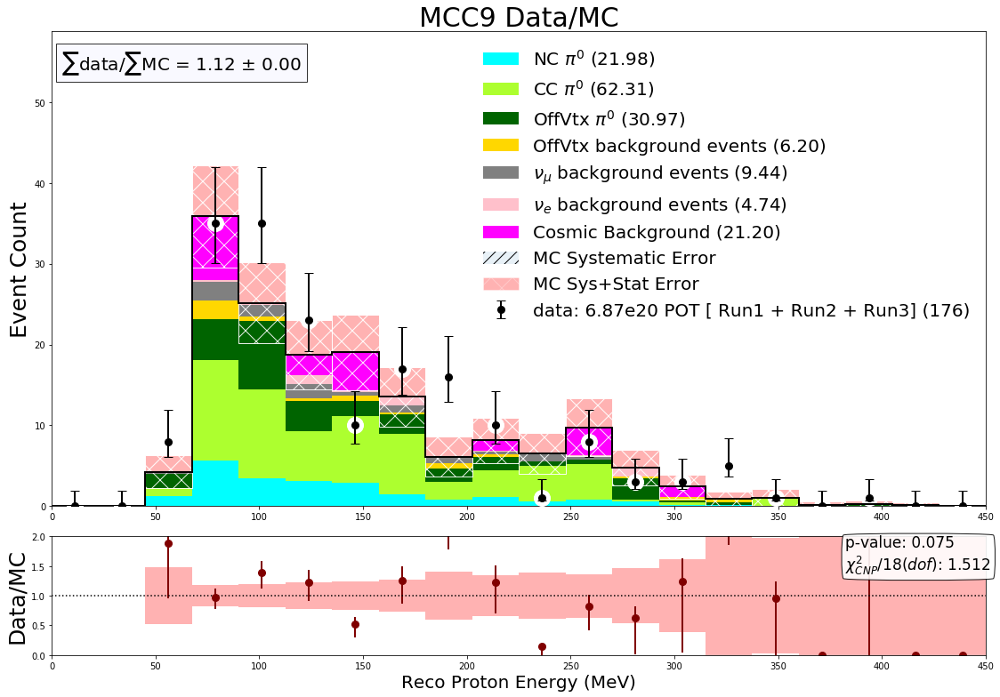

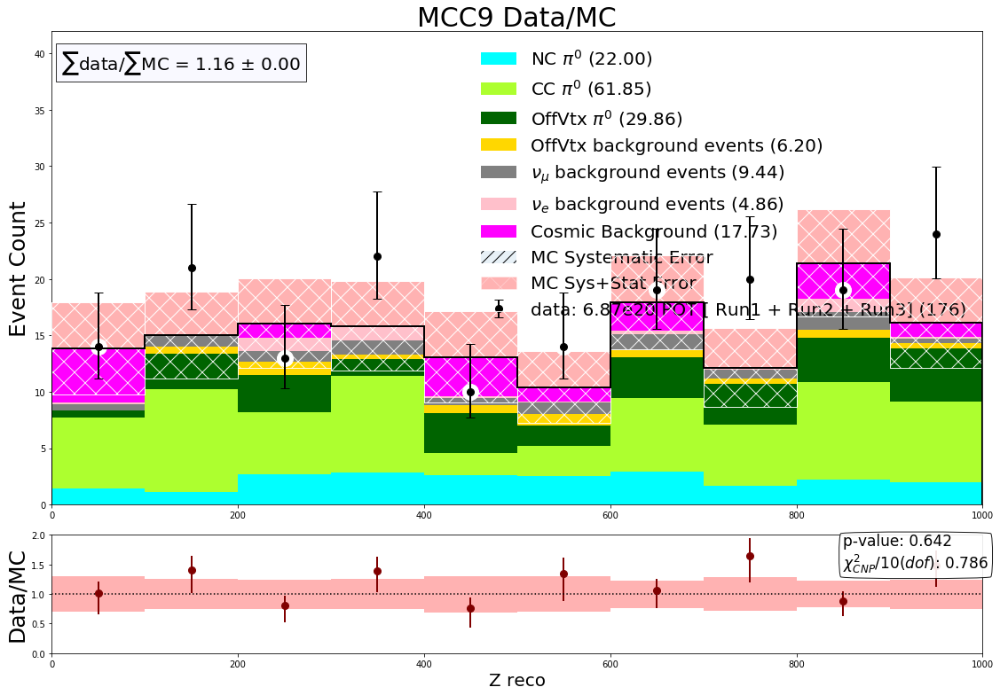

In [25]:
norm = 1.0
print()
print('xsec_corr_weight' in df_nue_total.keys())
with PdfPages('output_combined_20210205_highstatsrun1.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = s_cov +d_cov
#         cov = np.zeros((nbins,nbins))
        print('xsec_corr_weight' in df_ccpi0_total.keys())
        run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG == 12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
        run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
        run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],1.0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 6.87e20 POT [ Run1 + Run2 + Run3]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
#         ax1.text(10,330, 'MicroBooNE',
#         color='black', fontsize=24)
#         ax1.set_title(r"Reconstructed $\pi^0$ Mass, Data and MC Comparison",fontsize=25)
#         ax1.set_xlabel(varname_list[i],fontsize=25)
#         ax1.set_ylabel('Event Count',fontsize=25)
        fig1.savefig(vartest_list[i]+'_1e1p.png')

In [30]:
# # # plot the resolution distributions
# import SupportingFunctions as SF
# # first cut for events with a true pi0 with two contained showers.
# contained_pi0='haspi0==1 and shower_energy_true >=0 and secondshower_energy_true >=0 '
# df_numu_total.query(contained_pi0+'and (newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14')
# df_nue_total.query(contained_pi0+'and MC_parentPDG ==12')
# df_ncpi0_total.query(contained_pi0)
# df_ccpi0_total.query(contained_pi0)

# df_nue_r1=df_nue_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7 ")
# df_nue_r2=df_nue_r2_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")
# df_nue_r3=df_nue_r3_goodruns_pmtprecut.query("MC_scedr<5 and haspi0==0 and shower_energy_true >=0 and shower1_E_Y_new>=0 and BDTscore_1e1p >.7")

# def getangleres(df):
# #     funtion to get the angle between true and reco shower directions
#     angleres= []
#     for i in range(len(df)):
#         recox1 = df['shower1_dir_3d_X'].values[i]
#         recoy1 = df['shower1_dir_3d_Y'].values[i]
#         recoz1 = df['shower1_dir_3d_Z'].values[i]
#         recox2 = df['shower2_dir_3d_X'].values[i]
#         recoy2 = df['shower2_dir_3d_Y'].values[i]
#         recoz2 = df['shower2_dir_3d_Z'].values[i]
        
#         truex1 = df['first_direction_true_X'].values[i]
#         truey1 = df['first_direction_true_Y'].values[i]
#         truez1 = df['first_direction_true_Z'].values[i]
#         truex2 = df['second_direction_true_X'].values[i]
#         truey2 = df['second_direction_true_Y'].values[i]
#         truez2 = df['second_direction_true_Z'].values[i]
        
#         dot1 = recox1*recox2+recoy1*recoy2+recoz1*recoz2
#         dot2 = truex1*truex2+truey1*truey2+truez1*truez2
        
#         magreco1 = sqrt(recox1**2+recoy1**2+recoz1**2)             
#         magreco2 = sqrt(recox2**2+recoy2**2+recoz2**2)
#         magtrue1 = sqrt(truex1**2+truey1**2+truez1**2)             
#         magtrue2 = sqrt(truex2**2+truey2**2+truez2**2) 
        
#         cosdir1 = dot1/(magreco1*magreco2)
#         cosdir2 = dot2/(magtrue1*magtrue2)
#         alpha1 = acos(cosdir1) * 180.0 / 3.14159
#         alpha2 = acos(cosdir2) * 180.0 / 3.14159

#         angleres.append((alpha1-alpha2)/alpha2)

#     return angleres




# def getenergyres(df):
# #     funtion to get the angle between true and reco shower directions
#     energyres1 = []
#     energyres2 = []
#     for i in range(len(df)):
#         reco1 = df['shower1_E_Y_new'].values[i]
#         reco2 = df['shower2_E_Y_new'].values[i]
#         if(reco2 >reco1):
#             reco2 = df['shower1_E_Y_new'].values[i]
#             reco1 = df['shower2_E_Y_new'].values[i]
#         true1 = df['gamma_1_true'].values[i]
#         true2 = df['gamma_2_true'].values[i]
#         if (true2>true1):
#             true2 = df['gamma_1_true'].values[i]
#             true1 = df['gamma_2_true'].values[i]
#         print(true1,true2)
        
#         energyres1.append((reco1-true1)/true1)
#         energyres2.append((reco2-true2)/true2)
# #         energyres2.append(-999)

#     return energyres1,energyres2

# # add all of the data frames
# # df_data_total = df_fakedata1_run1_pi0.append(df_fakedata1_run3_pi0)
# df_data_total_1 = df_data_r1_pi0filter_pi0.append(df_data_r3F_pi0filter_pi0)
# df_data_total = df_data_total_1.append(df_data_r3G_pi0filter_pi0)

# print("total number of data pi0: ",len(df_data_total['_pi0mass'].values))
# # scale CV weights:
# def potscale(df,scalefactor=1.0,ext=False):
#     pot_weight = []
#     for i in range(len(df)):
#         if ext==False:
#             pot_weight.append(scalefactor)
#         else:
#             pot_weight.append(scalefactor)
#     return pot_weight

# # general mc
# w_cc_1 =potscale(df_ccpi0_r1_pi0,DATA_R1_PI0FILTER_POT/CCPI0_R1_POT)
# w_cc_3 =potscale(df_ccpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(CCPI0_R3_POT))
# df_ccpi0_r1_pi0['pot_weight'] = w_cc_1
# df_ccpi0_r3_pi0['pot_weight'] = w_cc_3
# df_ccpi0_total = df_ccpi0_r1_pi0.append(df_ccpi0_r3_pi0)

# w_nc_1 =potscale(df_ncpi0_r1_pi0,DATA_R1_PI0FILTER_POT/NCPI0_R1_POT)
# w_nc_3 =potscale(df_ncpi0_r3_pi0,(DATA_R3G_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT)/(NCPI0_R3a_POT+NCPI0_R3b_POT))
# df_ncpi0_r1_pi0['pot_weight'] = w_nc_1
# df_ncpi0_r3_pi0['pot_weight'] = w_nc_3
# df_ncpi0_total = df_ncpi0_r1_pi0.append(df_ncpi0_r3_pi0)

                 


# a1_cc = getangleres(df_ccpi0_total)
# e1_cc,e2_cc = getenergyres(df_ccpi0_total)
# df_ccpi0_total["AngleRes"]=a1_cc
# # df_ccpi0_total["AngleRes2"]=a2_cc
# df_ccpi0_total["EnergyRes1"]=e1_cc
# df_ccpi0_total["EnergyRes2"]=e2_cc

# a1_nc = getangleres(df_ncpi0_total)
# e1_nc,e2_nc = getenergyres(df_ncpi0_total)
# df_ncpi0_total["AngleRes"]=a1_nc
# # df_ncpi0_total["AngleRes2"]=a2_nc
# df_ncpi0_total["EnergyRes1"]=e1_nc
# df_ncpi0_total["EnergyRes2"]=e2_nc


In [31]:
# vartest_list = []
# varname_list = []
# vartitle_list = []
# myrange_list = []
# detvar_list  = []
# sys_list = []
# bins_list = []


# vartest_list.append('AngleRes')
# varname_list.append('Opening Angle Resolution')
# vartitle_list.append(r'Opening Angle Resolution of $\pi^0$ decay events')
# # myrange_list.append((-1,1))
# myrange_list.append((-1,2))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)

# # vartest_list.append('AngleRes2')
# # varname_list.append('Cosine Angle between true and reco subleading showers')
# # myrange_list.append((-1,1))
# # # myrange_list.append((0,180))
# # detvar_list.append('none')
# # sys_list.append('none')
# # bins_list.append(20)

# vartest_list.append('EnergyRes1')
# varname_list.append('Energy Resolution')
# vartitle_list.append('Energy Resolution of leading photon')
# myrange_list.append((-1,2))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)

# vartest_list.append('EnergyRes2')
# varname_list.append('Energy Resolution')
# vartitle_list.append('Energy Resolution of sub-leading photon')
# myrange_list.append((-1,2))
# detvar_list.append('none')
# sys_list.append('none')
# bins_list.append(20)



# for i in range(len(vartest_list)):
#     vartest = vartest_list[i]
#     varname = varname_list[i]
#     myrange = myrange_list[i]
#     nbins =bins_list[i]

#     cov = np.zeros((nbins,nbins))
#     run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
#     run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
#     run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
#     run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
# #     run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
# #     run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
# # #         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
# #     run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
#     fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
#     ax1.text(1.1,180, 'MicroBooNE Simulation',
#         color='black', fontsize=24)
#     ax1.set_title(vartitle_list[i],fontsize=25)
#     ax1.set_xlabel(varname_list[i],fontsize=25)
#     ax1.set_ylabel('Event Count',fontsize=25)
#     fig1.savefig(vartest_list[i]+'_20210413.png')

# # Pause and do a gaussian fit to the distribution
# df_res1=df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14').append(df_nue_total.query('MC_parentPDG ==12')) 
# df_res2=df_res1.append(df_ncpi0_total)
# df_res = df_res2.append(df_ccpi0_total)

# var_eres1 = df_res['EnergyRes1'].values
# var_eres2 = df_res['EnergyRes2'].values
# var_ares = df_res['AngleRes'].values
# weightsmc =[df_res['pot_weight'].values[i]*df_res['xsec_corr_weight'].values[i] for i  in range(len(var_eres1))]


# # set up histograms
# mc_y,mc_x = np.histogram(var_eres1,bins = 20, range = [-1,2],weights=weightsmc)
# mc_y = list(mc_y)
# mc_y =ar([0]+mc_y)

# mc_y2,mc_x2 = np.histogram(var_eres2,bins = 20, range = [-1,2],weights=weightsmc)
# mc_y2 = list(mc_y2)
# mc_y2 =ar([0]+mc_y2)

# mc_y3,mc_x3 = np.histogram(var_ares,bins = 20, range = [-1,2],weights=weightsmc)
# mc_y3 = list(mc_y3)
# mc_y3 =ar([0]+mc_y3)


# #general fit format, any function. You could use 'gaus' as above, or some other function f you can define
# #popt,pcov = curve_fit(FUNCTION,x,y,p0 = [the fittable parameters defined in your function. these are just seeds]
# #this will work fine unless your seeds are wildly far from the best answer
# mc_mean = sum(mc_x*mc_y)/sum(mc_y)
# mc_sigma = np.sqrt(sum(mc_y * (mc_x - mc_mean)**2) / sum(mc_y))
# mc_p0 = [0, mc_mean,mc_sigma]
# mc_popt,mc_pcov = curve_fit(SF.gaus,mc_x,mc_y,p0=mc_p0,maxfev = 100000000)
# print("leading photon")
# print ('Gaussian mean = ', mc_popt[1])
# print ('Gaussian error = ', sqrt(mc_pcov[1,1]))
# print ('Guassian standard deviation  ', mc_popt[2])
# print ('Gaussian error = ', sqrt(mc_pcov[2,2]))

# mc_mean = sum(mc_x2*mc_y2)/sum(mc_y2)
# mc_sigma = np.sqrt(sum(mc_y2 * (mc_x2 - mc_mean)**2) / sum(mc_y2))
# mc_p0 = [0, mc_mean,mc_sigma]
# mc_popt,mc_pcov = curve_fit(SF.gaus,mc_x2,mc_y2,p0=mc_p0,maxfev = 100000000)
# print("subleadingphoton")
# print ('Gaussian mean = ', mc_popt[1])
# print ('Gaussian error = ', sqrt(mc_pcov[1,1]))
# print ('Guassian standard deviation  ', mc_popt[2])
# print ('Gaussian error = ', sqrt(mc_pcov[2,2]))

# mc_mean = sum(mc_x3*mc_y3)/sum(mc_y3)
# mc_sigma = np.sqrt(sum(mc_y3 * (mc_x3 - mc_mean)**2) / sum(mc_y3))
# mc_p0 = [0, mc_mean,mc_sigma]
# mc_popt,mc_pcov = curve_fit(SF.gaus,mc_x3,mc_y3,p0=mc_p0,maxfev = 100000000)
# print("opening angle")
# print ('Gaussian mean = ', mc_popt[1])
# print ('Gaussian error = ', sqrt(mc_pcov[1,1]))
# print ('Guassian standard deviation  ', mc_popt[2])
# print ('Gaussian error = ', sqrt(mc_pcov[2,2]))

In [32]:
# # make 2d hist:
# import matplotlib

# var_reco =df_nue_r1['shower1_E_Y_new'].values
# var_true =df_nue_r1['shower_energy_true'].values

# x = [i for i in range(80,1000)]
# y = [i for i in range(80,1000)]

# plt.hist2d(var_true, var_reco, bins=(20, 20), range = ((80,1000),(80,1000)))
# plt.plot(x,y,'--',color = 'black')
# plt.xlabel('true leading shower energy (MeV)')
# plt.ylabel('reco leading shower energy (MeV)')
# plt.colorbar(label='number of events')

# # plt.show()



In [33]:
# def getenergyelectronres(df):
# #     funtion to get the angle between true and reco shower directions
#     energyres1 = []
#     for i in range(len(df)):
#         reco1 = df['shower1_E_Y_new'].values[i]
#         true1 = df['evis_lep'].values[i]
#         if(true1>0 and reco1>0):
#             energyres1.append((reco1-true1)/float(true1))
# #             print((reco1-true1)/float(true1))
#         else:
#             energyres1.append(-999)


#     return energyres1

# # electron simple resolution
# e1_cc = getenergyelectronres(df_nue_r1)
# df_nue_r1["EnergyRes1"]=e1_cc

# print(df_nue_r1["EnergyRes1"].values)
# vartest = "EnergyRes1"
# varname = 'Energy Res of electron (reco-true)/true'
# myrange = [-1,2]
# nbins =20

# cov = np.zeros((nbins,nbins))
# run1_open_Hists = StackedHisto((df_nue_r1,df_nue_r3,df_nue_r3),(1.0,1.0,1.0))
# # run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
# # run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
# # run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=2 ',r"OffVtx $\pi^0$",'darkgreen')
# # run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
# # run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
# #         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
# run1_open_Hists.AddStrata('haspi0==1 or haspi0==0',r"$\nu_e$ simulated events",'pink')
# fig1,ax1 = distplot_mc(vartest,nbins,myrange,run1_open_Hists,varname)
# ax1.text(1.1,4500, 'MicroBooNE Simulation',
#         color='black', fontsize=24)
# ax1.set_title("Energy Resolution of Electrons",fontsize=25)
# ax1.set_xlabel("Energy Resolution",fontsize=25)
# ax1.set_ylabel('Event Count',fontsize=25)
# fig1.savefig('electronres_20210413.png')

# # Pause and do a gaussian fit to the distribution
# df_nue_r1_res=df_nue_r1.query("EnergyRes1 >= -1.0")
# var_eres = df_nue_r1_res['EnergyRes1'].values
# # weightsmc =[df_nue_r1['pot_weight'].values[i]*df_nue_r1['xsec_corr_weight'].values[i] for i  in range(len(var_eres))]
# weightsmc =[df_nue_r1_res['xsec_corr_weight'].values[i] for i  in range(len(var_eres))]

# # set up histograms
# mc_y,mc_x = np.histogram(var_eres,bins = 20, range = [-1,2])
# mc_y = list(mc_y)
# mc_y =ar([0]+mc_y)
# print(mc_y)

# #general fit format, any function. You could use 'gaus' as above, or some other function f you can define
# #popt,pcov = curve_fit(FUNCTION,x,y,p0 = [the fittable parameters defined in your function. these are just seeds]
# #this will work fine unless your seeds are wildly far from the best answer
# mc_mean = sum(mc_x*mc_y)/sum(mc_y)
# mc_sigma = np.sqrt(sum(mc_y * (mc_x - mc_mean)**2) / sum(mc_y))
# mc_p0 = [0, mc_mean,mc_sigma]
# mc_popt,mc_pcov = curve_fit(SF.gaus,mc_x,mc_y,p0=mc_p0,maxfev = 100000000)

# print ('Gaussian mean = ', mc_popt[1])
# print ('Gaussian error = ', sqrt(mc_pcov[1,1]))
# print ('Guassian standard deviation  ', mc_popt[2])
# print ('Gaussian error = ', sqrt(mc_pcov[2,2]))

In [34]:
# # choose mpid muon cut value

# pur_NC = []
# pur_CC = []
# cutvals= [.01*i for i in range(1,99)]

# eff_NC=[]
# eff_CC=[]


# for cut in cutvals:
#     muoncut = str(cut)
#     countcc=len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     totalcc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon >=' + muoncut))
#     countnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and ccnc==1 and MPID_muon <' + muoncut))
#     totalnc=len(df_numu_total.query('haspi0 ==1 and MC_scedr<5 and MPID_muon <' + muoncut))
#     pur_CC.append(float(countcc)/float(totalcc))
#     pur_NC.append(float(countnc)/float(totalnc))
#     print(float(countnc)/float(totalnc), cut)
#     eff_CC.append(float(countcc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==0 and MC_scedr<5' ))))
#     eff_NC.append(float(countnc)/float(len(df_numu_total.query('haspi0 ==1 and ccnc==1 and MC_scedr<5' ))))
    
# plt.scatter(cutvals,pur_NC,color ='blue',label = "NC purity",marker='.')
# plt.scatter(cutvals,pur_CC,color ='red',label = "CC purity",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample purity (cc or nc)pi0/totalpi0')
# plt.show()
# plt.close()

# plt.scatter(cutvals,eff_NC,color ='blue',label = "NC eff",marker='.')
# plt.scatter(cutvals,eff_CC,color ='red',label = "CC eff",marker='.')
# plt.legend()
# plt.xlabel('Muon MPID cut value')
# plt.ylabel('sample efficiency (cc or nc)pi0 in cut /total(cc or nc) pi0')
# plt.show()

In [35]:
# # reset covariance matrices for weighted
# detvar1_list  = []
# detvar3_list  = []
# sys_list = []

# sys_list.append('../systematics/covar_pi0_weighted__pi0_mass_reco.txt')
# detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run1_cov.csv')
# detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys__pi0mass_new_run3_cov.csv')


# detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run1_cov.csv')
# detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_DeltaMass_new_run3_cov.csv')
# sys_list.append('../systematics/covar_pi0_weighted__Delta_mass_reco.txt')

# detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run1_cov.csv')
# detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_energy_reco_new_run3_cov.csv')
# sys_list.append('../systematics/covar_pi0_weighted__pi0_energy_reco.txt')

# detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run1_cov.csv')
# detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_pi0_momentum_reco_new_run3_cov.csv')
# sys_list.append('../systematics/covar_pi0_weighted__pi0_momentum_reco.txt')

# detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run1_cov.csv')
# detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower1_E_Y_new_run3_cov.csv')
# sys_list.append('../systematics/covar_pi0_weighted__shower1_energy_reco.txt')

# detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run1_cov.csv')
# detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_shower2_E_Y_new_run3_cov.csv')
# sys_list.append('../systematics/covar_pi0_weighted__shower2_energy_reco.txt')

# detvar1_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run1_cov.csv')
# detvar3_list.append('HighstatsDetVar/outputs/covMatrix2021-02-10/detsys_MPID_muon_run3_cov.csv')
# sys_list.append('../systematics/covar_pi0_weighted__mpid_muon_score.txt')

# detvar1_list.append('none')
# detvar3_list.append('none')
# sys_list.append('none')

# detvar1_list.append('none')
# detvar3_list.append('none')
# sys_list.append('none')

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [ 62.78796006  93.3403049  135.18038048 178.18859525 244.94741462
 258.84476138 279.4735     240.89506468 150.82021448  68.1082646
  52.16076027  33.43037234  26.84668044  22.35148171  15.72423228
  12.78943568  19.89203595   7.68019675   7.66737146   8.54429739]
Normalization Uncertainty: 0.23176639653923456
yerr_mc_total [16.98991242 25.78072986 35.85444849 47.50511117 63.8324555  70.590011
 78.72098944 59.17606022 38.20394269 18.84278262 16.95128379 11.83815438
 10.41286863  7.77872562  6.6807828   6.27438722  7.55033775  3.73814934
  3.57754177  4.02074084]
yerr_data 171.55656118664942
ERROR HERE
[0.1269165  0.10634214 0.08166204 0.07189252 0.05781431 0.06003061
 0.05646198 0.05969134 0.06854469 0.11686822 0.10437149 0.17890762
 0.1332764  0.2010591  0.23268362 0.24927004 0.138

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [  6.65627701  22.48800031  53.34933061  81.93841853 122.68874711
 159.78486905 142.18992395 184.36302917 160.46431867 139.06547407
 130.43744933 126.5941037  100.18173474  93.59247051  95.03618292
  76.02672948  73.91285342  67.67185833  54.95590922  50.64341737]
Normalization Uncertainty: 0.22810458908662415
yerr_mc_total [ 3.96993233  9.55926617 15.19811322 21.96768743 27.73439084 40.81176592
 37.34503339 50.2478215  42.48882317 40.5412591  35.1515872  35.82498792
 27.55768489 25.23773136 26.34442689 22.69964279 23.27866925 21.02475143
 17.58517002 15.892035  ]
yerr_data 191.02086420381102
ERROR HERE
[0.24920794 0.20948403 0.12827828 0.09507458 0.09056321 0.06995341
 0.07995163 0.06663857 0.06968872 0.08087249 0.08748237 0.08183605
 0.08614702 0.09204703 0.09256949 0.11673208 0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [ 48.4363786  238.09333944 315.0264049  267.87178939 241.19722149
 214.59102484 139.96349965 108.79171126  84.50834146  74.22014505
  53.62076849  35.49419697  25.75223808  17.14951564  18.34998018
  17.1209095    9.14644464   8.24013543   6.96374739   4.52777501]
Normalization Uncertainty: 0.2318908700502718
yerr_mc_total [14.95327227 56.18427183 79.31435619 67.84800956 64.75823857 60.60867102
 36.81720987 29.0898184  22.30736623 19.43767846 14.67043613 10.176807
  8.29190269  6.61447426  6.34182336  6.27465763  4.20192307  4.26780677
  3.94132465  2.76681118]
yerr_data 169.12195286660312
ERROR HERE
[0.13399811 0.06103594 0.05468351 0.05996718 0.05843742 0.06293641
 0.08163085 0.08841147 0.10312415 0.09996128 0.12209429 0.16049333
 0.17672061 0.18459785 0.12049989 0.16501738 0.337

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [241.66443414 271.8879451  245.33753966 204.89704091 176.99693852
 140.68078643 103.14850148  92.68847896  68.14133871  53.69901423
  46.27740224  28.70498807  23.35168151  22.74042724  14.4780041
  14.28342403   7.86094272   5.89777915   6.69258594   6.64799049]
Normalization Uncertainty: 0.23131359961871456
yerr_mc_total [55.87042381 65.50061993 62.18195347 53.82828589 53.22280686 37.04743849
 28.04579227 24.97685153 18.79641341 13.10135265 12.20805574  8.52687
  7.85070523  8.04659262  5.39887295  5.75965686  3.77755818  3.26393369
  3.56014329  3.88736562]
yerr_data 162.63326550171755
ERROR HERE
[0.05821309 0.05813553 0.06492121 0.06536459 0.07035401 0.07999565
 0.09928003 0.086501   0.10281622 0.1166604  0.12547022 0.16367917
 0.20169907 0.12217233 0.18659804 0.16879085 0.2888

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [244.43126838 270.66943482 245.45931267 203.29101081 165.16739539
 141.93727903 117.02387885 105.91941357  75.45154355  67.00496108
  56.6431253   49.68428819  26.31429712  26.16765197  23.86570768
  20.51292979  17.0567563   13.8399864    9.37422709   9.37716545]
Normalization Uncertainty: 0.23352843168078194
yerr_mc_total [62.16221848 64.41170478 62.5721399  52.61803121 42.39971186 40.78549561
 31.41650869 28.49640233 23.63224921 20.22815296 16.96612804 14.33025675
  9.33973162  7.94491727  7.6488102   7.45542843  7.34107449  6.78927055
  5.39524252  5.83303928]
yerr_data 172.98068801693978
ERROR HERE
[0.0631905  0.0566085  0.05914417 0.06715426 0.0763106  0.07710187
 0.08556507 0.09443575 0.1039754  0.10296989 0.11496925 0.10908953
 0.19849375 0.18719589 0.189742   0.16722151 0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [328.40644546 307.8427292  261.36344195 192.29139159 162.43244343
 138.83989512 112.17503648  85.48432471  64.04461362  48.71091209
  37.3244612   29.55923018  19.48169872  18.21616295   8.7997279
   9.98315721   6.83910986   7.7559237    4.09753845   3.30876076]
Normalization Uncertainty: 0.2283607690743828
yerr_mc_total [78.63842981 75.30304479 65.27854363 49.9318713  41.53893619 36.78094447
 30.72687879 24.24169316 18.67674309 15.27966442 12.84989033 10.90705339
  8.41277181  9.65045222  5.28964991  6.23708084  5.36723147  8.8077465
  4.72862551  3.69676304]
yerr_data 161.22494212549853
ERROR HERE
[0.05101938 0.05337656 0.0602307  0.07527116 0.07492938 0.07168712
 0.07918061 0.09373059 0.10942208 0.11967816 0.14952232 0.14327864
 0.23811719 0.17805047 0.39086773 0.21742795 0.231

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [ 79.98062009  60.43026934  66.11687435  63.01953607  71.67603912
  69.8681579   74.16594548  68.01963328  71.79776743  57.00478683
  58.15064603  68.30735228  82.31285755  79.2890482   90.10302254
 101.96366736 132.49061729 195.79602289 224.1631323  231.38510114]
Normalization Uncertainty: 0.22706085161528128
yerr_mc_total [21.1206041  17.69183266 19.29525012 17.35253427 20.76611451 20.84335444
 21.45200744 19.83436454 22.5506182  17.75918509 18.32096984 19.13669315
 23.12298564 22.46356943 23.8834873  28.34350736 34.4010215  45.13433756
 53.44618747 51.82025559]
yerr_data 192.71047502353855
ERROR HERE
[0.10306866 0.13830478 0.10099358 0.11226623 0.10819529 0.10538348
 0.0962992  0.09944368 0.10256926 0.11173592 0.12224395 0.10714782
 0.09114566 0.10805202 0.10317824 0.09845514 0.

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [  0.           0.           0.         134.07893988 379.18319433
 391.51987741 335.42320373 220.20151016 152.52291889  93.81529783
  73.1546905   50.38061941  24.84178777  20.16494504  22.46576693
  13.76596127  11.95545051   8.88255796   3.56733366   3.2180248 ]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          0.         11.42125712 19.99679137 20.09773198
 18.37458768 14.90331098 12.30302765  9.53458113  8.99310733  7.66998523
  4.9107049   5.18308481  4.77083511  4.15490351  3.50007874  2.72562428
  1.68539863  1.79388539]
yerr_data 150.05618886697076
ERROR HERE
[ 0.          0.          0.          0.0884511   0.04741724  0.04811177
  0.05169912  0.06840361  0.07425076  0.10017336  0.09908226  0.11809001
  0.200216    0.2188831   0.115915    0.19300393  0

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [  0.           0.          69.06177463 272.79452991 271.49639658
 228.49543615 217.50991052 159.38359833 144.20853025 119.88314222
  90.83042491  65.20573264  57.7713821   41.15102533  36.27379994
  30.75681993  19.86959399  21.60570311  12.49003009  14.82976127]
Normalization Uncertainty: 0.0
yerr_mc_total [ 0.          0.          8.22242327 16.83111154 16.80128813 15.3412319
 14.86171621 12.59048329 12.35542732 10.97603497  9.50782627  8.3324522
  7.4070454   6.35800757  5.90087025  5.91446083  4.64954029  4.56934765
  3.42976165  4.07165718]
yerr_data 166.71090766539083
ERROR HERE
[0.         0.         0.10858707 0.05847421 0.05871893 0.06319501
 0.06027814 0.07953986 0.07791059 0.07583442 0.09230482 0.1183605
 0.10651273 0.13014825 0.16039073 0.1329386  0.20506399 0.15130863

/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:422: RuntimeWarning: invalid value encountered in true_divide
/home/kmason/.local/lib/python3.5/site-packages/ipykernel_launcher.py:132: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



913
4568
2548
696
827
3345
hstack gh_weights [0.09999681 0.08579377 0.13061237 ... 1.         1.         1.        ]
hstack gh_scale [1.        1.        1.        ... 0.7978831 0.7978831 0.7978831]
mcbins:  [130.79386369 182.0672826  173.40264748 220.83298072 203.3670944
 262.71316106 253.07679514 139.36815659 200.292469   166.49842537]
Normalization Uncertainty: 0.0
yerr_mc_total [11.36678361 13.4991044  13.19063489 14.9632409  14.36776572 16.72626097
 16.40455956 11.93456133 14.382466   13.02167512]
yerr_data 138.99459423071247
ERROR HERE
[0.0785645  0.07094246 0.07626236 0.06451893 0.06875577 0.0572999
 0.05525398 0.07966293 0.06469887 0.07731459]
[0.09400587 0.08196079 0.08778544 0.07352386 0.07853346 0.06476569
 0.0630015  0.09392547 0.07458121 0.0892553 ]
chi2 in bins
0.13521685448198753
0.24060196398381573
2.0989446782586927
0.26980482971168807
1.0059557405514656
0.012019708516530848
1.3981029024271512
0.14711721583999038
0.07121467273985939
1.8663247046851419
0.724530327119632

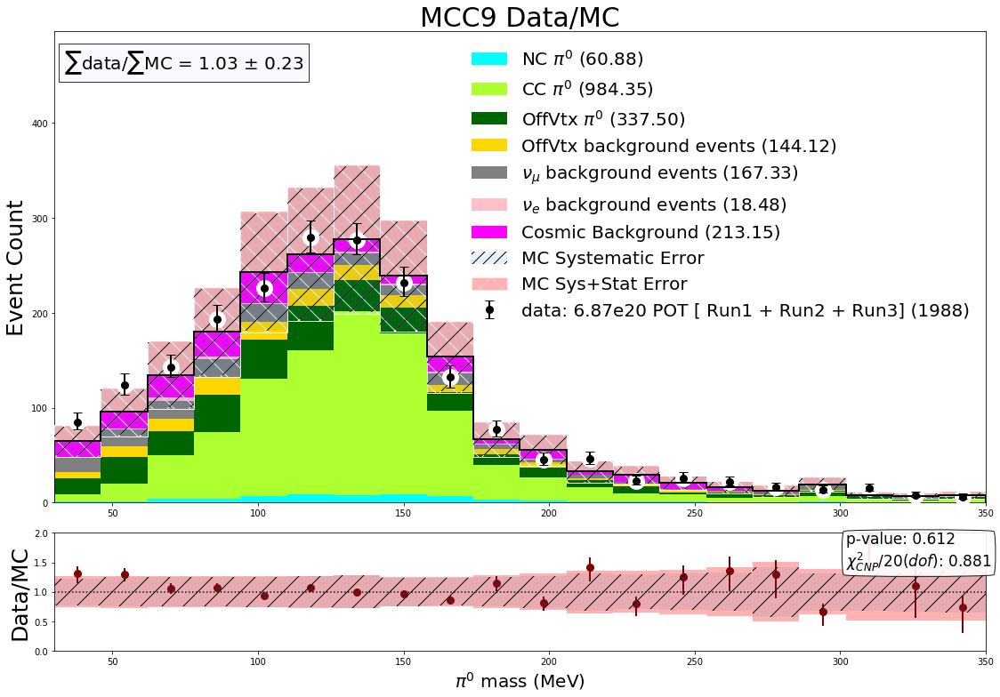

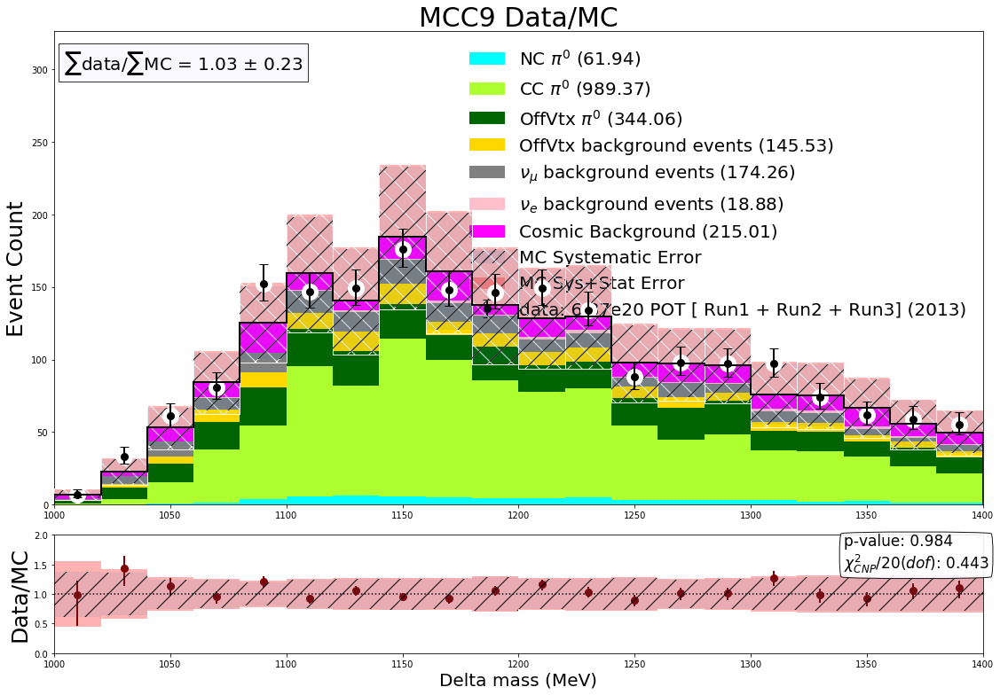

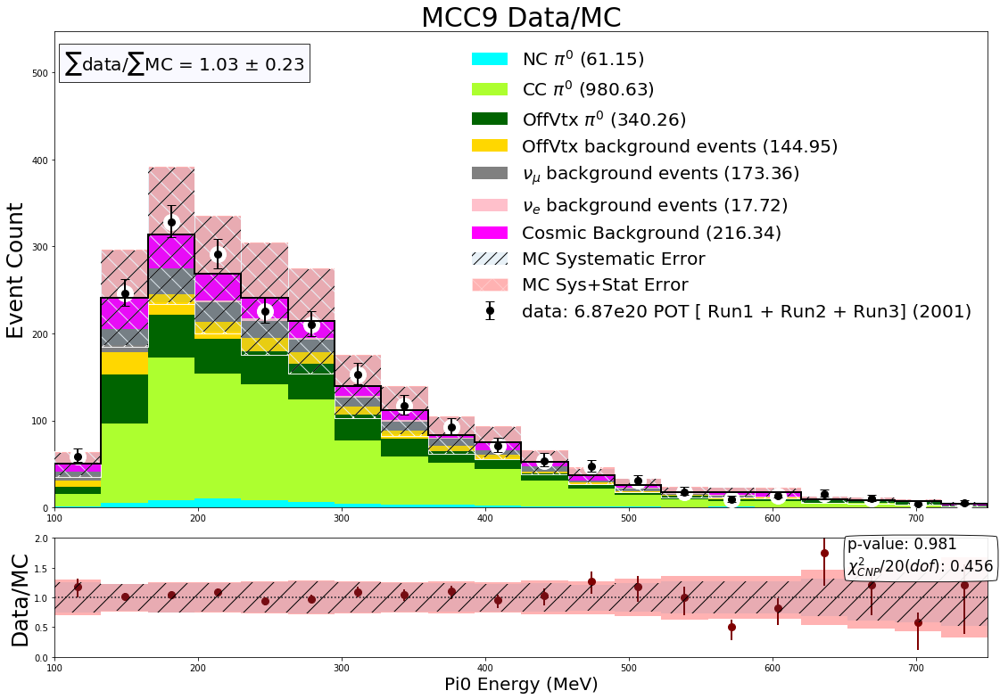

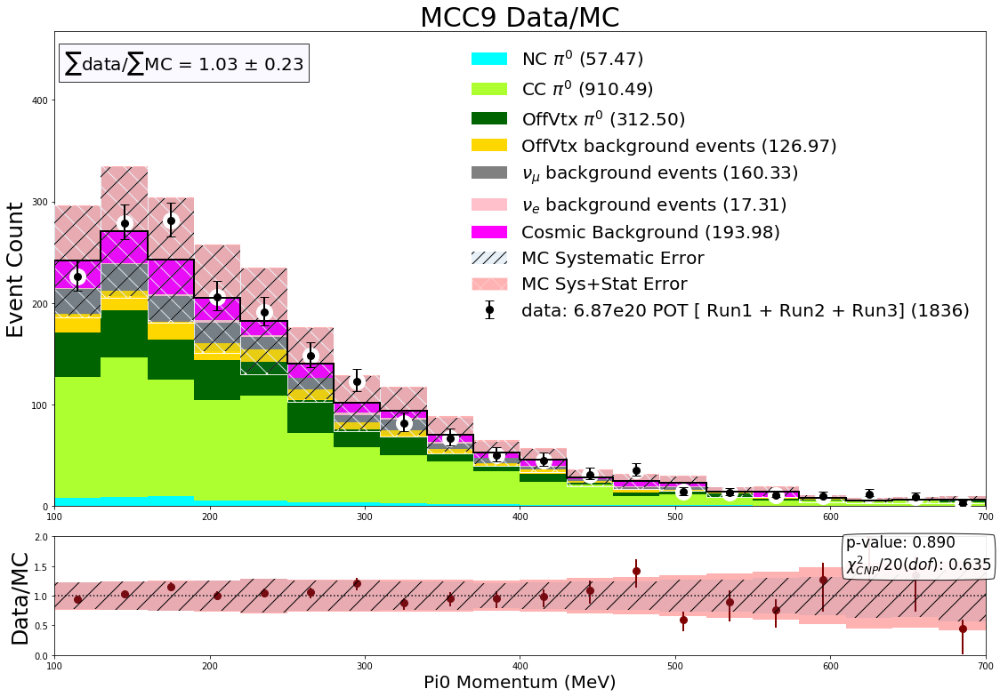

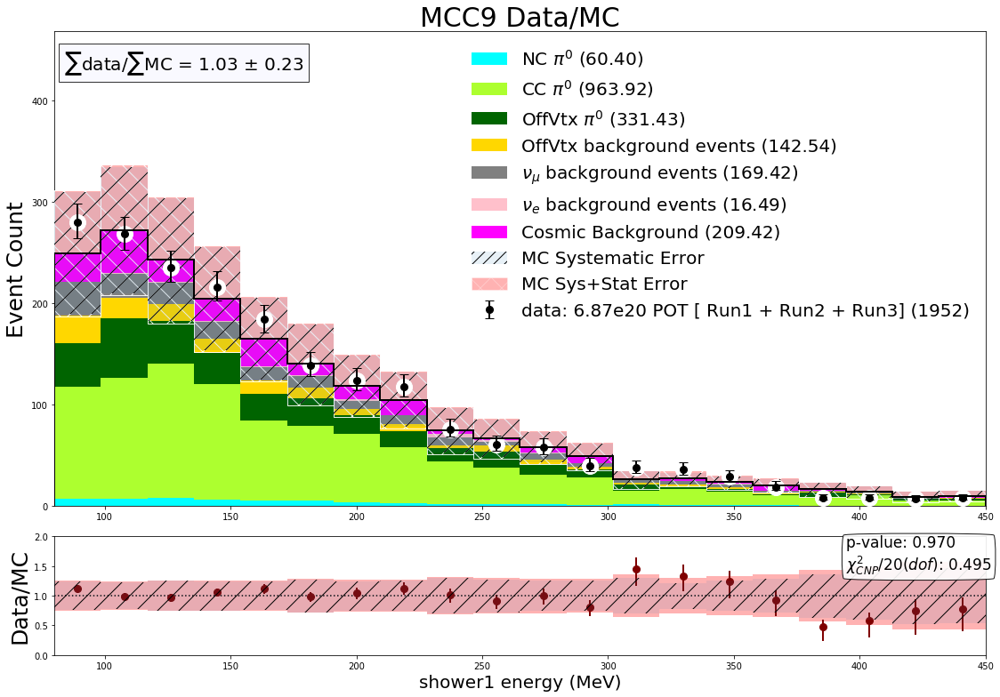

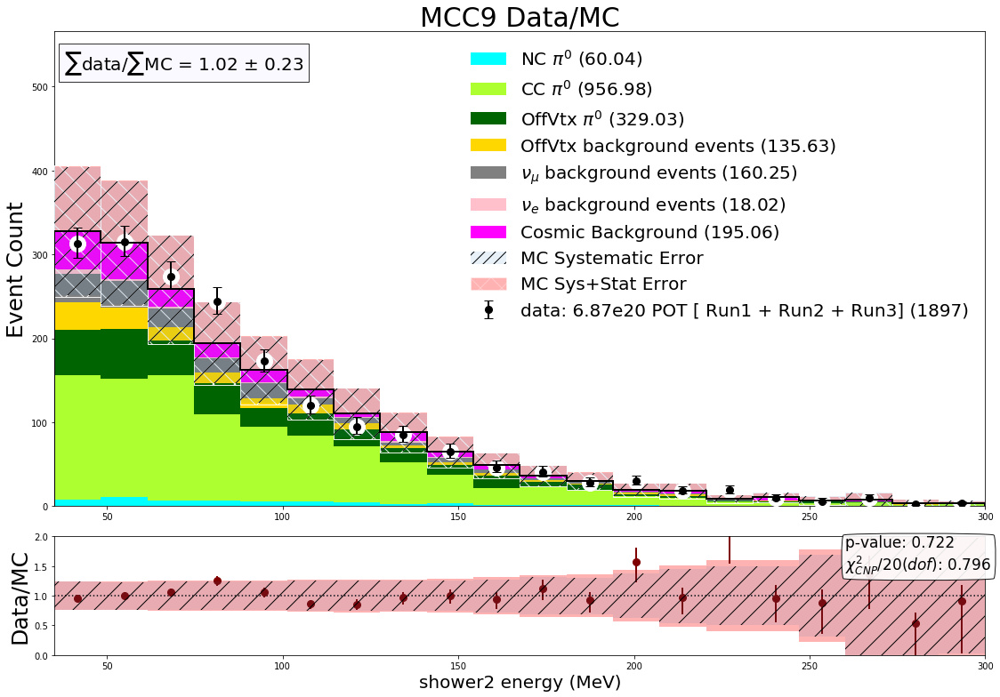

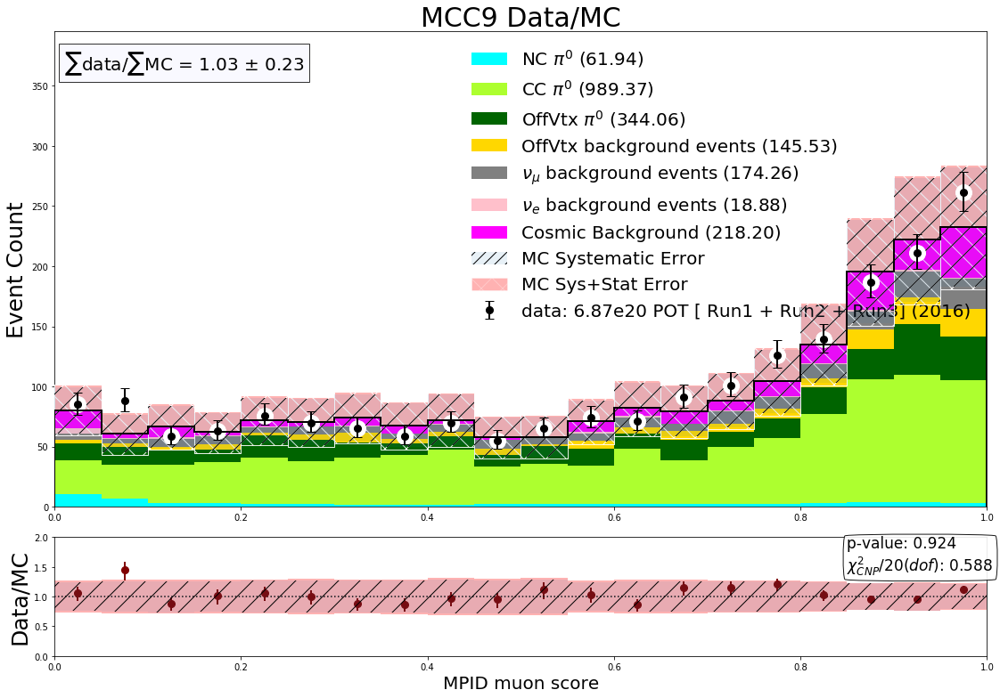

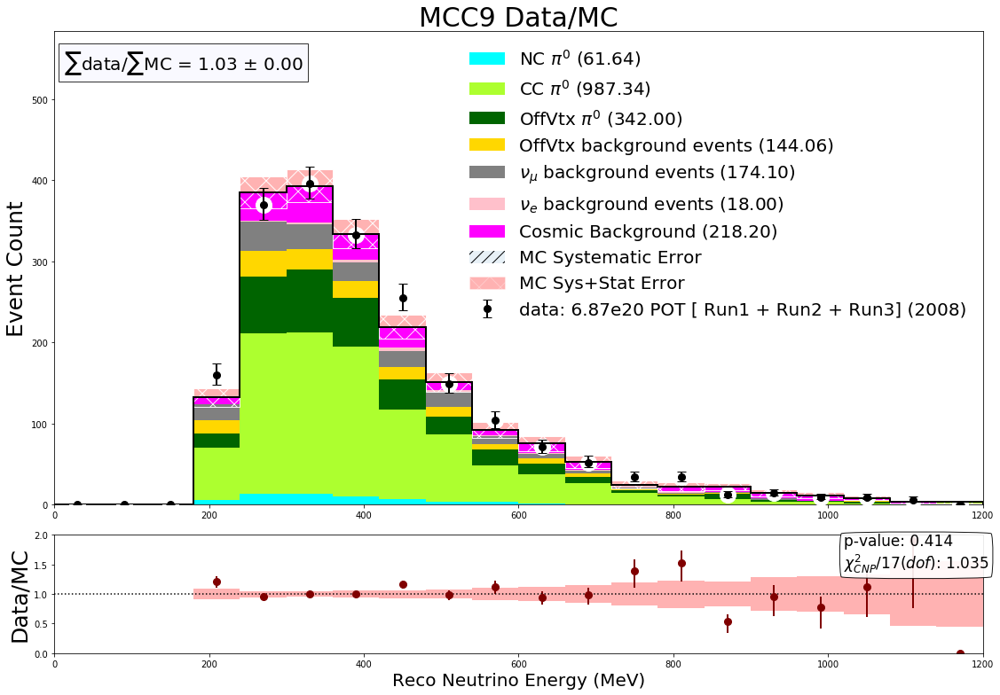

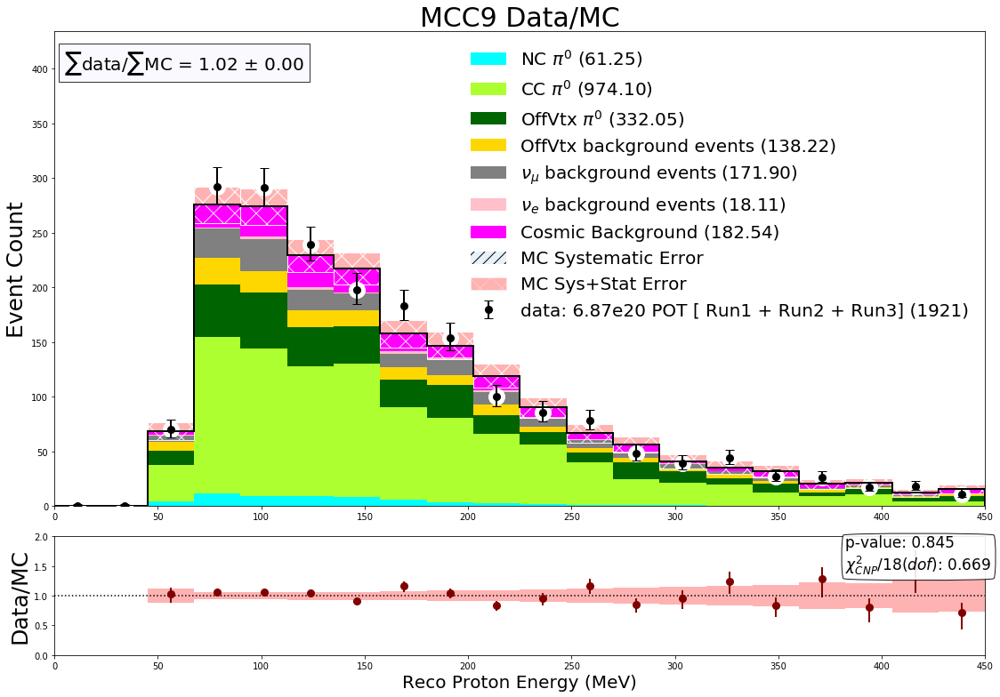

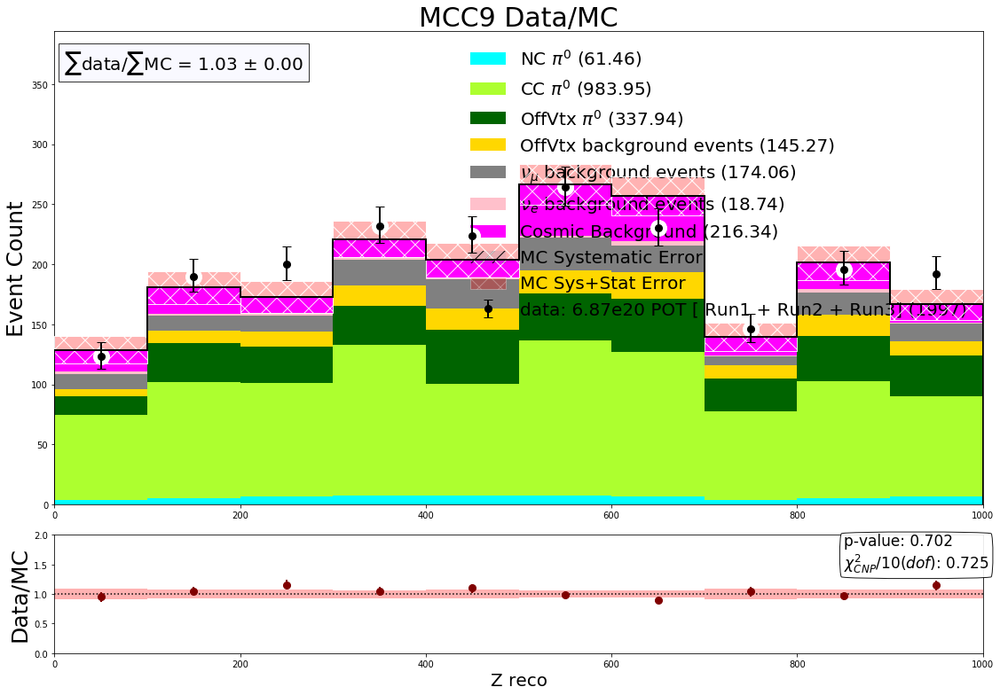

In [37]:
def getweights(df):
    a_CC= 2.75e-06
    b_CC= -0.0032
    c_CC = 1.553
#     a_NC = 1.7880514067943043e-06
#     b_NC = -0.0030618894546400556
#     c_NC= 1.423350491911423 


    a_NC = 1.7880514067943043e-06
    b_NC = -0.0030618894546400556
    c_NC= 1.423350491911423 
    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                if(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC <0):
                    weights.append(.001)
                else:
                    weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

def resetweights(df):
    weights_v = []
    for i in range(len(df)):
        weights_v.append(1.0)
    return weights_v

#reset new weights column
# df_numu_total.drop(['new_weight'], axis=1)
# df_nue_total.drop(['new_weight'], axis=1)
# df_ccpi0_total.drop(['new_weight'], axis=1)
# df_ncpi0_total.drop(['new_weight'], axis=1)

# now add in new weights
pi0_new4 = getweights(df_numu_total)
df_numu_total['new_weight'] = pi0_new4

pi0_new8 = resetweights(df_nue_total)
df_nue_total['new_weight'] = pi0_new8

pi0_new5 = getweights(df_ccpi0_total)
df_ccpi0_total['new_weight'] = pi0_new5

pi0_new6 = getweights(df_ncpi0_total)
df_ncpi0_total['new_weight'] = pi0_new6

# print(df_ncpi0_total['new_weight'])
# print(df_ccpi0_total['new_weight'])

with PdfPages('output_combined_20201109_weighted.pdf') as pdf:

    for i in range(len(vartest_list)):
        vartest = vartest_list[i]
        varname = varname_list[i]
        myrange = myrange_list[i]
        nbins =bins_list[i]
        
        if sys_list[i] == 'none':
            s_cov = np.zeros((nbins,nbins))
        else:
            s_cov = np.genfromtxt(sys_list[i],delimiter=',')
        
        if detvar1_list[i] == 'none':
            d_cov = np.zeros((nbins,nbins))
        else:
            d_cov1 = np.genfromtxt(detvar1_list[i],delimiter=',')
            d_cov3 = np.genfromtxt(detvar3_list[i],delimiter=',')
            d_cov = ((DATA_R1_PI0FILTER_POT)*d_cov1 + (DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)*d_cov3)/(DATA_R1_PI0FILTER_POT+DATA_R2D_PI0FILTER_POT+DATA_R2E_PI0FILTER_POT+DATA_R3F_PI0FILTER_POT+DATA_R3G_PI0FILTER_POT)
        
        cov = d_cov+s_cov
#         cov =np.zeros((nbins,nbins))
        run1_open_Hists = StackedHisto((df_numu_total.query('(newhaspi0==0 and MC_parentPDG ==14) or MC_parentPDG ==-14'),df_nue_total.query('MC_parentPDG ==12'),df_ncpi0_total,df_ccpi0_total),(1.0,1.0,1.0,1.0))
        run1_open_Hists.AddStrata('haspi0==1 and ccnc==1 and MC_scedr<5 ',r"NC $\pi^0$",'cyan')
        run1_open_Hists.AddStrata('haspi0==1 and ccnc!=1 and MC_scedr<5 ',r"CC $\pi^0$",'greenyellow')
        run1_open_Hists.AddStrata('haspi0==1 and MC_scedr>=5 ',r"OffVtx $\pi^0$",'darkgreen')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr>=5 ',r"OffVtx background events",'gold')
        run1_open_Hists.AddStrata('MC_parentPDG ==14 and haspi0==0 and MC_scedr<5',r"$\nu_\mu$ background events",'grey')
#         run1_open_Hists.AddStrata('MC_parentPDG ==14',r"$\nu_mu$ events",'blue')
        run1_open_Hists.AddStrata('MC_parentPDG ==12 and haspi0==0',r"$\nu_e$ background events",'pink')
        run1_open_Hists.AddLayer(df_ext_total,df_ext_total['pot_weight'],0,'Cosmic Background','fuchsia')
        run1_open_DataHist = SimpleHisto(df_data_total,1.0,0,'','data: 6.87e20 POT [ Run1 + Run2 + Run3]')
        fig1,ax1,_,a = distplot_wratio_davio(vartest,nbins,myrange,run1_open_Hists,run1_open_DataHist,varname,m_cov=cov)
        pdf.savefig(fig1)

In [ ]:
var_bnb_QE = df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Res = df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Dis = df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_Coh = df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")['pi0_momentum_reco'].values
var_bnb_MEC = df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")['pi0_momentum_reco'].values

print("QE count: ",len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print("Res count: ",len(df_numu_total.query("nu_interaction_mode ==1 and haspi0==1")))
print("Dis count: ",len(df_numu_total.query("nu_interaction_mode ==2 and haspi0==1")))
print("Coh count: ",len(df_numu_total.query("nu_interaction_mode ==3 and haspi0==1")))
print("MEC count: ",len(df_numu_total.query("nu_interaction_mode ==10 and haspi0==1")))

fig,ax = plt.subplots(figsize=(14,10))
_hists=[var_bnb_QE,var_bnb_Res,var_bnb_Dis,var_bnb_Coh,var_bnb_MEC]
tmp_colors = ['darkgreen','orange','magenta','gold','blue']
myrange = (0,800)
nbins = 20
ymax =1300
tmp_labels = ['QE'+' (%.2f)'%len(var_bnb_QE),'Res'+' (%.2f)'%len(var_bnb_Res),'DIS'+' (%.2f)'%len(var_bnb_Dis),'Coh'+' (%.2f)'%len(var_bnb_Coh),'MEC'+' (%.2f)'%len(var_bnb_MEC)]

fig.patch.set_alpha(1)
vals_mc = np.zeros(nbins)

for i in range(0,len(_hists)):
    v1,binedges = np.histogram(_hists[i],nbins,range=myrange)
    vals_mc += v1

print (vals_mc, sum(vals_mc))


bincenters = np.diff(binedges)/2 + binedges[:-1]     

plt.ylim(0,ymax)
plt.xlim(myrange)
ax.set_xlabel("Pi0 Momentum (MeV)",fontsize=20)
ax.set_ylabel('NEntries',fontsize=20)
ax.set_title('MCC9 MC',fontsize=30)

plt.hist(_hists,nbins,range=myrange,color=tmp_colors,stacked=True,linewidth=2.5,label=tmp_labels,edgecolor='None')

ax.legend(loc='upper right',fontsize=15,frameon=False,ncol=3)

print(len(df_numu_total.query("nu_interaction_mode ==0 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_type ==1096 and haspi0==1")))
print(len(df_numu_total.query("nu_interaction_mode ==0 and nu_interaction_type ==1096 and haspi0==1 and MC_scedr<5")))

## Save selection for Lauren

In [ ]:
def getpi0weights(df):
    a_CC= 3.425e-06
    b_CC= -0.0039
    c_CC = 1.784

    a_NC= 1.885e-06
    b_NC= -0.00316
    c_NC = 1.442


    weights =[]
    mom = df['pi0_momentum_true'].values
    pi0s = df['_pi0mass'].values
    ccnc = df['ccnc'].values

    for i in range(len(mom)):
        if pi0s[i] > 0 and a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC <4:
            if ccnc[i]==0:
                weights.append(a_CC*(mom[i]**2)+b_CC*mom[i]+c_CC)
            else:
                weights.append(a_NC*(mom[i]**2)+b_NC*mom[i]+c_NC)
        else:
            weights.append(1.0)
    return weights

weights1mu = getpi0weights(df_numu_1mil_pi0)
weights2mu = getpi0weights(df_numu_r2_1mil_pi0)
weights3mu = getpi0weights(df_numu_r3_pi0)
weights1e = getpi0weights(df_nue_pi0)
weights2e = getpi0weights(df_nue_r2_pi0)
weights3e = getpi0weights(df_nue_r3_pi0)
weights1cc = getpi0weights(df_ccpi0_r1_pi0)
weights3cc = getpi0weights(df_ccpi0_r3_pi0)
weights1nc = getpi0weights(df_ncpi0_r1_pi0)
weights3nc = getpi0weights(df_ncpi0_r3_pi0)

df_numu_1mil_pi0['pi0_weight']=weights1mu
df_numu_r2_1mil_pi0['pi0_weight']=weights2mu
df_numu_r3_pi0['pi0_weight']=weights3mu
df_nue_pi0['pi0_weight']=weights1e
df_nue_r2_pi0['pi0_weight']=weights2e
df_nue_r3_pi0['pi0_weight']=weights3e
df_ccpi0_r1_pi0['pi0_weight']=weights1cc
df_ccpi0_r3_pi0['pi0_weight']=weights3cc
df_ncpi0_r1_pi0['pi0_weight']=weights1nc
df_ncpi0_r3_pi0['pi0_weight']=weights3nc

In [ ]:
df_numu_pi0=df_numu_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_pi0=df_nue_pi0.query("MC_parentPDG ==12")

# file1 = open("2021Apr02_pi0selection_bnb_overlay_run1.txt","w")
# file1.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_numu_pi0)):
#     teststr = "[" +str(df_numu_pi0['run'].values[event])+","+str(df_numu_pi0['subrun'].values[event])+","+str(df_numu_pi0['event'].values[event])+","+str(df_numu_pi0['_pi0mass_new'].values[event])+","+str(df_numu_pi0['DeltaMass_new'].values[event])
#     teststr2 =","+ str(df_numu_pi0['shower1_E_Y_new'].values[event])+","+str(df_numu_pi0['shower2_E_Y_new'].values[event])+","+ str(df_numu_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_numu_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_numu_pi0['MPID_muon'].values[event])+","+ str(df_numu_pi0['pi0_weight'].values[event])+"]"+"\n"
#     file1.write(teststr+teststr2)
# file1.close()


# file2 = open("2021Apr02_pi0selection_nue_intrinsic_run1.txt","w")
# file2.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_nue_pi0)):
#     teststr = "[" +str(df_nue_pi0['run'].values[event])+","+str(df_nue_pi0['subrun'].values[event])+","+str(df_nue_pi0['event'].values[event])+","+str(df_nue_pi0['_pi0mass_new'].values[event])+","+str(df_nue_pi0['DeltaMass_new'].values[event])
#     teststr2 =","+  str(df_nue_pi0['shower1_E_Y_new'].values[event])+","+str(df_nue_pi0['shower2_E_Y_new'].values[event])+","+ str(df_nue_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_nue_pi0['pi0_momentum_reco_new'].values[event])+","+ str(df_nue_pi0['MPID_muon'].values[event])+","+ str(df_nue_pi0['pi0_weight'].values[event])+"]"+"\n"
#     file2.write(teststr+teststr2)
# file2.close()

# file3 = open("2021Apr02_pi0selection_ext_run1.txt","w")
# file3.write("[run,subrun,event,pi0mass, deltamass, shower1_energy, shower2_energy, pi0energy, pi0momentum,MPID_muon, weight]\n")
# for event in range(len(df_ext_pi0)):
#     teststr = "[" +str(df_ext_pi0['run'].values[event])+","+str(df_ext_pi0['subrun'].values[event])+","+str(df_ext_pi0['event'].values[event])+","+str(df_ext_pi0['_pi0mass_new'].values[event])+","+str(df_ext_pi0['DeltaMass_new'].values[event])
#     teststr2 = ","+ str(df_ext_pi0['shower1_E_Y_new'].values[event])+","+str(df_ext_pi0['shower2_E_Y_new'].values[event])+","+ str(df_ext_pi0['pi0_energy_reco_new'].values[event])+","+ str(df_ext_pi0['pi0_momentum_reco'].values[event])+","+ str(df_ext_pi0['MPID_muon'].values[event])+","+'1.0'+"]"+"\n"
#     file3.write(teststr+teststr2)
# file3.close()


file1 = open("2021May31_fullpi0selection_bnb_overlay_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_numu_pi0)):
    teststr = "[" +str(df_numu_pi0['run'].values[event])+","+str(df_numu_pi0['subrun'].values[event])+","+str(df_numu_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run1.txt","w")
file2.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_nue_pi0)):
    teststr = "[" +str(df_nue_pi0['run'].values[event])+","+str(df_nue_pi0['subrun'].values[event])+","+str(df_nue_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021May31_fullpi0selection_ext_run1.txt","w")
file3.write("[run,subrun,event,weight, reco Enu]\n")
for event in range(len(df_ext_pi0)):
    teststr = "[" +str(df_ext_pi0['run'].values[event])+","+str(df_ext_pi0['subrun'].values[event])+","+str(df_ext_pi0['event'].values[event])
    teststr2 = ","+ "1.0"+ ","+ str(df_ext_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()


In [ ]:
df_numu_r2_1mil_pi0=df_numu_r2_1mil_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r2_pi0=df_nue_r2_pi0.query("MC_parentPDG ==12")

file1 = open("2021May31_fullpi0selection_bnb_overlay_run2.txt","w")
file1.write("[run,subrun,event,pi0mass, weight, reco Enu,true neutrino energy]\n")
for event in range(len(df_numu_r2_1mil_pi0)):
    teststr = "[" +str(df_numu_r2_1mil_pi0['run'].values[event])+","+str(df_numu_r2_1mil_pi0['subrun'].values[event])+","+str(df_numu_r2_1mil_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_r2_1mil_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_r2_1mil_pi0['Enu_1e1p'].values[event])+ "," +str(df_numu_r2_1mil_pi0['nu_energy_true'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run2.txt","w")
file2.write("[run,subrun,event,pi0mass, weight, reco Enu,true neutrino energy]\n")
for event in range(len(df_nue_r2_pi0)):
    teststr = "[" +str(df_nue_r2_pi0['run'].values[event])+","+str(df_nue_r2_pi0['subrun'].values[event])+","+str(df_nue_r2_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_r2_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_r2_pi0['Enu_1e1p'].values[event])+ "," +str(df_nue_r2_pi0['nu_energy_true'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()


In [ ]:
df_numu_r3_pi0=df_numu_r3_pi0.query('(MC_parentPDG ==14  and newhaspi0==0) or MC_parentPDG ==-14')
df_nue_r3_pi0=df_nue_r3_pi0.query("MC_parentPDG ==12")

file1 = open("2021May31_fullpi0selection_bnb_overlay_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_numu_r3_pi0)):
    teststr = "[" +str(df_numu_r3_pi0['run'].values[event])+","+str(df_numu_r3_pi0['subrun'].values[event])+","+str(df_numu_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_numu_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_numu_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()


file2 = open("2021May31_fullpi0selection_nue_intrinsic_run3.txt","w")
file2.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_nue_r3_pi0)):
    teststr = "[" +str(df_nue_r3_pi0['run'].values[event])+","+str(df_nue_r3_pi0['subrun'].values[event])+","+str(df_nue_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_nue_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_nue_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file2.write(teststr+teststr2)
file2.close()

file3 = open("2021May31_fullpi0selection_ext_run3.txt","w")
file3.write("[run,subrun,event,weight, reco Enu]\n")
for event in range(len(df_ext_r3_pi0)):
    teststr = "[" +str(df_ext_r3_pi0['run'].values[event])+","+str(df_ext_r3_pi0['subrun'].values[event])+","+str(df_ext_r3_pi0['event'].values[event])
    teststr2 = ","+ "1.0"+ ","+ str(df_ext_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file3.write(teststr+teststr2)
file3.close()

In [ ]:
file1 = open("2021May31_fullpi0selection_CCPi0_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ccpi0_r1_pi0)):
    teststr = "[" +str(df_ccpi0_r1_pi0['run'].values[event])+","+str(df_ccpi0_r1_pi0['subrun'].values[event])+","+str(df_ccpi0_r1_pi0['event'].values[event])
    teststr2 = ","+ str(df_ccpi0_r1_pi0['pi0_weight'].values[event])+ ","+ str(df_ccpi0_r1_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021May31_fullpi0selection_CCPi0_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ccpi0_r3_pi0)):
    teststr = "[" +str(df_ccpi0_r3_pi0['run'].values[event])+","+str(df_ccpi0_r3_pi0['subrun'].values[event])+","+str(df_ccpi0_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_ccpi0_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_ccpi0_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()



In [ ]:
file1 = open("2021May31_fullpi0selection_NCPi0_run1.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ncpi0_r1_pi0)):
    teststr = "[" +str(df_ncpi0_r1_pi0['run'].values[event])+","+str(df_ncpi0_r1_pi0['subrun'].values[event])+","+str(df_ncpi0_r1_pi0['event'].values[event])
    teststr2 = ","+ str(df_ncpi0_r1_pi0['pi0_weight'].values[event])+ ","+ str(df_ncpi0_r1_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()

file1 = open("2021May31_fullpi0selection_NCPi0_run3.txt","w")
file1.write("[run,subrun,event, weight, reco Enu]\n")
for event in range(len(df_ncpi0_r3_pi0)):
    teststr = "[" +str(df_ncpi0_r3_pi0['run'].values[event])+","+str(df_ncpi0_r3_pi0['subrun'].values[event])+","+str(df_ncpi0_r3_pi0['event'].values[event])
    teststr2 = ","+ str(df_ncpi0_r3_pi0['pi0_weight'].values[event])+ ","+ str(df_ncpi0_r3_pi0['Enu_1e1p'].values[event])+"]"+"\n"
    file1.write(teststr+teststr2)
file1.close()
